# Trabalho Final de Sistemas Lineares I

Nome: Gabriel Henrique Braga Lisboa

DRE: 120095995

Curso: Engenharia Eletrônica e de Computação

Período: 2022.2

Universidade Federal do Rio de Janeiro

In [1]:
import cmath
import numpy as np
import matplotlib.pyplot as plt
import random
from scipy import signal
from scipy.signal import bessel, lsim, lti, impulse, step, freqs, tf2zpk

OBS : Por questões de praticidade, as letras (B) e (C) da Questão 1, que são relativas aos projetos, estão situadas no começo deste documento.

# Projeto Afinador de Corda de Violão

## Introdução

  O projeto de um afinador de corda de violão consiste na montagem de um circuito passa-banda, que servirá como filtro para reconhecer as frequências geradas pela corda do violão, e atenuá-las caso a frequência gerada não corresponda à frequência da corda na afinação correta. 

  A partir desse filtro, será possível afinar a corda do violão, produzindo sons e regulando a afinação até que as ondas sonoras produzidas estejam dentro da banda estipulada e, portanto, não sejam atenuadas, indicando que a corda está na afinação correta. 

  A corda escolhida para o projeto foi a Si, pois é a segunda maior frequência ideal entre as cordas e possui um bom intervalo de frequência entre ela e outros acordes, possibilitando criar um filtro com um intervalo de banda maior e facilitando a montagem do projeto, visto que os componentes disponíveis limitam a precisão e produzem incertezas sistemáticas. Além disso, escolher uma corda que não tenha a maior ou a menor frequência (esteja no "meio"), nos permitirá traçar melhor o intervalo da banda e testar a efetividade do filtro.

  A faixa de frequência idealizada para esse filtro será entre 212 Hz e 284 Hz, visto que a frequência padrão da corda Si é de 247 Hz. (A faixa tende a ser mais tolerante a frequências maiores por questões técnicas do instrumento e modalidades de afinação). Com esse intervalo de banda, a frequência ideal da corda Si possui um valor próximo do valor médio desse intervalo (1 Hz a menos), o que faz com que este seja um dos valores de frequência menos atenuados pelo filtro.

  O público-alvo do projeto é, obviamente, aqueles que tocam violão, e precisam do afinador para que as notas referentes a cada corda sejam reproduzidas na frequência certa, para que o som possa sair com melhor qualidade e o músico possa tocar as composições da maneira correta.

## Custo do projeto

Componentes do circuito:

1 resistor de 560R 5% (1/4W) - R\$ 0,05

1 resistor de 750R 5% (1/4W) - R\$ 0,05

2 capacitores de 1$\mu$F / 50V - R\$ 0,23 cada - Total: R\$ 0,46

Protoboard 830 Pontos MB-102 - R\$ 16,92

Total: R\$ 17,48

---

Custo da mão de obra:

Pode-se considerar que um técnico em Eletrônica tem a bagagem necessária para realizar esse projeto. De acordo com o site "glassdoor", a média salarial deste profissional no mercado brasileiro é de $R\$$ 2690 / mês. Considerando 160 horas de trabalho em um mês, o que equivale a 4 semanas trabalhando 40 horas semanais, temos um custo de mão de obra de R\$ 16,81 / hora.

Estamos considerando que o técnico em Eletrônica tem experiência com esse tipo de projeto, e que o circuito a ser montado é simples. Portanto, é possível estimar que ele consiga montar o circuito em 1 hora.

Com isso, temos que seriam gastos em pagamento da mão de obra R\$ 16,81 por circuito montado.

---

Custo total:

Analisando o que temos, podemos fixar o custo total desse projeto com o valor de R\$ 34,29 por circuito.



## Modelagem do Circuito

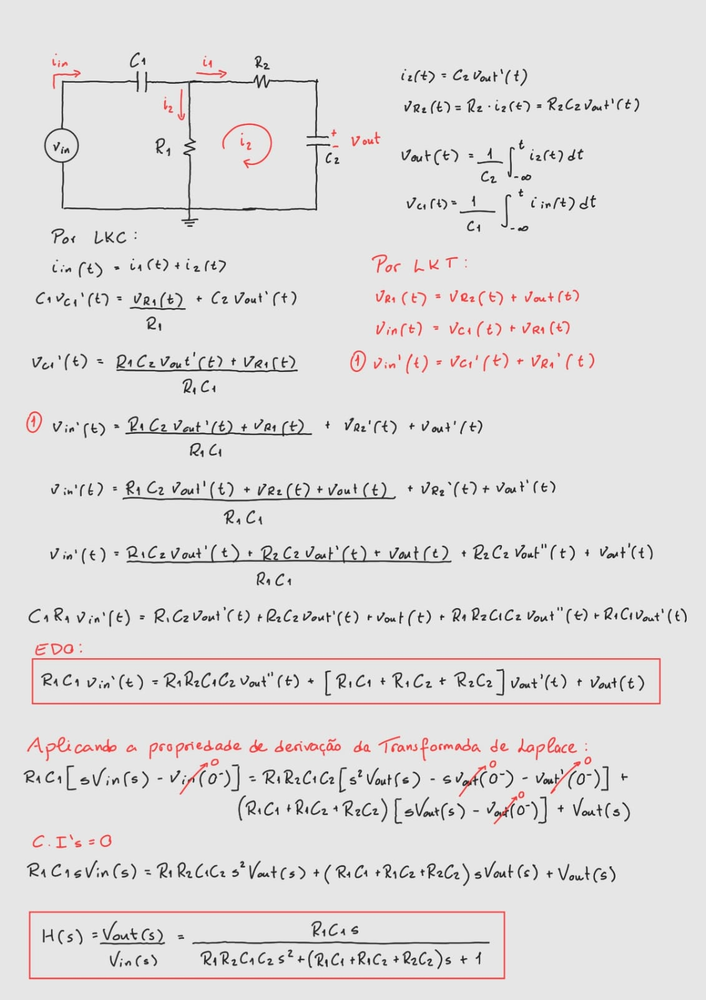

## Diagrama de Polos e Zeros


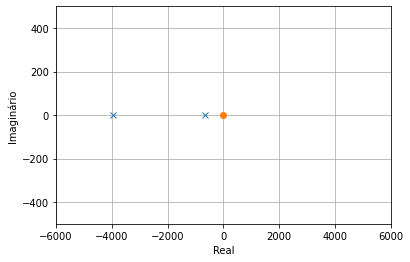

<Figure size 72x288 with 0 Axes>

In [2]:
R1 = 510
R2 = 750
C1 = 1 * (10**(-6))
C2 = 1 * (10**(-6))

(zeros, poles, gain) = tf2zpk([R1*C1, 0], [R1*R2*C1*C2, (R1*C1 + R1*C2 + R2*C2), 1])
angle = np.linspace(-np.pi, np.pi, 500)
cirx = np.sin(angle)
ciry = np.cos(angle)

plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
plt.grid()
plt.xlim((-6000, 6000))
plt.xlabel('Real')
plt.ylim((-500, 500))
plt.ylabel('Imaginário')
plt.figure()

plt.gcf().set_figwidth(1)

Pelo diagrama de polos e zeros percebe-se que esse sistema é assintóticamente estável, pois todos os seus polos estão situados no Semi-Plano Lateral Esquerdo (SPLE).

## Diagrama de Bode

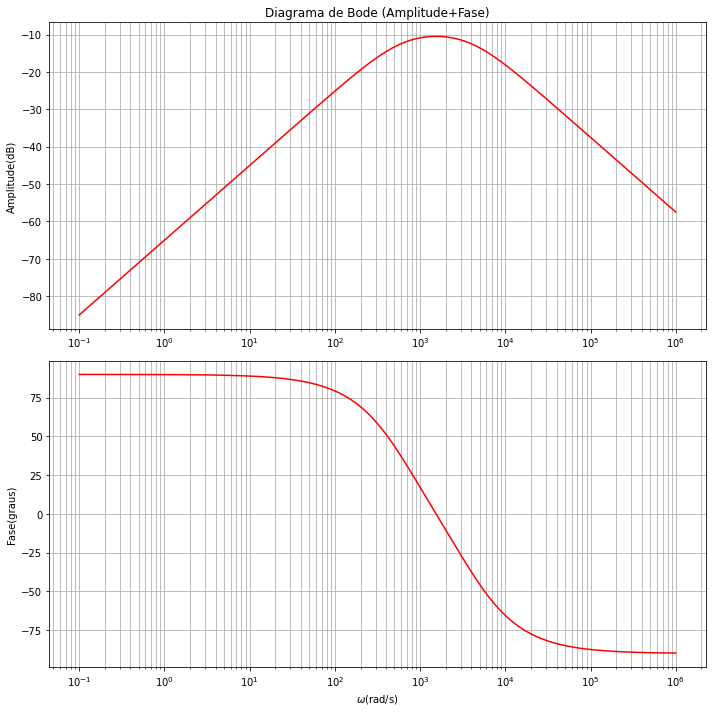

In [3]:
R1 = 560
R2 = 750
C1 = 1 * (10**(-6))
C2 = 1 * (10**(-6))

sys = signal.TransferFunction([R1*C1, 0], [R1*R2*C1*C2, (R1*C1 + R1*C2 + R2*C2), 1])

w = np.logspace(-1,6,num=100, base=10.0)
w, mag, fase = signal.bode(sys,w=w,n=200)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].semilogx(w,mag, label='Magnitude', color='r') # Plot do Diagrama de Magnitude
graf[0].set_ylabel('Amplitude(dB)')
graf[0].grid(True, which="both", ls="-")

graf[1].semilogx(w,fase, label='Fase', color='r') # Plot do Diagrama de Fase
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('$\omega$(rad/s)')
graf[1].grid(True, which="both", ls="-")

plt.tight_layout()
plt.show()

Como esperado, o diagrama de Bode desse sistema corresponde ao de um filtro passa-faixa, pois ele atenua as frequências mais altas e mais baixas do que a banda passante. O intervalo de banda desse filtro está entre 212 e 284 Hz, ou 1332 e 1784 rad/s.

A fase varia entre 90° e -90°, que corresponde a diferença de fase quando o filtro atua como passa-alta e como passa-baixa.

É possível perceber que o circuito possui um coeficiente de amortecimento pequeno, já que a função de transferência tem um polo de segunda ordem.

Por não ser um filtro ideal, o sinal não irá passar 100% livre nas frequências dentro do intervalo da banda, havendo uma atenuação mínima nesse caso.

## Resposta ao Degrau Unitário

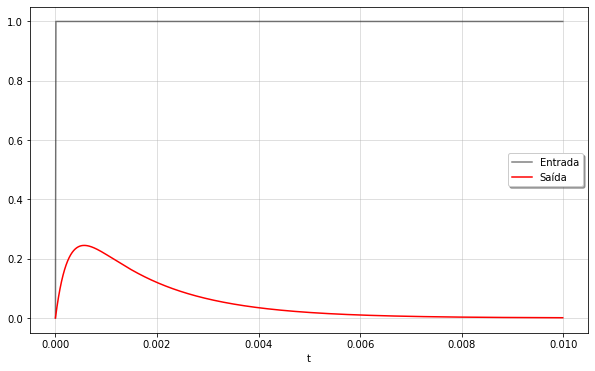

In [4]:
R1 = 560
R2 = 750
C1 = 1 * (10**(-6))
C2 = 1 * (10**(-6))

#Definindo a variável de tempo
t=np.linspace(0, 0.01,1000,endpoint=False)
input=np.zeros_like(t)
input[t>0.0] = 1

#Definição da função de transferência e do degrau unitário
sys = signal.TransferFunction([R1*C1, 0], [R1*R2*C1*C2, (R1*C1 + R1*C2 + R2*C2), 1])
tout, yout = signal.step(sys, T=t)

plt.figure(figsize=(10,6))  
plt.plot(t,input,'k',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout, yout, "r", linewidth=1.5, label='Saída')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.5)
plt.xlabel('t')
plt.show()

Nas fases constantes do degrau unitário, ele é um sinal de frequência muito baixa, e na fase de subida ele é um sinal de frequência muito alta. Como o circuito é um passa-faixa, essas frequências fora da banda serão atenuadas. Essa subida inicial se deve ao atraso na resposta do filtro prático, causando um pico de amplitude no início do sinal de saída, mas que não alcança a amplitude do degrau unitário, pois o sinal é atenuado.

## Resposta à Rampa Unitária

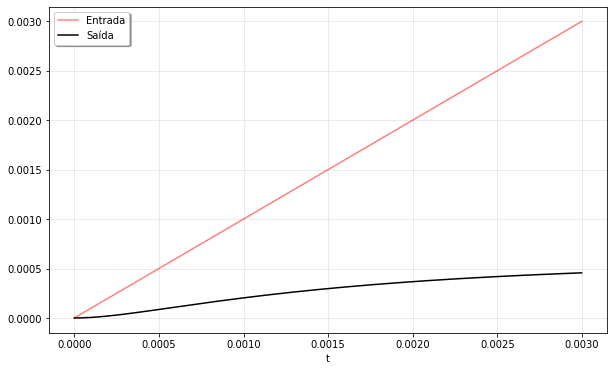

In [5]:
# Valores dos Componentes
R1 = 560
R2 = 750
C1 = 1 * (10**(-6))
C2 = 1 * (10**(-6))

t=np.linspace(0,0.003,1000,endpoint=False)
u=t

sys1 = lti([R1*C1, 0], [R1*R2*C1*C2, (R1*C1 + R1*C2 + R2*C2), 1])
tout, yout, xout = lsim(sys1,U=u,T=t)

plt.figure(figsize=(10,6))
plt.plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout,yout,'k',linewidth=1.5,label='Saída')
plt.legend(loc='upper left',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

A maior parte do sinal rampa unitária está concentrada em baixíssimas frequências, portanto o sinal será majoritariamente atenuado pelo passa-faixa. Há apenas uma pequena subida inicial na resposta, que se estabiliza ao longo do tempo.

## Resposta a uma onda quadrada de frequência $\omega$

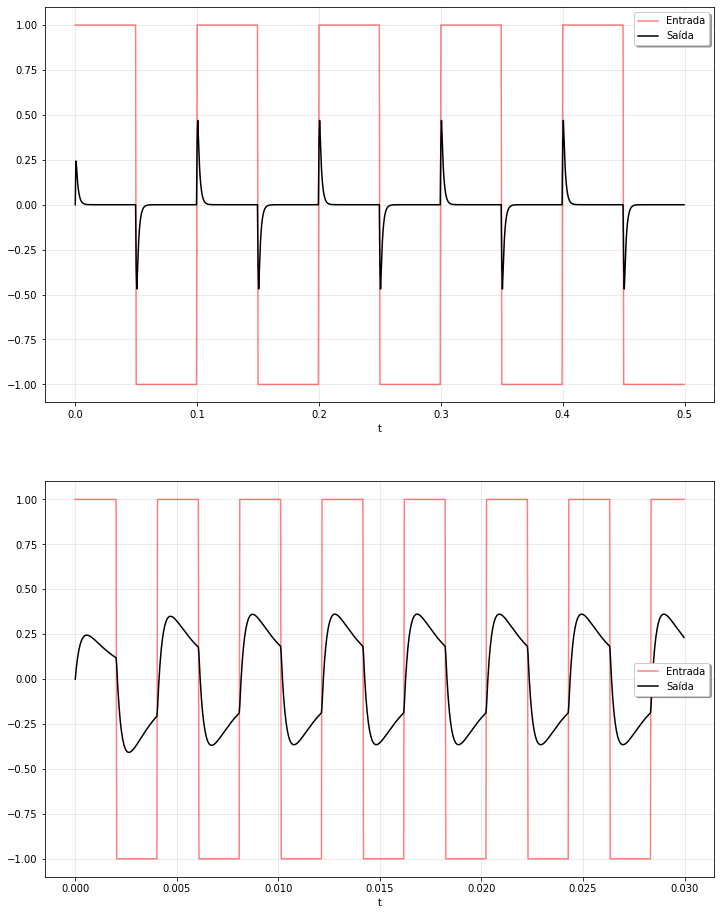

In [6]:
# Como as frequências no projeto estão sendo trabalhadas em hz,
# preferi manter assim no codigo, para depois passar para rad/s,
# para ter uma referencia maior na hora de escolher os valores.

# Foi escolhido uma frequência f de 10 Hz, muito fora da banda passante
f = 10
w = 2*(np.pi)*f

R1 = 560
R2 = 750
C1 = 1 * (10**(-6))
C2 = 1 * (10**(-6))

#Função de transferência
sys = signal.lti([R1*C1, 0], [R1*R2*C1*C2, (R1*C1 + R1*C2 + R2*C2), 1])

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (12,16), sharex = False)

#Definição da variável tempo e da onda quadrada
t = np.linspace(0, 0.5, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys, U=u, T=t)


graf[0].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')


# Aumentando a frequência e colocando-a dentro do intervalo da banda passante, podemos perceber que o sinal será menos atenuado.
# Pro segundo gráfico, utilizei f = 247 Hz, que é a frequência ideal da corda Si, a corda que queremos afinar.
f1 = 247
w1 = 2*(np.pi)*f1

t = np.linspace(0, 0.03, 1000, endpoint=False)
u = signal.square(t*w1)

tout, yout, xout = lsim(sys, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()


No primeiro gráfico, como foi escolhida uma frequência muito abaixo do intervalo de banda do filtro, o sinal foi quase todo atenuado, sobrando apenas alguns picos, quaso como impulsos. 

Já no segundo gráfico, onde foi escolhida a frequência ideal da corda Si, o sinal sofre atenuação mínima, provocada pelo fato do filtro não ser ideal.

## Resposta aos n harmônicos da série de Fourier de uma onda quadrada de frequência $ω$

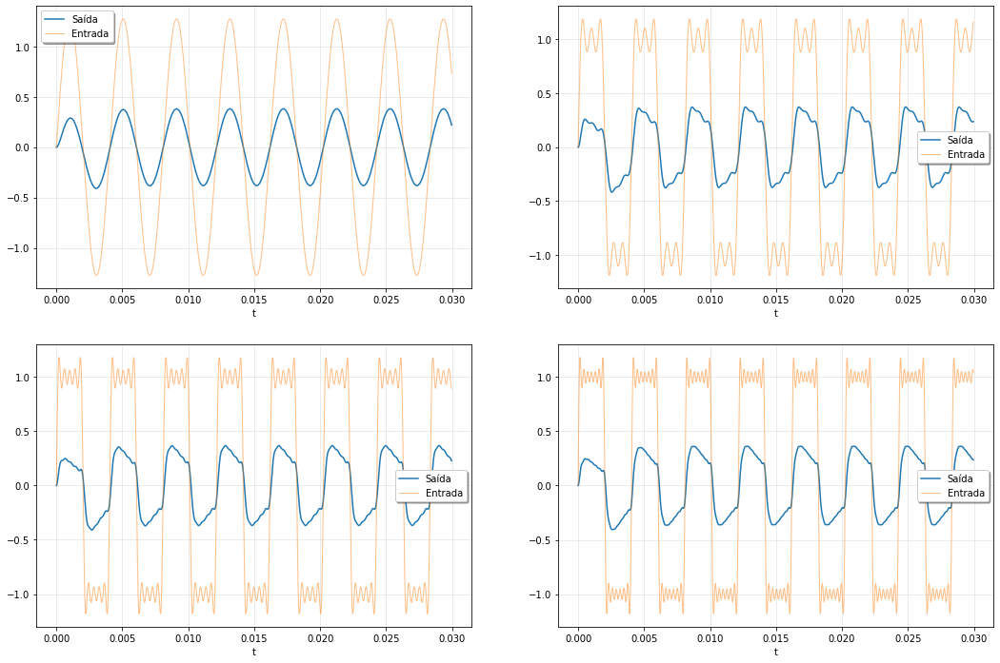

In [7]:
# Valores dos componentes
R1 = 560
R2 = 750
C1 = 1 * (10**(-6))
C2 = 1 * (10**(-6))

f = 247
w = 2*(np.pi)*f

t = np.linspace(0, 0.03, 1000, endpoint=False)

#Função de transferência
sys = signal.lti([R1*C1, 0], [R1*R2*C1*C2, (R1*C1 + R1*C2 + R2*C2), 1])

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input1 = soma * 4/(np.pi)

tout, yout, xout = signal.lsim(sys, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input2 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys, U=input3, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)

tout, yout, xout = signal.lsim(sys, U=input3, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à onda quadrada na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a onda quadrada, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à onda quadrada.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à onda quadrada, mas também com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da onda quadrada, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à onda quadrada para este sistema.

## Resposta a uma Dente de Serra de frequência $ω$

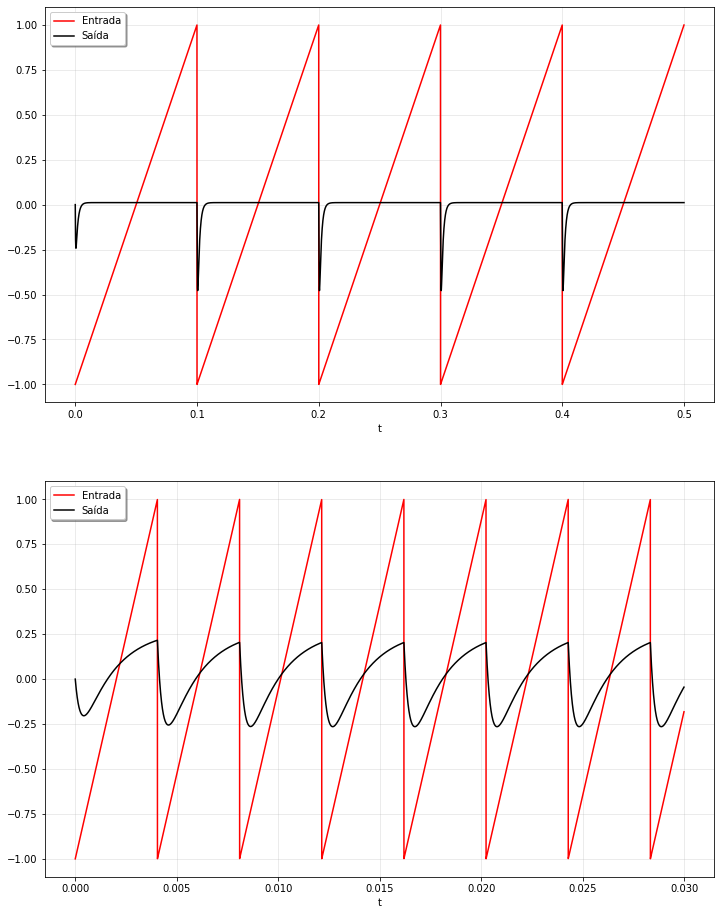

In [8]:
# Valores dos componentes
R1 = 560
R2 = 750
C1 = 1 * (10**(-6))
C2 = 1 * (10**(-6))

# Foi escolhido uma frequência f de 10 Hz, muito fora da banda passante
f = 10
w = 2*(np.pi)*f

#Função de transferência
sys = lti([R1*C1, 0], [R1*R2*C1*C2, (R1*C1 + R1*C2 + R2*C2), 1])

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (12,16), sharex = False)

#Definição da variável tempo e do sinal
t = np.linspace(0, 0.5, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys, U=u, T=t)

graf[0].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')


# Como foi feito com a onda quadrada, aumentando a frequência e colocando-a no 
# intervalo da banda passante, podemos perceber que o sinal será bem menos atenuado.

f1 = 247
w1 = 2*(np.pi)*f1

t = np.linspace(0, 0.03, 10000, endpoint=False)
u = signal.sawtooth(w1*t)

tout, yout, xout = lsim(sys, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()

No primeiro gráfico, como foi escolhida uma frequência muito abaixo do intervalo de banda do filtro, o sinal foi quase todo atenuado, sobrando apenas alguns picos, quaso como impulsos negativos. 

Já no segundo gráfico, onde foi escolhida a frequência ideal da corda Si, o sinal sofre atenuação mínima, provocada pelo fato do filtro não ser ideal.

## Resposta aos n harmônicos da série de Fourier de uma dente de serra de frequência $ω$

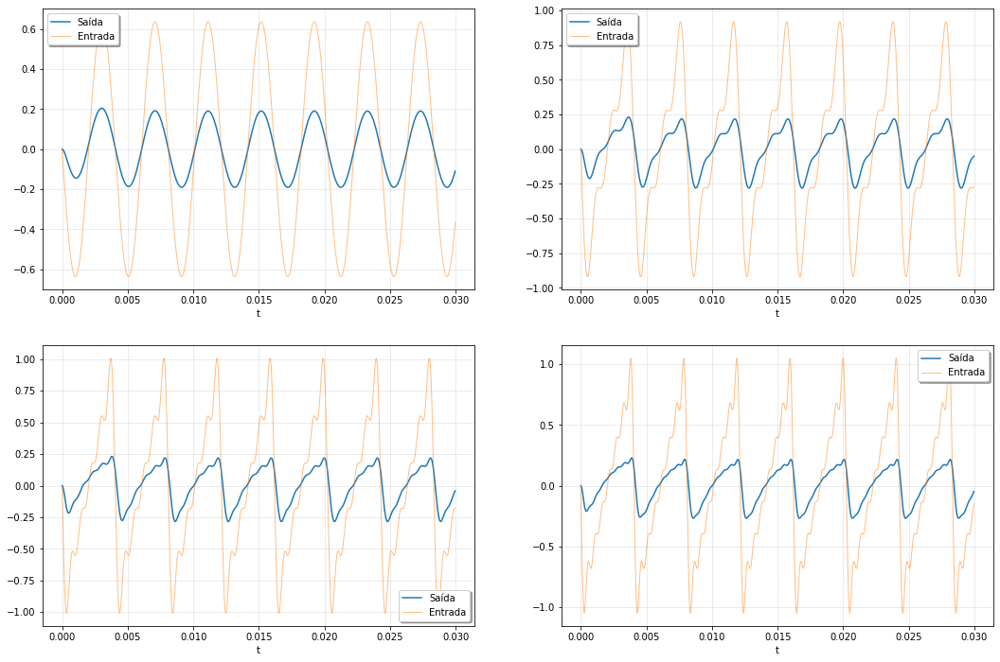

In [9]:
# Valores dos componentes
R1 = 560
R2 = 750
C1 = 1 * (10**(-6))
C2 = 1 * (10**(-6))

f = 247
w = 2*(np.pi)*f

#Função de transferência
sys = lti([R1*C1, 0], [R1*R2*C1*C2, (R1*C1 + R1*C2 + R2*C2), 1])

t = np.linspace (0, 0.03, 1000, endpoint=False)

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input1 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')


graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input2, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input4 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à dente de serra na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a dente de serra, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à dente de serra, mas também com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à dente de serra para este sistema.

# Projeto do Subwoofer

## Introdução

Um subwoofer é um tipo de alto-falante que reproduz específicamente as frequências mais baixas, responsáveis pelos sons graves (específicamente as frequências entre 20 e 200 Hz).

Para a montagem de um subwoofer, é necessária a utilização de um filtro passa-baixa com uma frequência de corte de 200 Hz. Apesar desse tipo de filtro não filtrar as frequências abaixo de 20 Hz, não é necessário se preocupar com elas, pois não estão dentro do espectro de frequências audíveis para o ser humano, que vai de 20 Hz até 20 kHz. Portanto, o subwoofer irá filtrar os sons de diferentes frequências e reproduzir apenas aqueles com frequências entre 20 e 200 Hz, atenuando as altas frequências.

Um subwoofer é útil para várias situações, pois esses sons graves vem de instrumentos como o bumbo, baixo e o órgão, assim como de efeitos sonoros em produções audiovisuais, como por exemplo, as explosões. Então, esse tipo de equipamento pode figurar em home theaters ou estúdios de música, entre outras aplicações. Até mesmo em situações cotidianas um subwoofer pode fazer a diferença na qualidade do som. Por exemplo, geralmente em notebooks e celulares, que não possuem esse equipamento, a reprodução de música e áudio no geral é mais "seca", justamente devido à falta dos tons mais graves.

Como o subwoofer reproduz sons de baica frequência, eles são sempre maiores do que os alto-falantes normais, pois é necessário uma área maior para que seja capaz de deslocar o ar na hora de reproduzir ondas sonoras com grandes comprimentos de onda.

Nesse projeto, por motivos de simplicidade, será feito um subwoofer passivo, ou seja, que precisa ser alimentado por amplificador externo ou por receptores de áudio e vídeo (A/V), possuindo apenas componentes passivos no circuito, mais especificamente resistores e capacitores.


## Custo do Projeto

Componentes do circuito:

1 resistor de 360R 5% (1/4W) - R\$ 0,05

1 capacitor de 2,2 $\mu$F / 50V - R\$ 0,16

Protoboard 830 Pontos MB-102 - R\$ 16,92

Total: R\$ 17,13

---

Custo da mão de obra:

Pode-se considerar que um técnico em Eletrônica tem a bagagem necessária para realizar esse projeto. De acordo com o site "glassdoor", a média salarial deste profissional no mercado brasileiro é de $R\$$ 2690 / mês. Considerando 160 horas de trabalho em um mês, o que equivale a 4 semanas trabalhando 40 horas semanais, temos um custo de mão de obra de R\$ 16,81 / hora.

Estamos considerando que o técnico em Eletrônica tem experiência com esse tipo de projeto, e que o circuito a ser montado é simples. Portanto, é possível estimar que ele consiga montar o circuito em 1 hora.

Com isso, temos que seriam gastos em pagamento da mão de obra R\$ 16,81 por circuito montado.

---

Custo total:

Analisando o que temos, podemos fixar o custo total desse projeto com o valor de R\$ 33,94 por circuito.



## Modelagem do Circuito

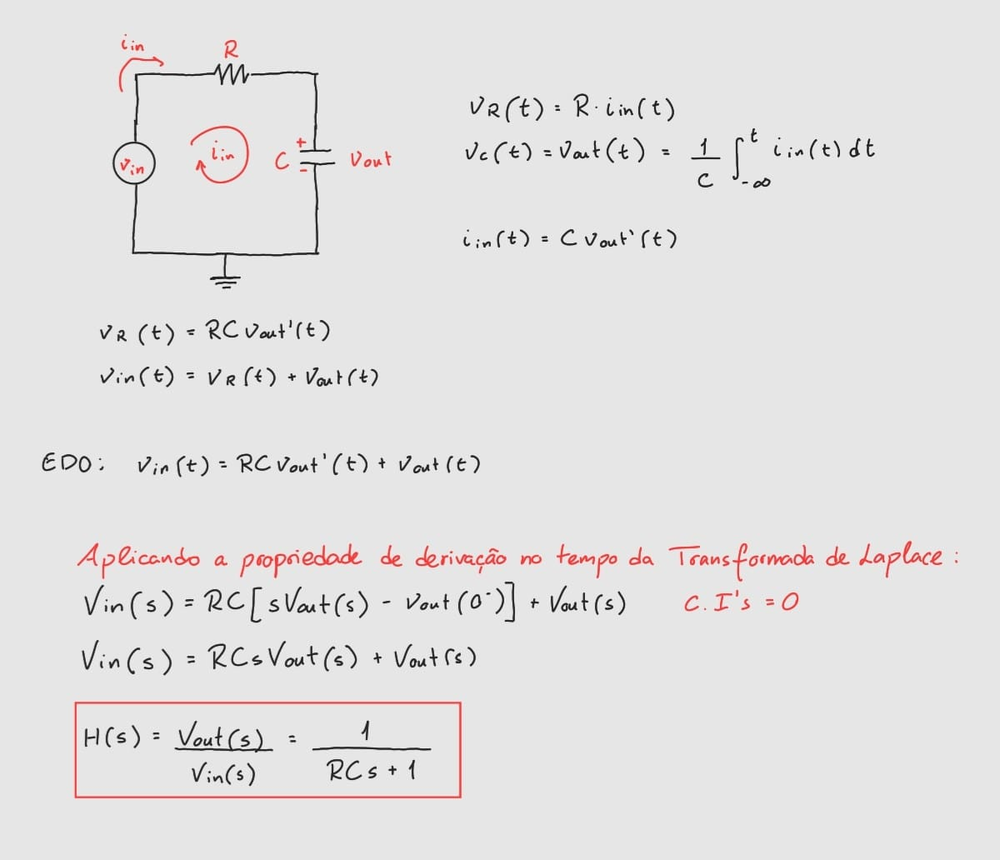

## Diagrama de Polos e Zeros


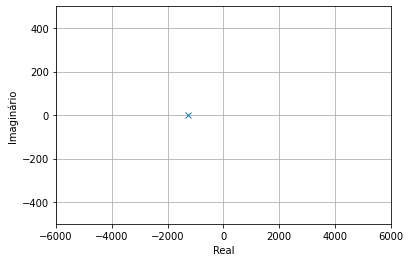

<Figure size 72x288 with 0 Axes>

In [10]:
R = 360
C = 2.2 * (10**(-6))

(zeros, poles, gain) = tf2zpk([1], [R*C, 1])
angle = np.linspace(-np.pi, np.pi, 500)
cirx = np.sin(angle)
ciry = np.cos(angle)

plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
plt.grid()
plt.xlim((-6000, 6000))
plt.xlabel('Real')
plt.ylim((-500, 500))
plt.ylabel('Imaginário')
plt.figure()

plt.gcf().set_figwidth(1)

Pelo diagrama, percebe-se que o sistema é assintóticamente estável, pois seu único polo está situado no SPLE.

## Diagrama de Bode

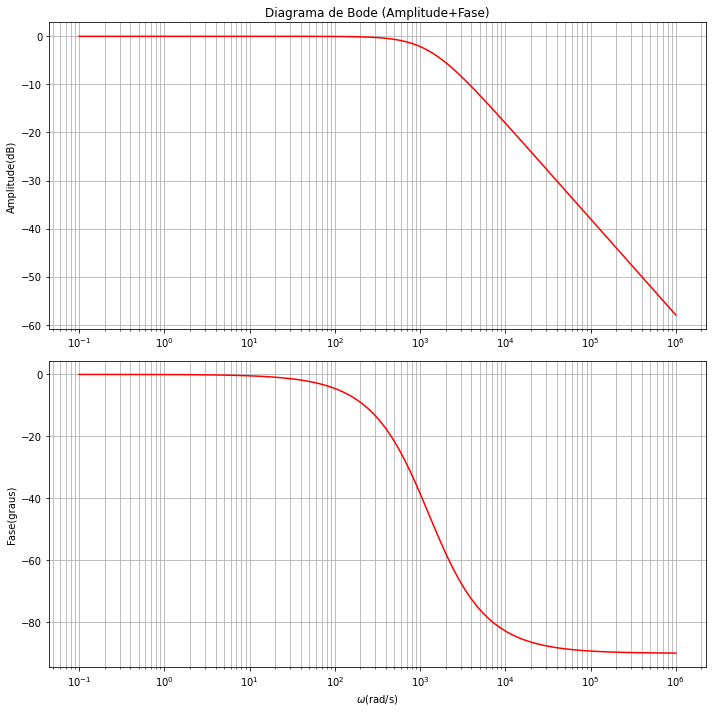

In [11]:
R = 360
C = 2.2 * (10**(-6))

sys = signal.TransferFunction([1], [R*C, 1])

w = np.logspace(-1,6,num=100, base=10.0)
w, mag, fase = signal.bode(sys,w=w,n=200)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].semilogx(w,mag, label='Magnitude', color='r') # Plot do Diagrama de Magnitude
graf[0].set_ylabel('Amplitude(dB)')
graf[0].grid(True, which="both", ls="-")

graf[1].semilogx(w,fase, label='Fase', color='r') # Plot do Diagrama de Fase
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('$\omega$(rad/s)')
graf[1].grid(True, which="both", ls="-")

plt.tight_layout()
plt.show()

Como esperado, o diagrama de Bode desse circuito corresponde ao de um passa-baixa, pois atenua as frequências maiores do que a frequência de corte, e deixa passar as frequências menores do que a frequência de corte. No caso do subwoofer, a frequência de corte é igual a 200 Hz, ou aproximadamente 1256 rad/s.

A fase varia de 0 a -90º, e essa transição ocorre na frequência de corte.

## Resposta ao Degrau Unitário

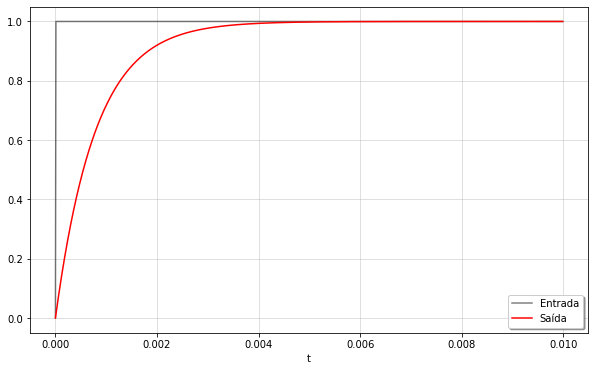

In [12]:
R = 360
C = 2.2 * (10**(-6))

#Definindo a variável de tempo
t=np.linspace(0, 0.01,1000,endpoint=False)
input=np.zeros_like(t)
input[t>0.0] = 1

#Definição da função de transferência e do degrau unitário
sys = signal.TransferFunction([1], [R*C, 1])
tout, yout = signal.step(sys, T=t)

plt.figure(figsize=(10,6))  
plt.plot(t,input,'k',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout, yout, "r", linewidth=1.5, label='Saída')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.5)
plt.xlabel('t')
plt.show()

Como a subida do degrau unitário possui altíssima frequência, o filtro passa-baixa atenuará o sinal, que junto com o atraso da resposta natural do sistema, provoca uma curva suave durante o crescimento do sinal de saída. Quando o degrau se estabiliza e fica constante, com frequências baixas, o filtro deixa passar totalmente o sinal e a resposta começa a coincidir com o sinal de entrada.

## Resposta à Rampa Unitária

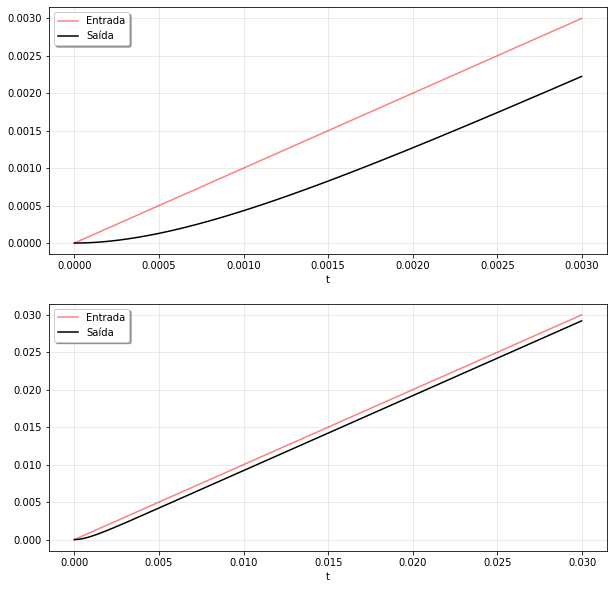

In [13]:
# Valores dos Componentes
R = 360
C = 2.2 * (10**(-6))

t=np.linspace(0,0.003,1000,endpoint=False)
u=t

sys = lti([1], [R*C, 1])
tout, yout, xout = lsim(sys,U=u,T=t)

fig, graf = plt.subplots (nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
graf[0].plot(tout,yout,'k',linewidth=1.5,label='Saída')
graf[0].legend(loc='upper left',shadow=True,framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')

t=np.linspace(0,0.03,1000,endpoint=False)
u=t

tout, yout, xout = lsim(sys,U=u,T=t)

graf[1].plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
graf[1].plot(tout,yout,'k',linewidth=1.5,label='Saída')
graf[1].legend(loc='upper left',shadow=True,framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()

Analisando o espectro de Fourier da rampa unitária, percebe-se que a maior parte do sinal está concentrada nas frequências mais baixas. Portanto, um filtro passa-baixa irá deixar passar a maior parte do sinal, providenciando como resposta do sistema uma outra rampa de inclinação semelhante, que tende a convergir com a rampa unitária da entrada.

No primeiro gráfico, é possível perceber que bem no início do sinal, há uma concavidade na resposta, devido à verticalização da entrada e do atraso da resposta do sistema.

O segundo gráfico, mais ampliado, mostra que a resposta tende a se estabilizar junto com a rampa unitária da entrada, seguindo a mesma inclinação, apenas com um pequeno atraso causado pela curva inicial.


## Resposta a uma onda quadrada de frequência $\omega$

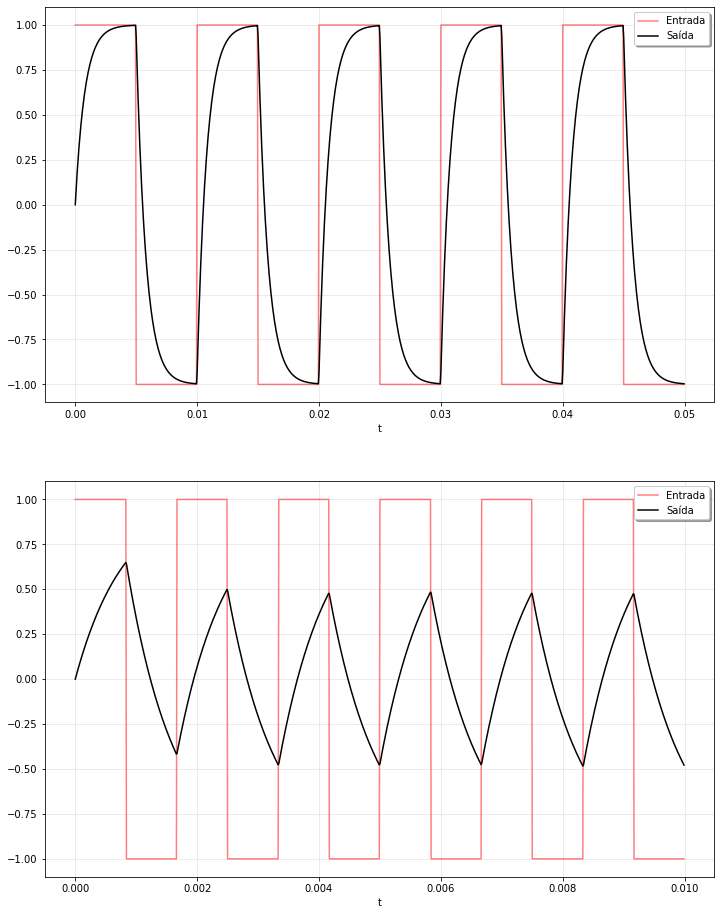

In [14]:
# Como as frequências no projeto estão sendo trabalhadas em hz,
# preferi manter assim no codigo, para depois passar para rad/s,
# para ter uma referencia maior na hora de escolher os valores.

# Foi escolhido uma frequência f de 100 Hz, abaixo da frequência de corte
f = 100
w = 2*(np.pi)*f

R = 360
C = 2.2 * (10**(-6))

#Função de transferência
sys = signal.lti([1], [R*C, 1])

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (12,16), sharex = False)

#Definição da variável tempo e da onda quadrada
t = np.linspace(0, 0.05, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys, U=u, T=t)


graf[0].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')


# Aumentando a frequência e colocando-a acima da frequência de corte, podemos perceber que o sinal será atenuado.
# Pro segundo gráfico, utilizei f = 600 Hz.
f1 = 600
w1 = 2*(np.pi)*f1

t = np.linspace(0, 0.01, 1000, endpoint=False)
u = signal.square(t*w1)

tout, yout, xout = lsim(sys, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()

Para o primeiro gráfico, foi escolhida uma frequência de 100 Hz, valor abaixo da frequência de corte. Portanto, o filtro passa-baixa deixará passar o sinal de entrada, ocasionando uma resposta com apenas uma leve deformação resultante do atraso na resposta do sistema.

Já no segundo gráfico, a frequência utilizada foi de 600 Hz, acima da frequência de corte. Há, portanto, uma perceptível atenuação do sinal na resposta.

## Resposta aos n harmônicos da série de Fourier de uma onda quadrada de frequência $ω$

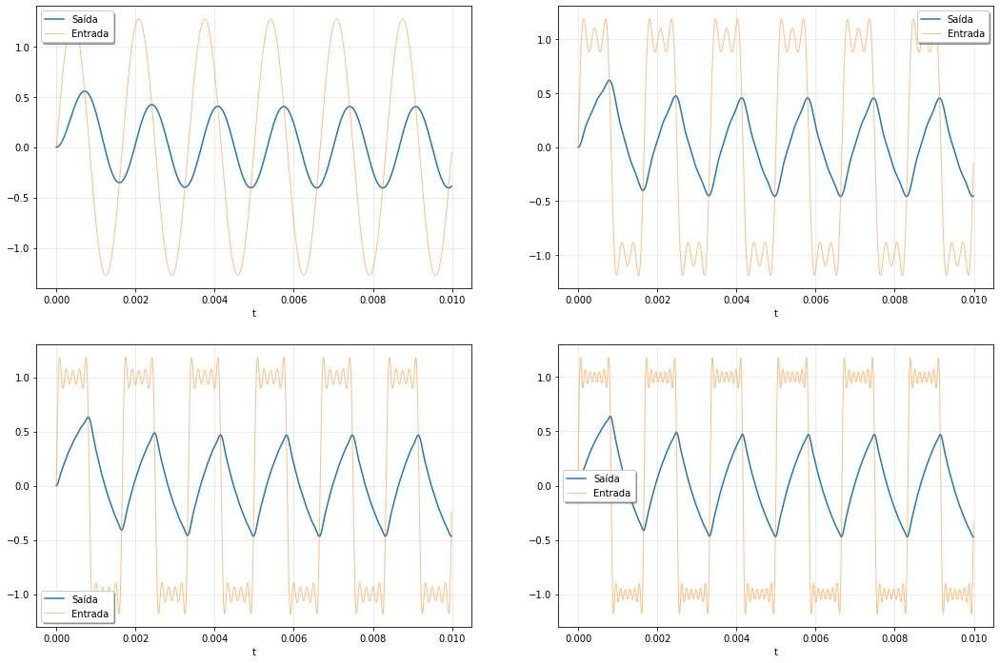

In [15]:
# Valores dos componentes
R = 360
C = 2.2 * (10**(-6))

f = 600
w = 2*(np.pi)*f

t = np.linspace(0, 0.01, 1000, endpoint=False)

#Função de transferência
sys = signal.lti([1], [R*C, 1])

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input1 = soma * 4/(np.pi)

tout, yout, xout = signal.lsim(sys, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input2 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys, U=input3, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)

tout, yout, xout = signal.lsim(sys, U=input3, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à onda quadrada na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a onda quadrada, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à onda quadrada.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à onda quadrada, mas com algumas oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da onda quadrada, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à onda quadrada para este sistema.

## Resposta a uma Dente de Serra de frequência $ω$

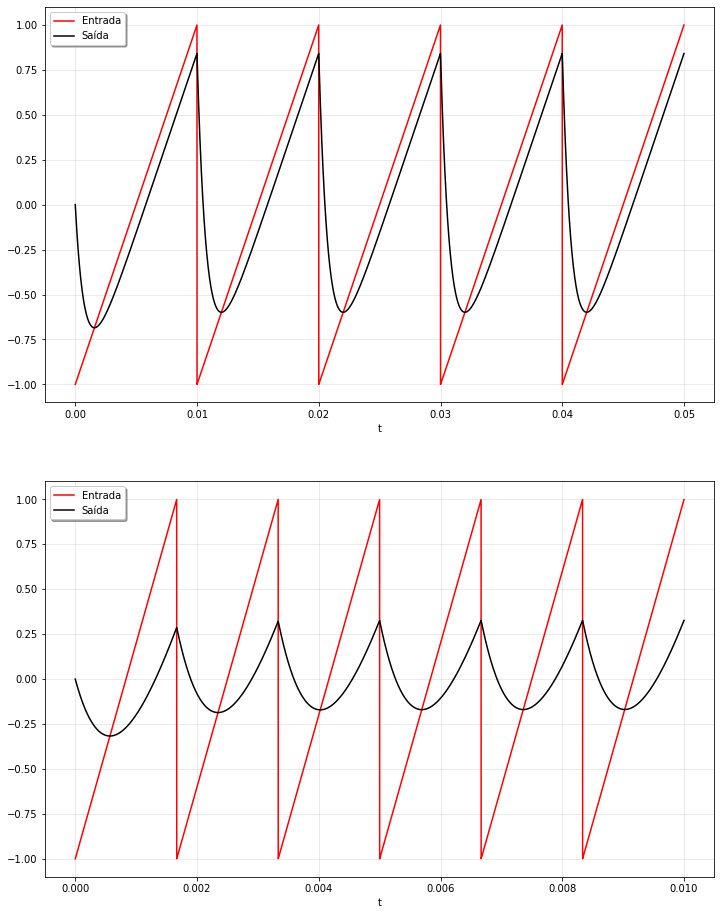

In [16]:
# Valores dos componentes
R = 360
C = 2.2 * (10**(-6))

# Foi escolhido uma frequência f de 100 Hz, abaixo da frequência de corte
f = 100
w = 2*(np.pi)*f

#Função de transferência
sys = lti([1], [R*C, 1])

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (12,16), sharex = False)

#Definição da variável tempo e do sinal
t = np.linspace(0, 0.05, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys, U=u, T=t)

graf[0].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')


# Como foi feito com a onda quadrada, a frequência foi aumentada, colocando-a acima
# da frequência de corte, para possibilitar a análise da atenuação do sinal.
f1 = 600
w1 = 2*(np.pi)*f1

t = np.linspace(0, 0.01, 10000, endpoint=False)
u = signal.sawtooth(w1*t)

tout, yout, xout = lsim(sys, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()

Para o primeiro gráfico, foi escolhida uma frequência de 100 Hz, valor abaixo da frequência de corte. Portanto, o filtro passa-baixa deixará passar o sinal de entrada, ocasionando uma resposta com apenas uma leve deformação resultante do atraso na resposta do sistema.

Já no segundo gráfico, a frequência utilizada foi de 600 Hz, acima da frequência de corte. Há, portanto, uma perceptível atenuação do sinal na resposta.

## Resposta aos n harmônicos da série de Fourier de uma dente de serra de frequência $ω$

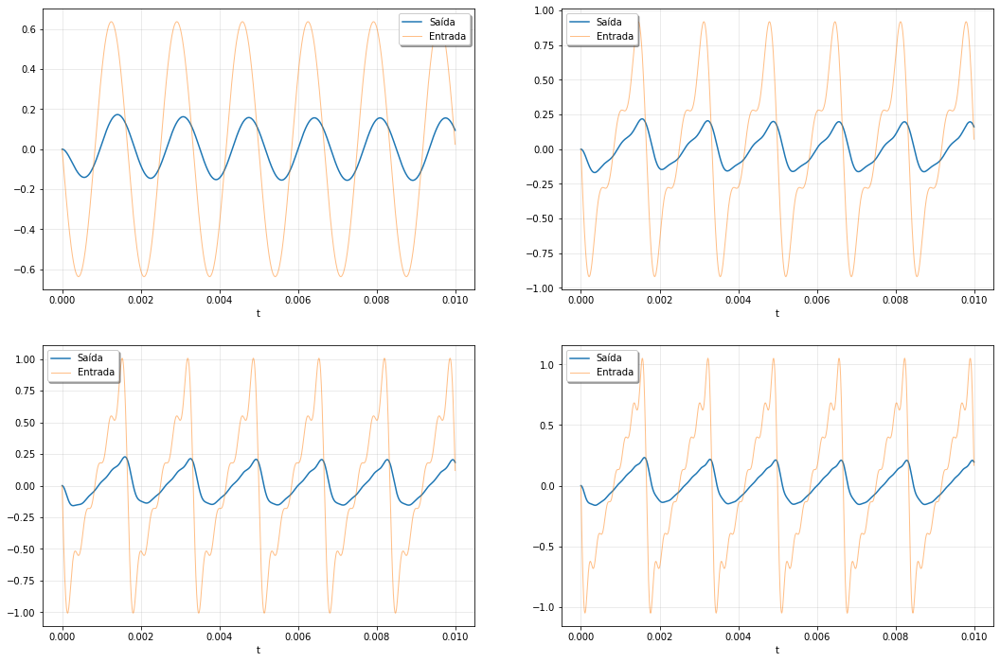

In [17]:
# Valores dos componentes
R = 360
C = 2.2 * (10**(-6))

f = 600
w = 2*(np.pi)*f

#Função de transferência
sys = lti([R1*C1, 0], [R1*R2*C1*C2, (R1*C1 + R1*C2 + R2*C2), 1])

t = np.linspace (0, 0.01, 1000, endpoint=False)

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input1 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')


graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input2, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input4 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à dente de serra na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a dente de serra, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à dente de serra, mas também com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à dente de serra para este sistema.

# Questão 1




## (A)

# Circuitos 1 e 2

Os circuitos 1 e 2 são filtros passa-faixa. No filtro passa-faixa, também chamado de passa-banda, o ganho é aumentado em toda a banda passante. Portanto, esse filtro permite que as frequências de uma certa faixa passem livremente, enquanto que as frequências fora dessa faixa são atenuadas (reduzidas em amplitude). \\

Uma aplicação comum dos passa-faixa é na filtragem dos dados meteorológico. O filtro em questão trabalha com uma determinada faixa de período de modo que apenas os ciclones permaneçam como flutuações nos campos de dados. \\

Outro projeto possível com o uso de um filtro passa-faixa é o de um afinador de corda de violão, trabalhando com uma faixa que corresponde a uma determinada corda do violão.

# Circuito 3 

O circuito 3 é um filtro passa-baixa. O filtro passa-baixa é um circuito que permite a passagem de sinais de baixa frequência ao mesmo tempo que reduz a intensidade de sinais de alta frequência.

Isto é, a partir de uma frequência de referência, chamada frequência de corte, ele permite que frequências mais baixas que ela passem livremente, e frequências mais altas são atenuadas (reduzidas em amplitude).

Uma aplicação interessante para ele é o seu uso em processamento de imagens, para suavizar a imagem, atenuando as altas frequências, que correspondem às transições abruptas, e assim minimizando ruídos e produzindo maior borramento na imagem. \\

Além disso, o passa-baixa pode ser utilizado em um projeto de subwoofer, um tipo de transdutor que reproduz sons graves.

# Circuito 4

O circuito 4 corresponde a um buffer. Um circuito buffer fornece um meio de isolar o sinal de entrada de uma carga utilizando um estágio de ganho unitário, sem inversão. 

Vantagens: \\
Alta impedância de entrada  
Baixa impedância de saída

# Circuito 5 

O circuito 5 é um integrador inversor, ou seja, um circuito eletrônico que realiza um processo de integração (soma infinitesimal) dos sinais decorrentes da variação do sinal de entrada conforme sua variação no intervalo de tempo analisado. Como é um inversor, o ganho do circuito é negativo.

# Circuito 6

O circutio 6 é um integrador de tensão, ou seja, um circuito eletrônico que realiza um processo de integração (soma infinitesimal) dos sinais decorrentes da variação do sinal de entrada conforme sua variação no intervalo de tempo analisado. Como é um integrador não inversor, o ganho do circuito é positivo.

## (D) e (E) - EDO's e Funções de Transferência dos Circuitos

### Circuito 1

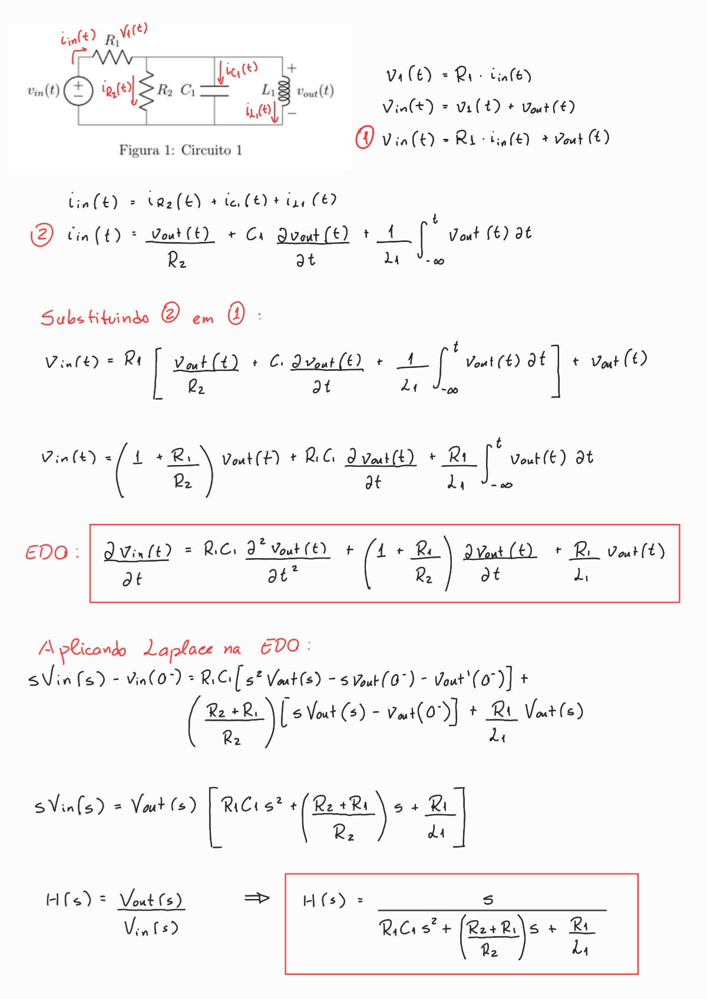

### Circuito 2

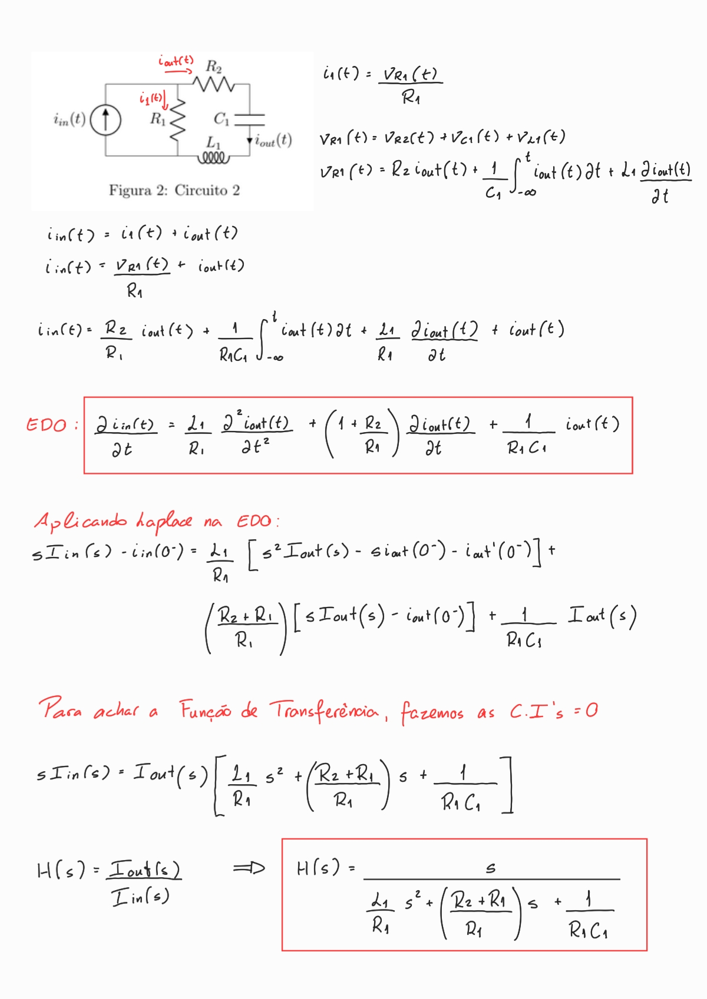

### Circuito 3

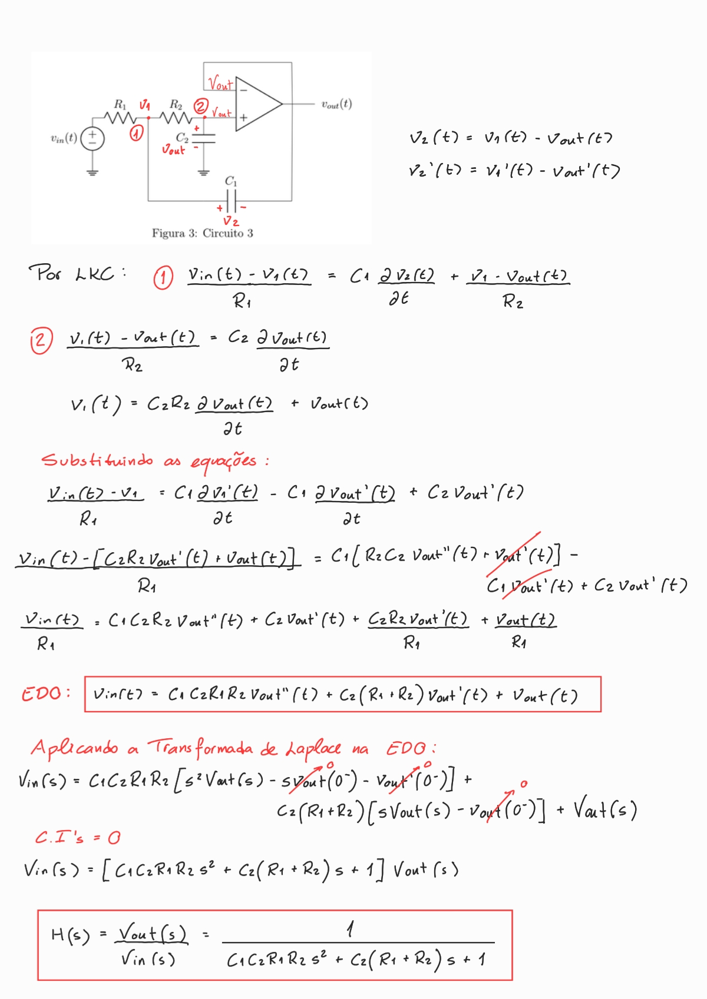

### Circuito 4

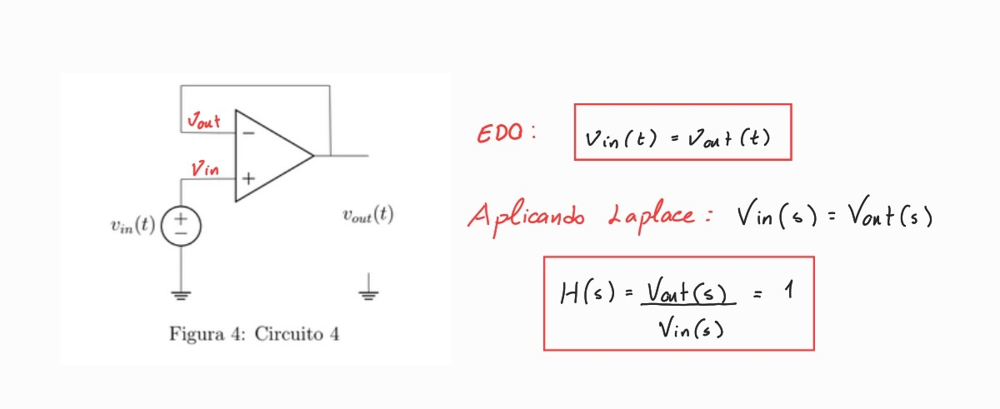

OBS: Como o circuito 4 não tem uma funcionalidade prática para os parâmetros que estão sendo analisados no trabalho, ele não será levado em conta para realizar os diagramas e plotagens de respostas. 

Esse circuito tem sim sua funcionalidade específica, mas para a profundidade de análise desse projeto, ele serve somente como um fio, e não apresentará resultados relevantes a ponto de serem analisados.

### Circuito 5

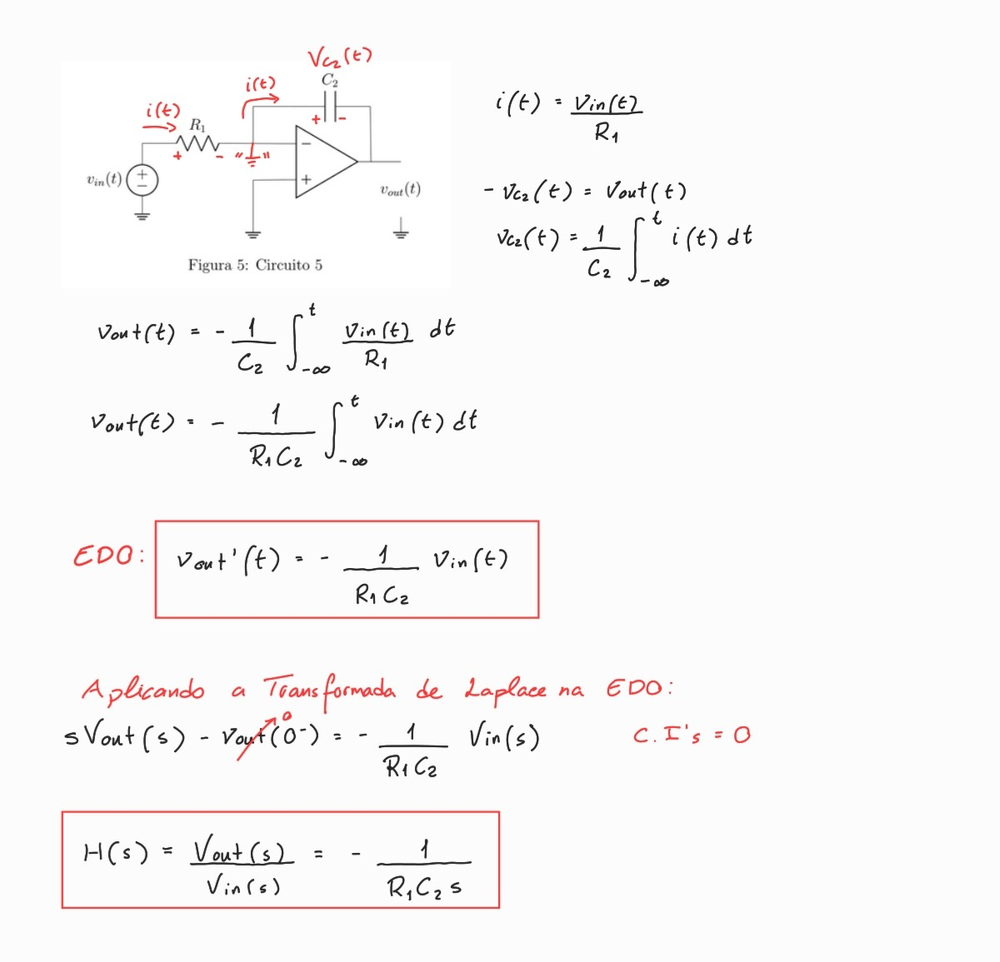

### Circuito 6

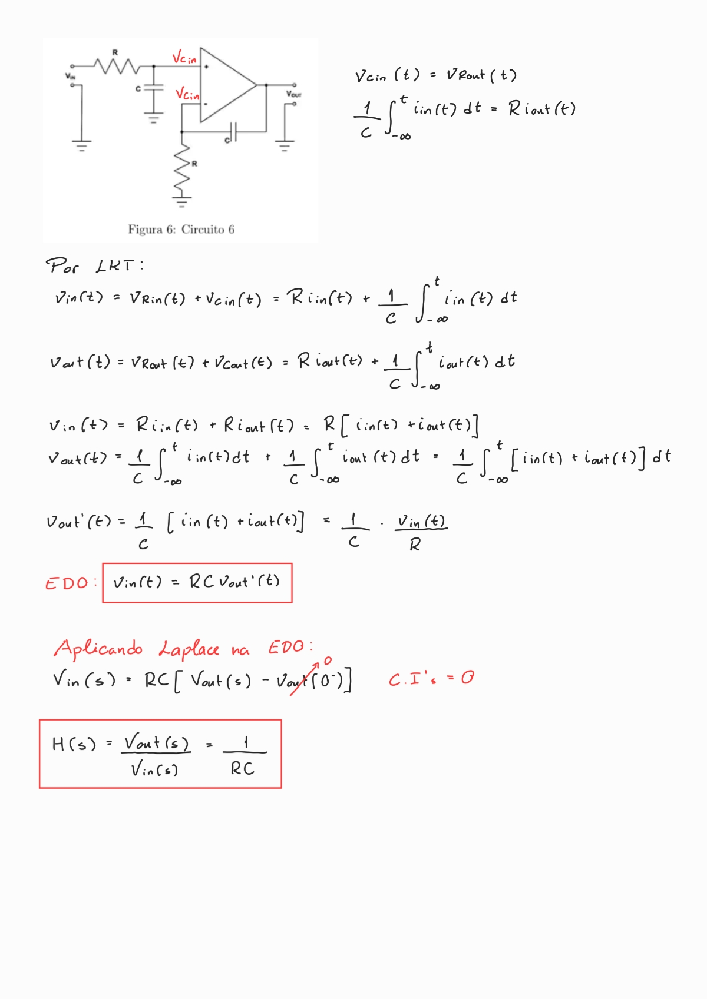

## (F) - Diagrama de Polos e Zeros



### Circuito 1

Valores dos Componentes:

R1 = 10 Ω

R2 = 10 Ω

C = 1 mF

L = 10 mH

---

Polos e Zeros:

Zero = 0 

Polos ≈ -100 ± j300 


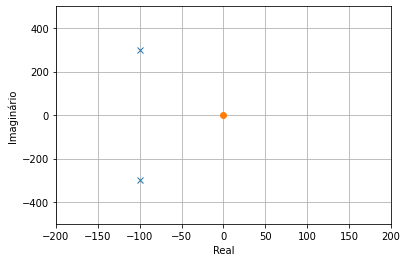

<Figure size 72x288 with 0 Axes>

In [18]:
R1 = 10
R2 = 10
C1 = 0.001
L1 = 0.01

(zeros, poles, gain) = tf2zpk([1, 0], [R1*C1, ((R2 + R1)/R2), R1/L1])
angle = np.linspace(-np.pi, np.pi, 500)
cirx = np.sin(angle)
ciry = np.cos(angle)

plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
plt.grid()
plt.xlim((-200, 200))
plt.xlabel('Real')
plt.ylim((-500, 500))
plt.ylabel('Imaginário')
plt.figure()

plt.gcf().set_figwidth(1)

Com os valores dos componentes utilizados, percebe-se que o sistema assintóticamente estável, pois possui ambos os polos imaginários estão no Semi-Plano Lateral Esquerdo (SPLE).

### Circuito 2

Valores dos Componentes:

R1 = 10 Ω

R2 = 100 Ω

C1 = 50 $μ$F

L1 = 100 mH

---

Polos e Zeros:

Zero = 0

Polos ≈ -229,84  e  -870,16

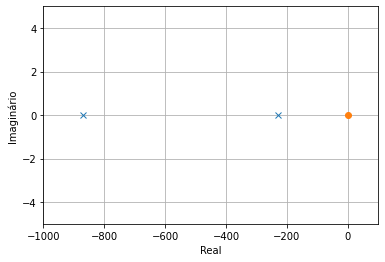

<Figure size 72x288 with 0 Axes>

In [19]:
R1 = 10
R2 = 100
C1 = 50*(10**(-6))
L1 = 0.1

(zeros, poles, gain) = tf2zpk([1, 0], [(L1/R1), ((R2 + R1)/R1), (1/(R1*C1))])
angle = np.linspace(-np.pi, np.pi, 500)
cirx = np.sin(angle)
ciry = np.cos(angle)

plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
plt.grid()
plt.xlim((-1000, 100))
plt.xlabel('Real')
plt.ylim((-5, 5))
plt.ylabel('Imaginário')
plt.figure()

plt.gcf().set_figwidth(1)

Esse sistema tambem é assintóticamente estável, pois ambos os polos estão situados no SPLE.

### Circuito 3 

Valores dos Componentes:

R1 = 1 KΩ

R2 = 10 KΩ

C1 = 3 $μ$F

C2 = 5 $μ$F

---

Polos e Zeros:

Zero ⇒ não existe

Polos ≈ -347,48  e  -19,19


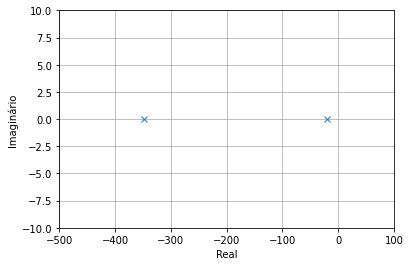

<Figure size 72x288 with 0 Axes>

In [20]:
R1 = 1000
R2 = 10000
C1 = 3*(10**(-6))
C2 = 5*(10**(-6))

(zeros, poles, gain) = tf2zpk([1], [C1*C2*R1*R2, C2*(R2 + R1), 1])
angle = np.linspace(-np.pi, np.pi, 500)
cirx = np.sin(angle)
ciry = np.cos(angle)

plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
plt.grid()
plt.xlim((-500, 100))
plt.xlabel('Real')
plt.ylim((-10, 10))
plt.ylabel('Imaginário')
plt.figure()

plt.gcf().set_figwidth(1)

A função de transferência do sistema é assintóticamente estável, pois possui todos os polos situados no SPLE.

### Circuito 5

Valores dos Componentes:

R1 = 100 Ω

C2 = 5 $μ$F

---

Polos e Zeros:

Zero ⇒ não existe

Polos = 0

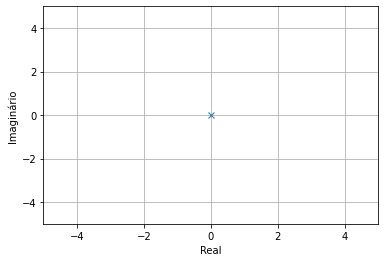

<Figure size 72x288 with 0 Axes>

In [21]:
R1 = 100
C2 = 5*(10**(-6))

(zeros, poles, gain) = tf2zpk([-1], [C2*R1, 0])
angle = np.linspace(-np.pi, np.pi, 500)
cirx = np.sin(angle)
ciry = np.cos(angle)

plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
plt.grid()
plt.xlim((-5, 5))
plt.xlabel('Real')
plt.ylim((-5, 5))
plt.ylabel('Imaginário')
plt.figure()

plt.gcf().set_figwidth(1)

Esse sistema é marginalmente estável pois não há polos de multiplicidade maior do que 1 sobre o eixo imaginário e não há nenhum polo no Semi-Plano Lateral Direito (SPLD), há somente um polo de multiplicidade 1 sobre o eixo imaginário.

Obs: independente da escolha de valores de R1 e C2, o diagrama de polos e zeros permanecerá o mesmo.

### Circuito 6

Valores dos Componentes:

R1 = 10 Ω

C2 = 3 $μ$F

---

Polos e Zeros:

Zero ⇒ não existe

Polos = 0

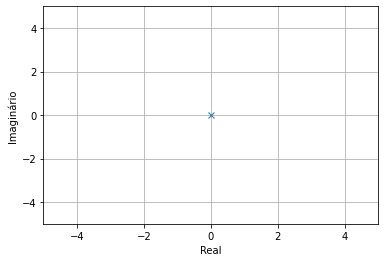

<Figure size 72x288 with 0 Axes>

In [22]:
R = 100
C = 5*(10**(-6))

(zeros, poles, gain) = tf2zpk([1], [R*C, 0])
angle = np.linspace(-np.pi, np.pi, 500)
cirx = np.sin(angle)
ciry = np.cos(angle)

plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
plt.grid()
plt.xlim((-5, 5))
plt.xlabel('Real')
plt.ylim((-5, 5))
plt.ylabel('Imaginário')
plt.figure()

plt.gcf().set_figwidth(1)

De novo, o sistema é marginalmente estável, pois há um polo de multiplicidade 1 sobre o eixo imaginário, e não há polos no SPLD.

Nesse caso, acontece o mesmo que no circuito 5: o diagrama permanece o mesmo independentemente dos valores de R e C.

## (G) - Diagrama de Bode

### Circuito 1

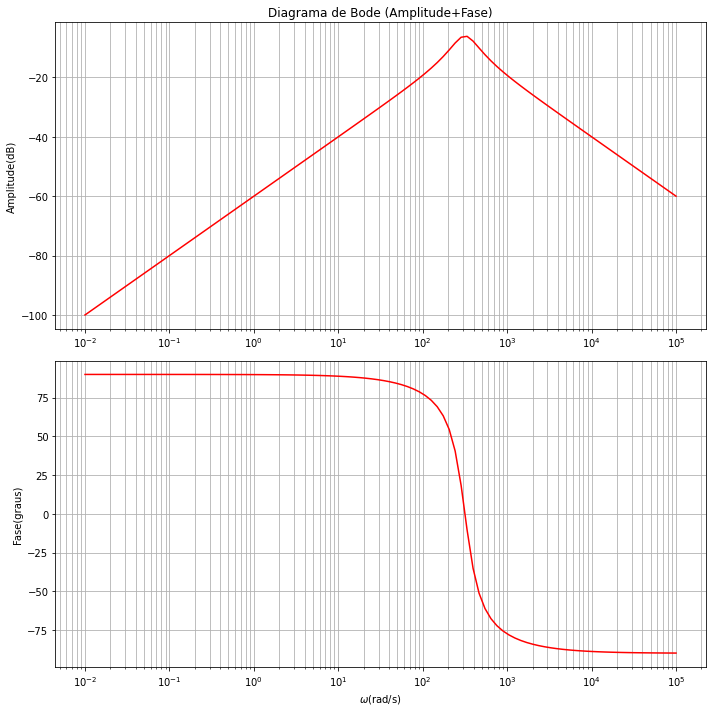

In [23]:
R1 = 10
R2 = 10
C1 = 0.001
L1 = 0.01

sys1 = signal.TransferFunction([1, 0], [R1*C1, ((R2 + R1)/R2), R1/L1])

w = np.logspace(-2,5,num=100, base=10.0)
w, mag, Fase = signal.bode(sys1,w=w,n=200)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].semilogx(w,mag, label='Magnitude', color='r') # # Plot do Diagrama de Magnitude
graf[0].set_ylabel('Amplitude(dB)')
graf[0].grid(True, which="both", ls="-")

graf[1].semilogx(w,Fase, label='Fase', color='r') # # Plot do Diagrama de Fase
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('$\omega$(rad/s)')
graf[1].grid(True, which="both", ls="-")

plt.tight_layout()
plt.show()

Esse gráfico é o esperado para um filtro passa-faixa, pois amplifica uma determinada faixa de frequência e atenua as frequências menores ou maiores do que essa banda. As frequências de banda estão dentro de um intervalo aproximado de 100 rad/s e 1000 rad/s. \\

A fase varia entre 90º e -90º, o que corresponde à diferença de fase quando o filtro atua como passa-alta e como passa-baixa

Como a função de transferência desse circuito tem um polo de segunda ordem, há um coeficiente de amortecimento.



### Circuito 2

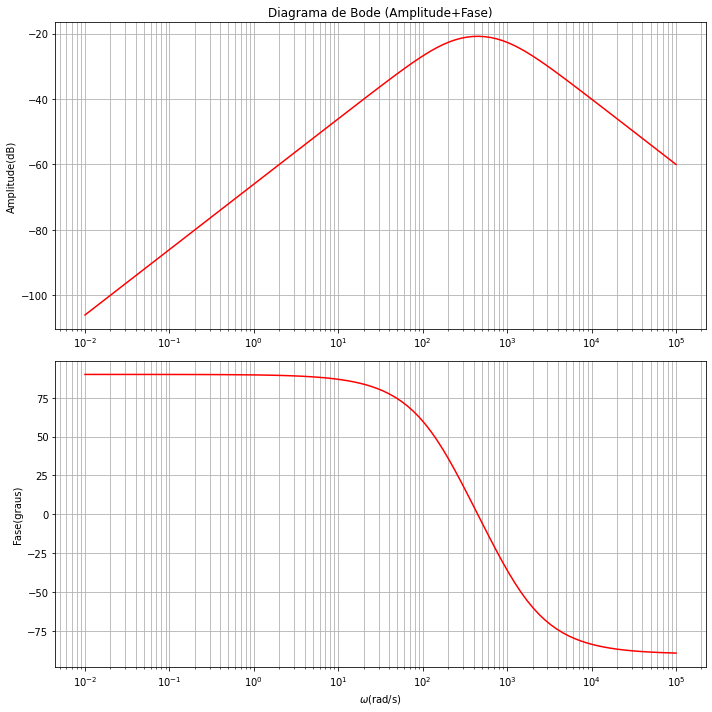

In [24]:
R1 = 10
R2 = 100
C1 = 50*(10**(-6))
L1 = 0.1

sys2 = signal.TransferFunction([1, 0], [(L1/R1), ((R2 + R1)/R1), (1/(R1*C1))])

w = np.logspace(-2,5,num=100, base=10.0)
w, mag, fase = signal.bode(sys2,w=w,n=200)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].semilogx(w,mag, label='Magnitude', color='r')
graf[0].set_ylabel('Amplitude(dB)')
graf[0].grid(True, which="both", ls="-")

graf[1].semilogx(w,fase, label='Fase', color='r')
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('$\omega$(rad/s)')
graf[1].grid(True, which="both", ls="-")

plt.tight_layout()
plt.show()


Por ser também um filtro passa-faixa passivo, esse gráfico é semelhante ao do circuito 1. Também amplifica uma determinada faixa de frequência e atenua as frequências menores ou maiores do que essa banda. Nesse caso, as frequências de banda estão dentro de um intervalo aproximado de 300 rad/s e 3000 rad/s. \\

Uma diferença deste gráfico em ralação ao circuito 1, é que o intervalo de banda é maior.

A fase varia entre 90º e -90º, o que corresponde à diferença de fase quando o filtro atua como passa-alta e como passa-baixa

Como a função de transferência desse circuito tem um polo de segunda ordem, há um coeficiente de amortecimento.

### Circuito 3

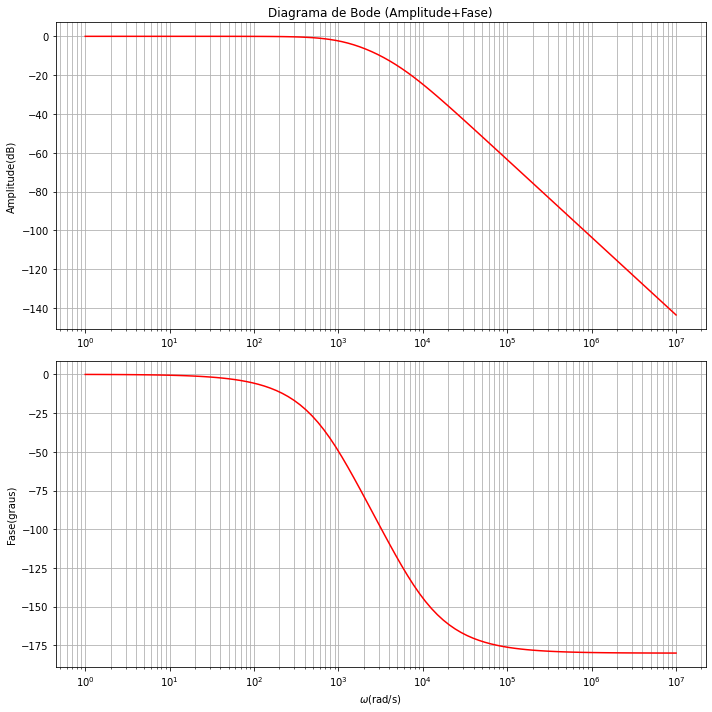

In [25]:
R1 = 100
R2 = 100
C1 = 3*(10**(-6))
C2 = 5*(10**(-6))

sys3 = signal.TransferFunction([1], [C1*C2*R1*R2, C2*(R2 + R1), 1])

w = np.logspace(0,7,num=100, base=
                10.0)
w, mag, fase = signal.bode(sys3,w=w,n=200)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].semilogx(w,mag, label='Magnitude', color='r')
graf[0].set_ylabel('Amplitude(dB)')
graf[0].grid(True, which="both", ls="-")

graf[1].semilogx(w,fase, label='Fase', color='r')
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('$\omega$(rad/s)')
graf[1].grid(True, which="both", ls="-")
plt.tight_layout()
plt.show()

Esse gráfico é o equivalente à um passa-baixa, o que está de acordo com o que foi discutido na letra (a) da Questão 1. Percebe-se que esse tipo de filtro atenua as frequências maiores do que a frequência de corte e deixa passar as frequências mais baixas do que a frequência de corte.

Pelo diagrama, podemos estimar que a frequência de corte é de aproximadamente 1200 rad/s.

A fase varia de 0 a -180º, evidenciando a existência de um polo de segunda ordem. Essa transição ocorre na frequência de corte.

### Circuito 5

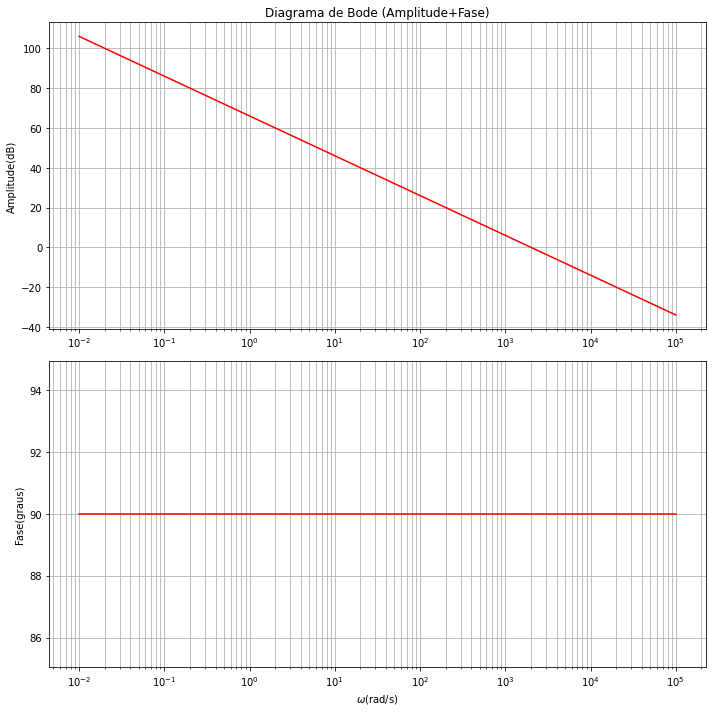

In [26]:
R1 = 100
C2 = 5*(10**(-6))

sys5 = signal.TransferFunction([-1], [C2*R1, 0])

w = np.logspace(-2,5,num=100, base=10.0)
w, mag, fase = signal.bode(sys5,w=w,n=200)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].semilogx(w,mag, label='Magnitude', color='r')
graf[0].set_ylabel('Amplitude(dB)')
graf[0].grid(True, which="both", ls="-")

graf[1].semilogx(w,fase, label='Fase', color='r')
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('$\omega$(rad/s)')
graf[1].grid(True, which="both", ls="-")

plt.tight_layout()
plt.show()

Esse diagrama de Bode possui o formato esperado para um integrador inversor, e atenua as frequências proporcionalmente ao crescimento delas.

Sua fase é constante em 90°, o que também é esperado para um integrador inversor.

### Circuito 6

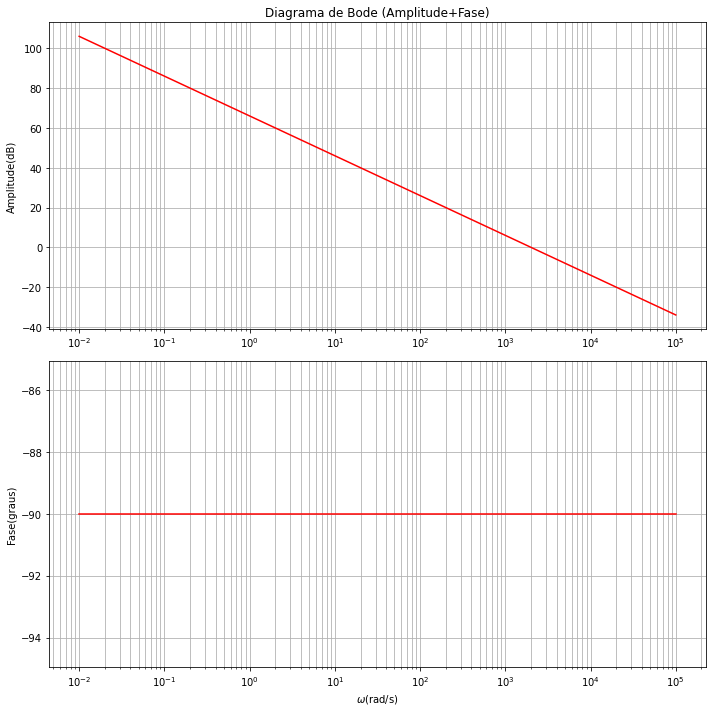

In [27]:
R = 100
C = 5*(10**(-6))

sys6 = signal.TransferFunction([1], [R*C, 0])

w = np.logspace(-2,5,num=100, base=10.0)
w, mag, fase = signal.bode(sys6,w=w,n=200)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].semilogx(w,mag, label='Magnitude', color='r')
graf[0].set_ylabel('Amplitude(dB)')
graf[0].grid(True, which="both", ls="-")

graf[1].semilogx(w,fase, label='Phase', color='r')
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('$\omega$(rad/s)')
graf[1].grid(True, which="both", ls="-")

plt.tight_layout()
plt.show()

Percebe-se que o gráfico desse circuito é idêntico ao diagrama de Bode do circuito 5, pois também é um integrador. Como dito no item anterior, independentemente dos valores dos componentes desses dois circuitos, os polos e zeros continuarão os mesmos.

A fase do integrador será o inverso do integrador inversor. Nesse caso, como no circuito 5 a fase era igual a 90º, no circuito 6 a fase é igual a -90º.

## (H) - Resposta ao Degrau Unitário

### Circuito 1

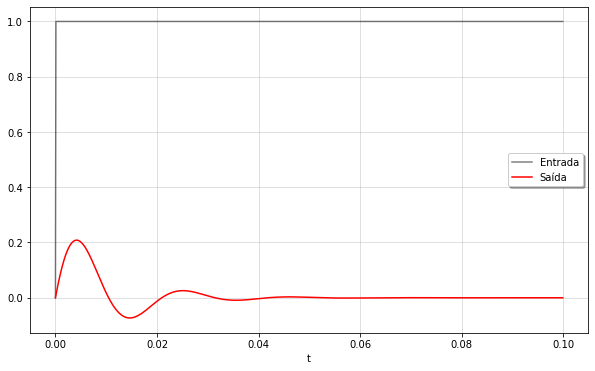

In [28]:
R1 = 10
R2 = 10
C1 = 0.001
L1 = 0.01

#Definindo a variável de tempo
t=np.linspace(0, 0.1,1000,endpoint=False)
input=np.zeros_like(t)
input[t>0.0] = 1

#Definição da função de transferência e do degrau unitário
sys1 = signal.TransferFunction([1, 0], [R1*C1, ((R2 + R1)/R2), R1/L1])
tout, yout = signal.step(sys1, T=t)

plt.figure(figsize=(10,6))  
plt.plot(t,input,'k',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout, yout, "r", linewidth=1.5, label='Saída')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.5)
plt.xlabel('t')
plt.show()

Nas fases constantes do degrau unitário, ele é um sinal de frequência muito baixa, e na fase de subida ele é um sinal de frequência muito alta. Como o circuito é um passa-faixa, essas frequências fora da banda serão atenuadas muito rapidamente.

Como há um polo de segunda ordem na função de transferência desse cirucito, há um coeficiente de amortecimento, que provoca um **amortecimento subcrítico**, formando essa curva senóide de amplitude decrescente.

Obs: Dentro da banda ideal de frequência ainda existe um ganho, como analisado no diagrama de Bode.

### Circuito 2

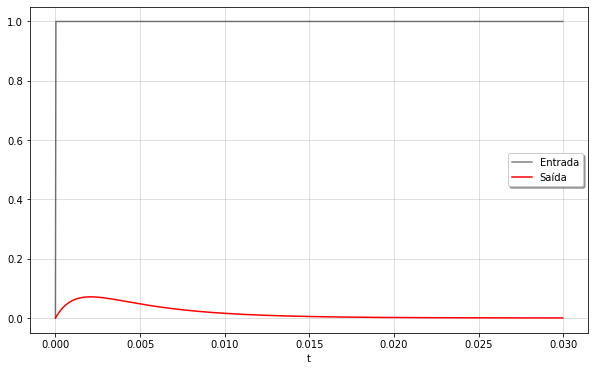

In [29]:
R1 = 10
R2 = 100
C1 = 50*(10**(-6))
L1 = 0.1

#Definindo a variável de tempo
t=np.linspace(0, 0.03,1000,endpoint=False)
input=np.zeros_like(t)
input[t>0.0] = 1

#Definição da função de transferência e do degrau unitário
sys2 = signal.TransferFunction([1, 0], [(L1/R1), ((R2 + R1)/R1), (1/(R1*C1))])
tout, yout = signal.step(sys2, T=t)
          
plt.figure(figsize=(10,6))  
plt.plot(t,input,'k',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout, yout, "r", linewidth=1.5, label='Saída')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.5)
plt.xlabel('t')
plt.show()

Como foi comentado na resposta ao degrau unitário do circuito 1, nas fases constantes do degrau, ele é um sinal de frequência muito baixa, e na fase de subida ele é um sinal de frequência muito alta. Nesse circuito passa-faixa, pode-se notar que o pico do sinal não alcança a amplitude de entrada do degrau unitário, pois as frequências muito baixas e muito altas são atenuadas muito rapidamente.

### Circuito 3

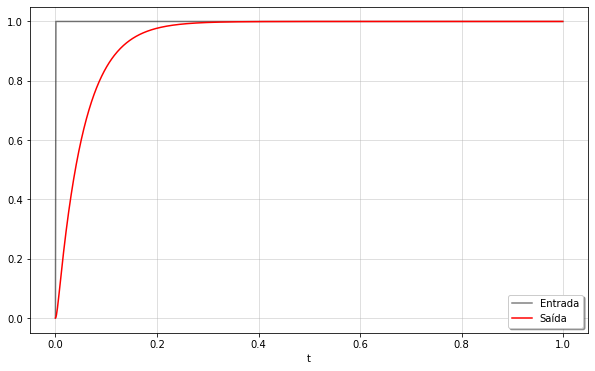

In [30]:
R1 = 1000
R2 = 10000
C1 = 3*(10**(-6))
C2 = 5*(10**(-6))

#Definindo a variável de tempo
t=np.linspace(0, 1,1000,endpoint=False)
input=np.zeros_like(t)
input[t>0.0] = 1

#Definição da função de transferência e do degrau unitário
sys3 = signal.TransferFunction([1], [C1*C2*R1*R2, C2*(R2 + R1), 1])
tout, yout = signal.step(sys3, T=t)
          
plt.figure(figsize=(10,6))
plt.plot(t,input,'k',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout, yout, "r", linewidth=1.5, label='Saída')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.5)
plt.xlabel('t')
plt.show()

Como a subida do degrau unitário possui altíssima frequência, o filtro passa-baixa atenuará o sinal, que junto com o atraso da resposta natural do sistema, provoca uma curva suave durante o crescimento do sinal de saída. Quando o degrau se estabiliza e fica constante, com frequências baixas, o filtro deixa passar totalmente o sinal e a resposta começa a coincidir com o sinal de entrada.



### Circuito 5

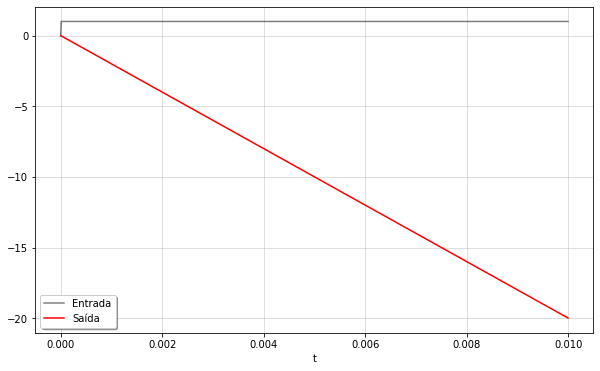

In [31]:
R1 = 100
C2 = 5*(10**(-6))

#Definindo a variável de tempo
t=np.linspace(0, 0.01,1000,endpoint=False)
input=np.zeros_like(t)
input[t>0.0] = 1

#Definição da função de transferência e do degrau unitário
sys5 = signal.TransferFunction([-1], [C2*R1, 0])
tout, yout = signal.step(sys5, T=t)

plt.figure(figsize=(10,6))
plt.plot(t,input,'k',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout, yout, "r", linewidth=1.5, label='Saída')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.5)
plt.xlabel('t')
plt.show()

Como esperado para um integrador inversor, a resposta do sistema é uma rampa unitária inversa, pois a resposta será a integral inversa do sinal de entrada.

### Circuito 6

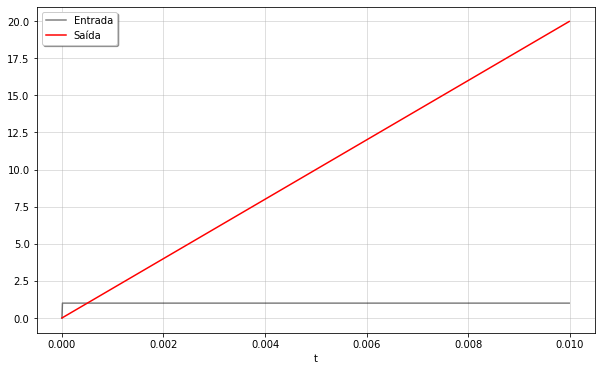

In [32]:
R = 100
C = 5*(10**(-6))

#Definindo a variável de tempo
t=np.linspace(0, 0.01,1000,endpoint=False)
input=np.zeros_like(t)
input[t>0.0] = 1

#Definição da função de transferência e do degrau unitário
sys6 = signal.TransferFunction([1], [R*C, 0])
tout, yout = signal.step(sys6, T=t)

plt.figure(figsize=(10,6))
plt.plot(t,input,'k',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout, yout, "r", linewidth=1.5, label='Saída')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.5)
plt.xlabel('t')
plt.show()

Como o circuito 6 é um integrador não inversor, a resposta é uma rampa unitária.

## (I) - Resposta à Rampa Unitária

### Circuito 1

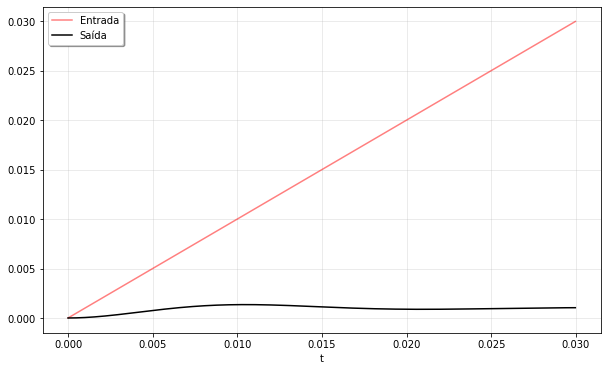

In [33]:
# Valores dos Componentes
R1 = 10
R2 = 10
C1 = 0.001
L1 = 0.01

t=np.linspace(0,0.03,1000,endpoint=False)
u=t

sys1 = lti([1, 0], [R1*C1, ((R2 + R1)/R2), R1/L1])
tout, yout, xout = lsim(sys1,U=u,T=t)

plt.figure(figsize=(10,6))
plt.plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout,yout,'k',linewidth=1.5,label='Saída')
plt.legend(loc='upper left',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

O espectro de Fourier da rampa unitária nos mostra que a maior parte da intensidade do sinal está concentrada em frequências mais baixas. Portanto, o filtro passa-faixa atenua a maior parte do sinal de entrada, ocasionando apenas uma pequena subida inicial. Conforme a frequência vai aumentando à longo prazo, a resposta tende a se estabilizar.

### Circuito 2

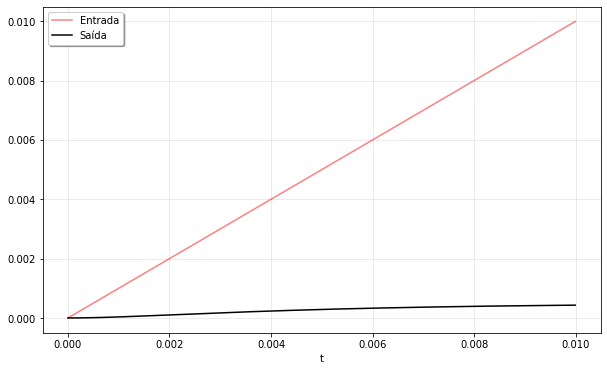

In [34]:
# Valores dos Componentes
R1 = 10
R2 = 100
C1 = 50*(10**(-6))
L1 = 0.1

t=np.linspace(0,0.01,1000,endpoint=False)
u=t

sys2 = lti([1, 0], [(L1/R1), ((R2 + R1)/R1), (1/(R1*C1))])
tout, yout, xout = lsim(sys2,U=u,T=t)

plt.figure(figsize=(10,6))
plt.plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout,yout,'k',linewidth=1.5,label='Saída')
plt.legend(loc='upper left',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

Novamente, o filtro passa-banda começa a atenuar o sinal nas frequências mais baixas, gerando apenas uma pequena subida inicial devido ao atraso da resposta natural. No longo prazo, a resposta tende a estabilizar, após inicialmente sofrer essa subida.

### Circuito 3

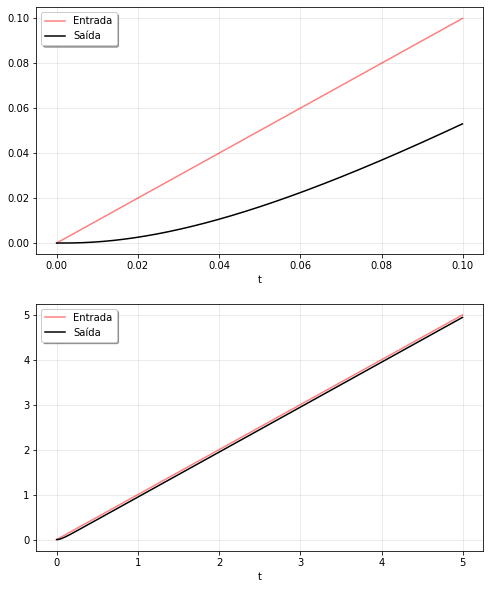

In [35]:
# Valores dos Componentes
R1 = 1000
R2 = 10000
C1 = 3*(10**(-6))
C2 = 5*(10**(-6))

t=np.linspace(0,0.1,1000,endpoint=False)
u=t

sys3 = lti([1], [C1*C2*R1*R2, C2*(R2 + R1), 1])
tout, yout, xout = lsim(sys3,U=u,T=t)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(8,10), sharex=False)

graf[0].plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
graf[0].plot(tout,yout,'k',linewidth=1.5,label='Saída')
graf[0].legend(loc='upper left',shadow=True,framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')


# Se utilizarmos uma escala de tempo maior, as curvas irão coincidir

t=np.linspace(0,5,1000,endpoint=False)
u=t

sys3 = lti([1], [C1*C2*R1*R2, C2*(R2 + R1), 1])
tout, yout, xout = lsim(sys3,U=u,T=t)

graf[1].plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
graf[1].plot(tout,yout,'k',linewidth=1.5,label='Saída')
graf[1].legend(loc='upper left',shadow=True,framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()

Como a magnitude do sinal de entrada está concentrada nas frequências mais baixas, um filtro passa-baixa irá deixar passar a maior parte do sinal, providenciando como resposta do sistema uma outra rampa de inclinação semelhante, que tende a convergir com a rampa unitária da entrada.

O único detalhe aqui é que, bem no início do sinal, a onda é levemente atenuada, por causa da verticalização da entrada e da atuação do passa-baixa. A partir do momento que a onda se estabiliza, a resposta segue uma rampa com a mesma inclinação da entrada, mas com um atraso, ainda que bem pequeno.

### Circuito 5

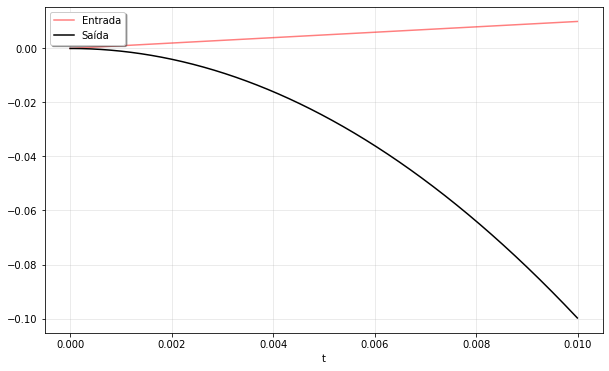

In [36]:
# Valores dos Componentes
R1 = 100
C2 = 5*(10**(-6))

t=np.linspace(0,0.01,1000,endpoint=False)
u=t

sys5 = lti([-1], [C2*R1, 0])
tout, yout, xout = lsim(sys5,U=u,T=t)

plt.figure(figsize=(10,6))
plt.plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout,yout,'k',linewidth=1.5,label='Saída')
plt.legend(loc='upper left',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

A resposta a rampa unitária é uma parábola decrescente. Tendo em vista que o circuito é um integrador inversor, e a função de entrada da rampa é "t", é natural que a resposta seja o inverso da sua integral, $-\frac{s^2}{2}$

### Circuito 6

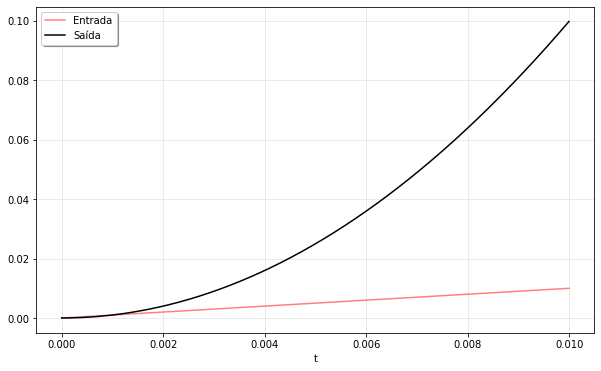

In [37]:
# Valores dos Componentes
R = 100
C = 5*(10**(-6))

t=np.linspace(0,0.01,1000,endpoint=False)
u=t

sys5 = lti([1], [R*C, 0])
tout, yout, xout = lsim(sys5,U=u,T=t)

plt.figure(figsize=(10,6))
plt.plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout,yout,'k',linewidth=1.5,label='Saída')
plt.legend(loc='upper left',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

Como este circuito é um integrador não inversor, era esperado que a resposta fosse uma parábola crescente, o inverso da resposta do circuito 5, $\frac{s^2}{2}$

## (J) - Resposta a uma onda quadrada de frequência ω

### Circuito 1

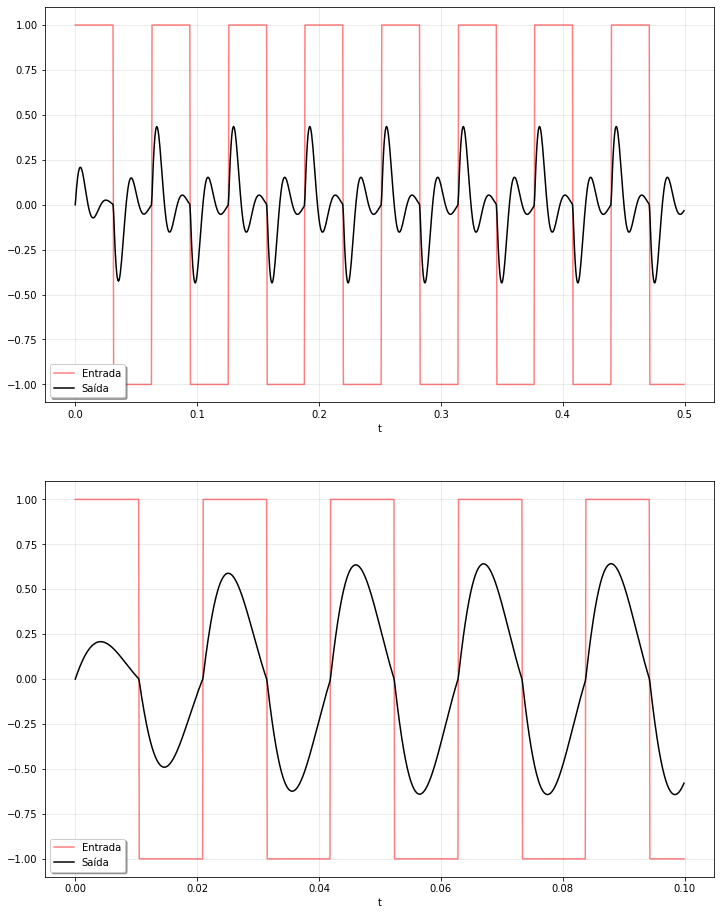

In [38]:
#Foi escolhido uma frequência w de 100 rad/s
w = 100

R1 = 10
R2 = 10
C1 = 0.001
L1 = 0.01

#Função de transferência
sys1 = signal.lti([1, 0], [R1*C1, ((R2 + R1)/R2), R1/L1])


#Definição da variável tempo e da onda quadrada
t = np.linspace(0, 0.5, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys1, U=u, T=t)

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (12,16), sharex = False)

graf[0].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')


# Aumentando a frequência e colocando-a dentro do intervalo da banda passante, podemos perceber que o sinal será menos atenuado.
w1 = 300

t = np.linspace(0, 0.1, 1000, endpoint=False)
u = signal.square(t*w1)

tout, yout, xout = lsim(sys1, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()


Foi escolhida a frequência angular de 100 rad/s, valor um pouco abaixo da banda de frequência ideal, o que permite vizualizar muito bem a atenuação do sinal na resposta a onda quadrada. Se fosse escolhida uma frequencia muito longe da banda do filtro, a amplitude da resposta seria muito menor que a entrada, e não seria possível vizualizar de forma comparativa a entrada e a saída.

Percebe-se pelo segundo gráfico que ao escolher uma frequência pertencente à banda passante do filtro (300 rad/s), o sinal é bem menos atenuado do que no primeiro gráfico. Obviamente, como estamos falando de um sistema prático não-ideal, ainda haverá uma atenuação, porém perceptivelmente menor do que no caso de uma frequência fora da banda.

### Circuito 2

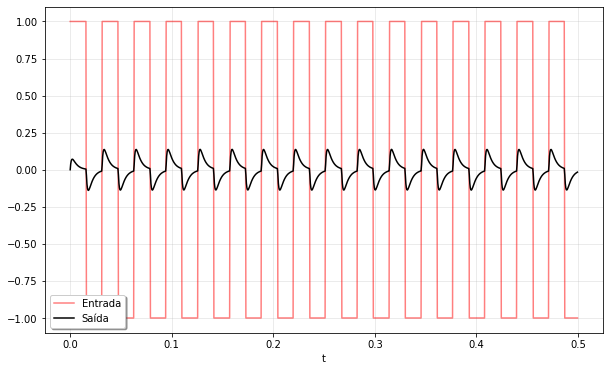

In [39]:
#Foi escolhido uma frequência w de 200 rad/s
w = 200

R1 = 10
R2 = 100
C1 = 50*(10**(-6))
L1 = 0.1

#Função de transferência
sys2 = lti([1, 0], [(L1/R1), ((R2 + R1)/R1), (1/(R1*C1))])

#Definição da variável tempo e da onda quadrada
t = np.linspace(0, 0.5, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys2, U=u, T=t)

plt.figure(figsize=(10,6))
plt.plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
plt.plot(tout, yout, 'k', linewidth=1.5, label='Saída')
plt.legend(loc='best', shadow=True, framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

Foi escolhida a frequência angular de 200 rad/s, valor um pouco abaixo da banda de frequência ideal, o que permite vizualizar muito bem a atenuação do sinal na resposta a onda quadrada. Se fosse escolhida uma frequencia muito longe da banda do filtro, a amplitude da resposta seria muito menor que a entrada, e não seria possível vizualizar de forma comparativa a entrada e a saída.

### Circuito 3

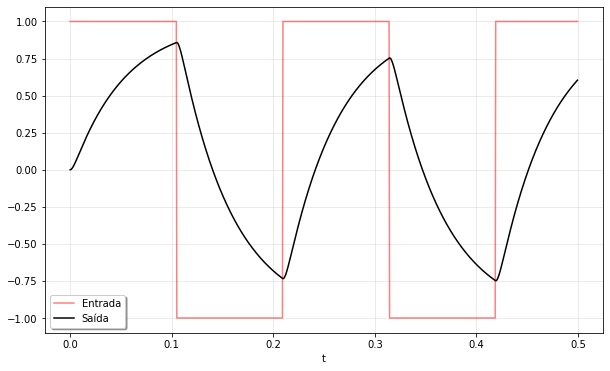

In [40]:
#Foi escolhido uma frequência w de 30 rad/s
w = 30

R1 = 1000
R2 = 10000
C1 = 3*(10**(-6))
C2 = 5*(10**(-6))

#Função de transferência
sys3 = lti([1], [C1*C2*R1*R2, C2*(R2 + R1), 1])


#Definição da variável tempo e da onda quadrada
t = np.linspace(0, 0.5, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys3, U=u, T=t)

plt.figure(figsize=(10,6))
plt.plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
plt.plot(tout, yout, 'k', linewidth=1.5, label='Saída')
plt.legend(loc='best', shadow=True, framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

A partir da estimativa da frequência de corte do sistema, na leitura do diagrama de Bode, foi escolhida uma frequência de w = 30 rad/s (frequência um pouco maior que a frequência de corte estimada pelo diagrama), a fim de gerar pouca atenuação no sinal de saída.
Com isso, podemos ver que a resposta do sistema a onda quadrada evidencia um ganho negativo em relação a entrada.

### Circuito 5

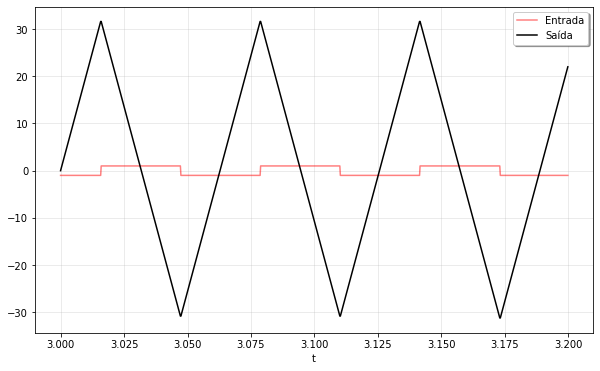

In [41]:
#Foi escolhido uma frequência w de 100 rad/s
w = 100

R1 = 100
C2 = 5*(10**(-6))

#Função de transferência
sys5 = lti([-1], [C2*R1, 0])


#Definição da variável tempo e da onda quadrada
t = np.linspace(3, 3.2, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys5, U=u, T=t)

plt.figure(figsize=(10,6))
plt.plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
plt.plot(tout, yout, 'k', linewidth=1.5, label='Saída')
plt.legend(loc='best', shadow=True, framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

De novo, a resposta para o integrador inversor será a integral invertida da entrada, que nesse caso é uma onda quadrada.

Esses picos de amplitude são gerados devido ao ganho do sistema e à atenuação dos sinais de entrada.

### Circuito 6

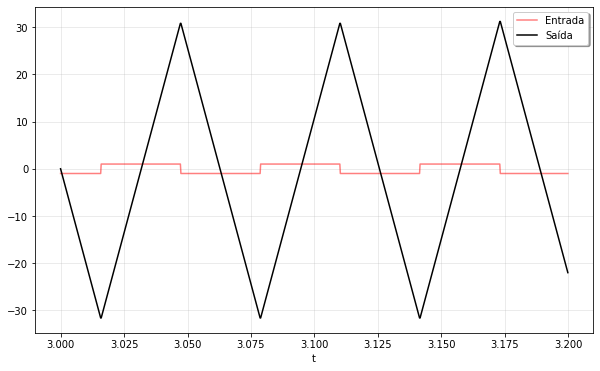

In [42]:
#Foi escolhido uma frequência w de 100 rad/s
w = 100

R = 100
C = 5*(10**(-6))

#Função de transferência
sys6 = lti([1], [R*C, 0])


#Definição da variável tempo e da onda quadrada
t = np.linspace(3, 3.2, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys6, U=u, T=t)

plt.figure(figsize=(10,6))
plt.plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
plt.plot(tout, yout, 'k', linewidth=1.5, label='Saída')
plt.legend(loc='best', shadow=True, framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

Como esperado, a resposta desse sistema à onda quadrada é o inverso da resposta do circuito 5.


## (K) até (N) - Resposta aos n harmônicos da série de Fourier de uma onda quadrada de frequência $ω$

### Circuito 1

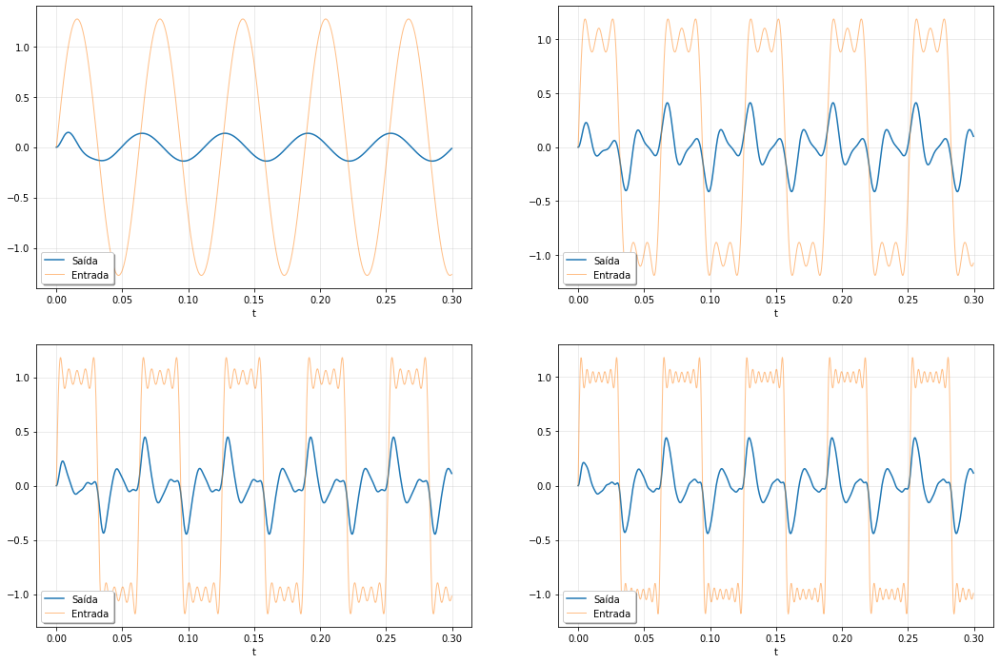

In [43]:
# Valores dos componentes
R1 = 10
R2 = 10
C1 = 0.001
L1 = 0.01

w = 100 # Frequência

t = np.linspace(0, 0.3, 1000, endpoint=False)

#Função de transferência
sys1 = signal.lti([1, 0], [R1*C1, ((R2 + R1)/R2), R1/L1])

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input1 = soma * 4/(np.pi)

tout, yout, xout = signal.lsim(sys1, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input2 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys1, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys1, U=input3, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)

tout, yout, xout = signal.lsim(sys1, U=input3, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à onda quadrada.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à onda quadrada, mas também com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da onda quadrada, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à onda quadrada para este sistema.

Foi escolhida uma frequência um pouco menor do que a banda passante do filtro para melhorar a visualização dos diferentes harmônicos da série de Fourier.

Como esperado ao aplicar a série de Fourier, quanto maior o número de harmônicos, a soma desses harmônicos tende a se igualar à onda quadrada, embora nunca consiga perfeitamente devido ao fenômeno de Gibbs.



### Circuito 2

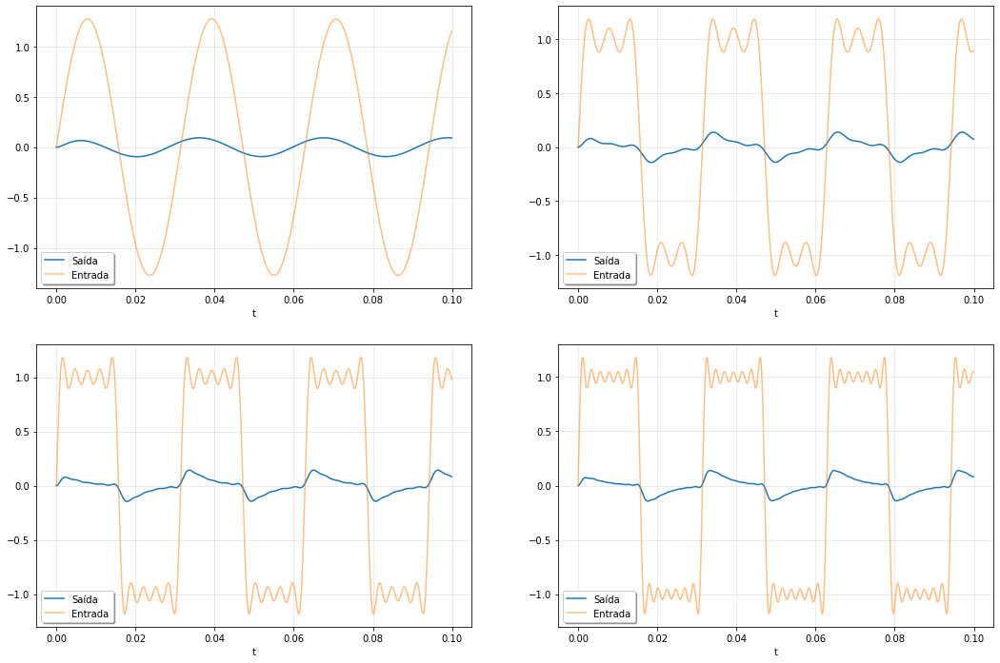

In [44]:
# Valores dos Componentes
R1 = 10
R2 = 100
C1 = 50*(10**(-6))
L1 = 0.1

w = 200   # Frequência

t = np.linspace(0,0.1, 1000, endpoint=False)

# Função de Transferência

sys2 = signal.lti ([1, 0], [(L1/R1), ((R2 + R1)/R1), (1/(R1*C1))])

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input1 = soma * 4/(np.pi)

tout, yout, xout = signal.lsim (sys2, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1.5, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input2 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys2, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1.5, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys2, U=input3, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')


graf[1][0].plot(t, input3, alpha=0.5, linewidth=1.5, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input4 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys2, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')


graf[1][1].plot(t, input4, alpha=0.5, linewidth=1.5, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()


No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à onda quadrada.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à onda quadrada, mas também com grandes oscilações.

No terceiro gráfico há um menor número de oscilações tanto na entrada quanto na saída do sistema.

Por último, no quarto gráfico já temos a soma da série de Fourier tendendo ao formato da onda quadrada, com oscilações muito menores em relação aos outros três gráficos. Conforme o número de harmônicos aumenta, a resposta à série de Fourier se assemelha à resposta à onda quadrada para este sistema cada vez mais.

Como esperado ao aplicar a série de Fourier, quanto maior o número de harmônicos, a soma desses harmônicos tende a se igualar à onda quadrada, apesar de nunca conseguir se igualar perfeitamente, devido ao fenômeno de Gibbs.


### Circuito 3

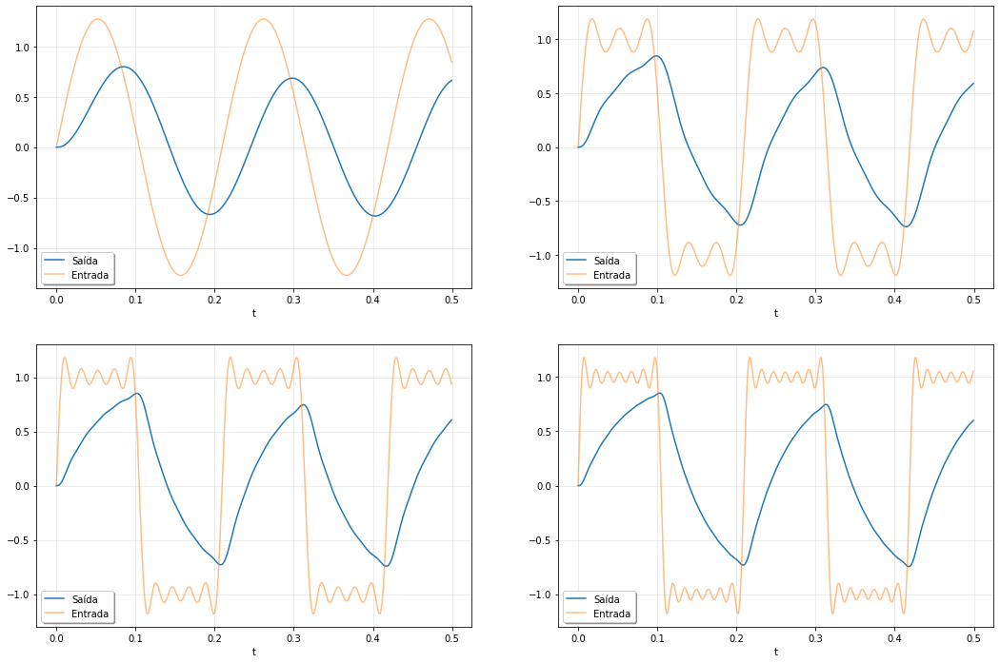

In [45]:
R1 = 1000
R2 = 10000
C1 = 3*(10**(-6))
C2 = 5*(10**(-6))

w = 30

t = np.linspace(0, 0.5, 1000, endpoint=False)

sys3 = lti([1], [C1*C2*R1*R2, C2*(R2 + R1), 1])

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input1 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys3, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')


graf[0][0].plot(t, input1, alpha=0.5, linewidth=1.5, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input2 = soma * 4/(np.pi)
 
tout, yout, xout = signal.lsim (sys3, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1.5, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys3, U=input3, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1.5, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input4 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys3, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')


graf[1][1].plot(t, input4, alpha=0.5, linewidth=1.5, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()


No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à onda quadrada.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes.

No terceiro e no quarto gráfico já temos a soma da série de Fourier tendendo ao formato da onda quadrada, com oscilações muito menores em relação aos outros dois gráficos. 

No caso deste circuito, a resposta à série de Fourier da onda quadrada é quase igual nos três últimos gráficos, com leves diferenças no tamanho das oscilações.

Como esperado ao aplicar a série de Fourier, quanto maior o número de harmônicos, a soma desses harmônicos tende a se igualar à onda quadrada, apesar de nunca conseguir se igualar perfeitamente, devido ao fenômeno de Gibbs.

### Circuito 5

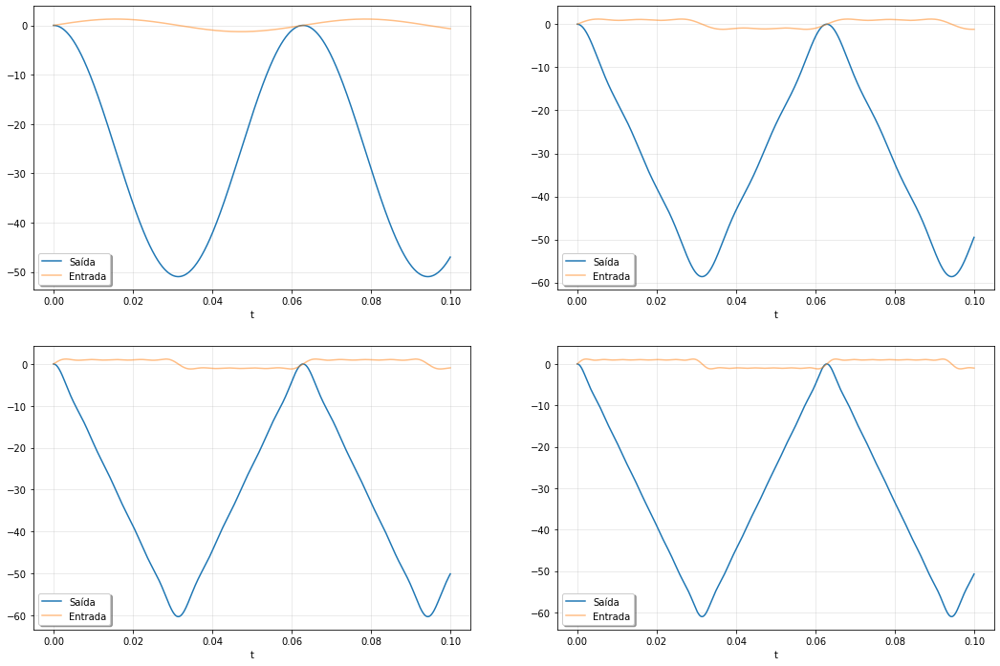

In [46]:
R1 = 100
C2 = 5*(10**(-6))

w = 100

t = np.linspace(0, 0.1, 1000, endpoint=False)
#t = np.linspace(3, 3.2, 1000, endpoint=False)

sys5 = lti([-1], [C2*R1, 0])

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input1 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys5, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1.5, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input2 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys5, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')


graf[0][1].plot(t, input2, alpha=0.5, linewidth=1.5, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys5, U=input3, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1.5, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input4 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys5, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1.5, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()


Mais uma vez, a resposta do sistema será a integral inversa da entrada

No primeiro gráfico, a resposta será a integral inversa da senoide do primeiro harmônico da série de Fourier para onda quadrada, resultando em um cossenoide invertido.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à onda quadrada, mas com algumas oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da onda quadrada, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à onda quadrada para este sistema.

Como esperado ao aplicar a série de Fourier, quanto maior o número de harmônicos, a soma desses harmônicos tende a se igualar à onda quadrada, apesar de nunca conseguir se igualar perfeitamente, devido ao fenômeno de Gibbs.

### Circuito 6

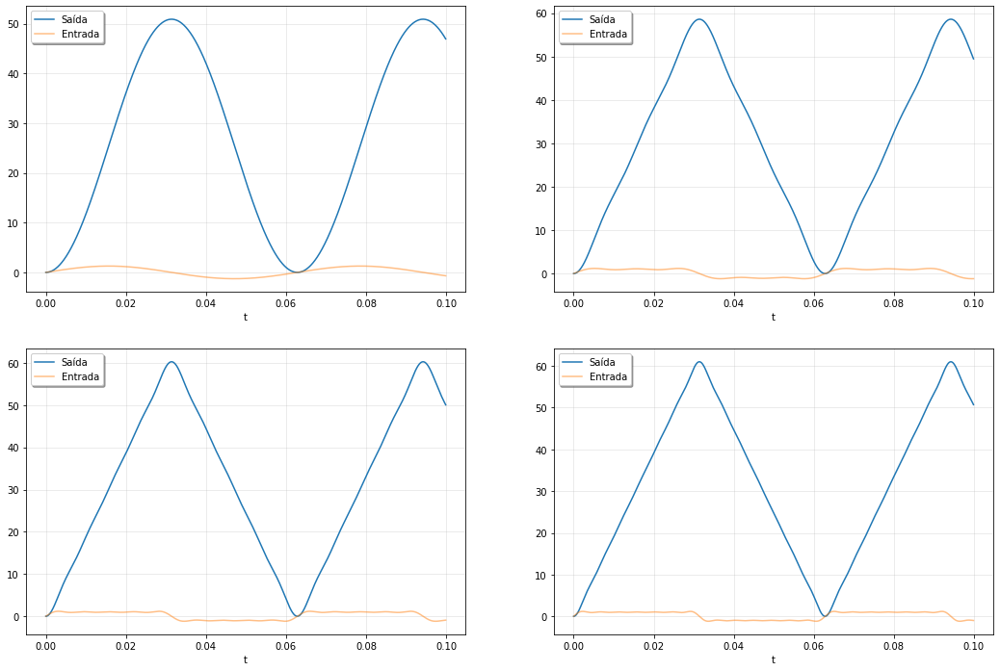

In [47]:
R = 100
C = 5*(10**(-6))

w = 100

t = np.linspace(0, 0.1, 1000, endpoint=False)
#t = np.linspace(3, 3.2, 1000, endpoint=False)

sys6 = lti([1], [R*C, 0])

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input1 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys6, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')


graf[0][0].plot(t, input1, alpha=0.5, linewidth=1.5, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input2 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys6, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1.5, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys6, U=input3, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1.5, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range (1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input4 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim (sys6, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1.5, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()


De novo, se a resposta do circuito 5 foi a integral inversa, a do circuito 6 será apenas a integral. 

No primeiro gráfico, a resposta será a integral da senoide do primeiro harmônico da série de Fourier para onda quadrada, resultando em um cossenoide.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à onda quadrada, mas com algumas oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da onda quadrada, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à onda quadrada para este sistema.

Como esperado ao aplicar a série de Fourier, quanto maior o número de harmônicos, a soma desses harmônicos tende a se igualar à onda quadrada, apesar de nunca conseguir se igualar perfeitamente, devido ao fenômeno de Gibbs.

## (O) - Resposta a uma Dente de Serra de frequência $ω$

### Circuito 1

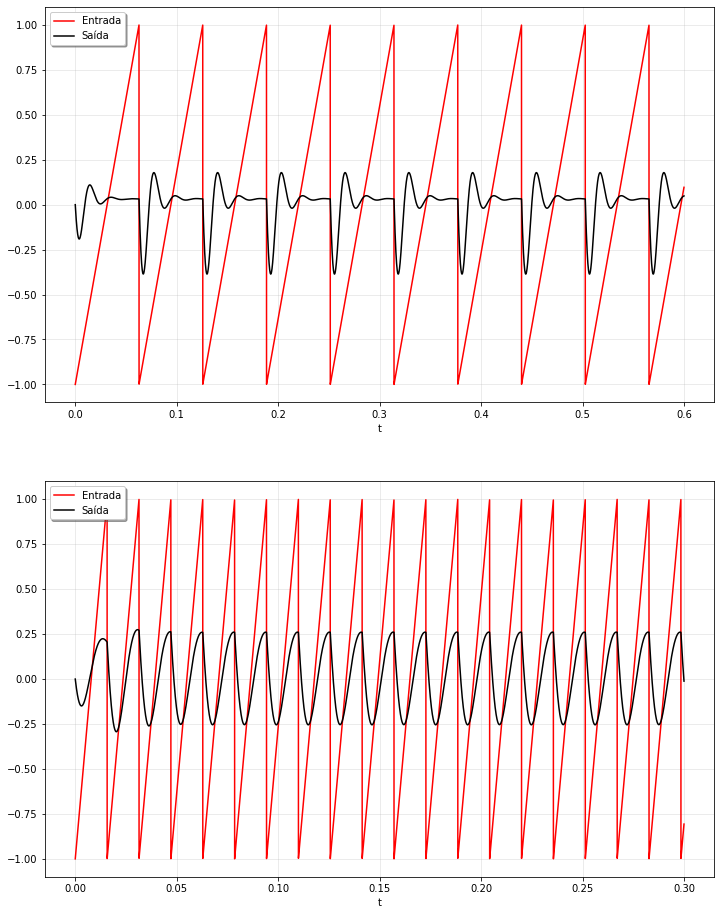

In [48]:
# Valores dos componentes
R1 = 10
R2 = 10
C1 = 0.001
L1 = 0.01

#Foi escolhido uma frequência w de 100 rad/s
w = 100

#Função de transferência
sys1 = lti([1, 0], [R1*C1, ((R2 + R1)/R2), R1/L1])

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (12,16), sharex = False)

#Definição da variável tempo e do sinal
t = np.linspace(0, 0.6, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys1, U=u, T=t)

graf[0].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')


# Como foi feito com a onda quadrada, aumentando a frequência e colocando-a no 
# intervalo da banda passante, podemos perceber que o sinal será bem menos atenuado.

w1 = 400

t = np.linspace(0, 0.3, 10000, endpoint=False)
u = signal.sawtooth(w1*t)

tout, yout, xout = lsim(sys1, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()

A análise aqui será igual a resposta a onda quadrada.

Foi escolhida a frequência angular de 100 rad/s, valor um pouco abaixo da banda de frequência ideal, o que permite vizualizar muito bem a atenuação do sinal na resposta a dente de serra. Se fosse escolhida uma frequencia muito longe da banda do filtro, a amplitude da resposta seria muito menor que a entrada, e não seria possível vizualizar de forma comparativa a entrada e a saída. É possível reparar também a distorção do sinal de resposta no início de cada onda.

Percebe-se pelo segundo gráfico que ao escolher uma frequência pertencente à banda passante do filtro (400 rad/s), o sinal é bem menos atenuado do que no primeiro gráfico. Obviamente, como estamos falando de um sistema prático não-ideal, ainda haverá uma atenuação, porém perceptivelmente menor do que no caso de uma frequência fora da banda. Vemos também que conforme vamos nos aproximando da frequência ideal do passa-faixa, o formato do sinal de resposta se assemelha ao dente de serra cada vez mais.



### Circuito 2

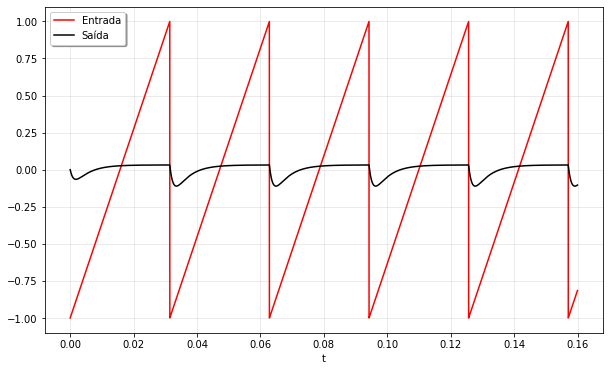

In [49]:
# Valores dos componentes
R1 = 10
R2 = 100
C1 = 50*(10**(-6))
L1 = 0.1


#Foi escolhido uma frequência w de 200 rad/s
w = 200 

#Função de transferência
sys2 = lti([1, 0], [(L1/R1), ((R2 + R1)/R1), (1/(R1*C1))])

#Definição da variável tempo e do sinal
t = np.linspace(0, 0.16, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys2, U=u, T=t)

plt.figure(figsize=(10,6))
plt.plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
plt.plot(tout, yout, 'k', linewidth=1.5, label='Saída')
plt.legend(loc='best', shadow=True, framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

A análise aqui será igual a resposta a onda quadrada.

Foi escolhida a frequência angular de 200 rad/s, valor um pouco abaixo da banda de frequência ideal, o que permite vizualizar muito bem a atenuação do sinal na resposta a dente de serra. Se fosse escolhida uma frequencia muito longe da banda do filtro, a amplitude da resposta seria muito menor que a entrada, e não seria possível vizualizar de forma comparativa a entrada e a saída.

### Circuito 3

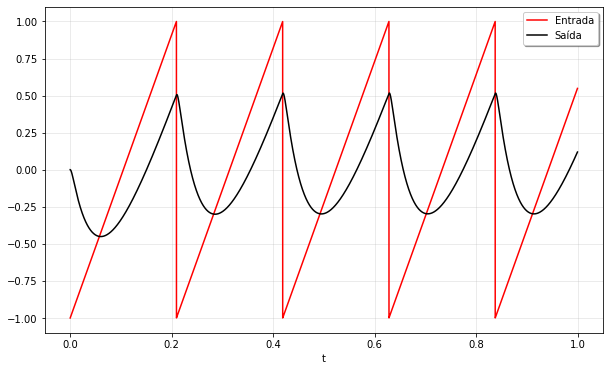

In [50]:
# Valores dos componentes
R1 = 1000
R2 = 10000
C1 = 3*(10**(-6))
C2 = 5*(10**(-6))


#Foi escolhido uma frequência w de 30 rad/s
w = 30

#Função de transferência
sys3 = lti([1], [C1*C2*R1*R2, C2*(R2 + R1), 1])

#Definição da variável tempo e do sinal
t = np.linspace(0, 1, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys3, U=u, T=t)

plt.figure(figsize=(10,6))
plt.plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
plt.plot(tout, yout, 'k', linewidth=1.5, label='Saída')
plt.legend(loc='best', shadow=True, framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

A partir da estimativa da frequência de corte do sistema, na leitura do diagrama de Bode, foi escolhida uma frequência de w = 30 rad/s (frequência um pouco maior que a frequência de corte estimada pelo diagrama), a fim de gerar pouca atenuação no sinal de saída.
Com isso, podemos ver que a resposta do sistema a onda quadrada evidencia um ganho negativo em relação a entrada.

### Circuito 5

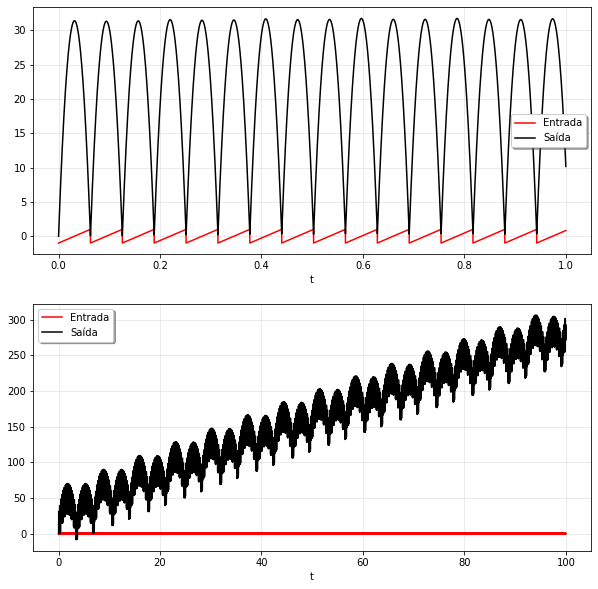

In [51]:
# Valores dos componentes
R1 = 100
C2 = 5*(10**(-6))

#Foi escolhido uma frequência w de 100 rad/s
w = 100

#Função de transferência
sys5 = lti([-1], [C2*R1, 0])

fig, graf = plt.subplots (nrows=2, ncols=1, figsize=(10,10), sharex=False)

#Definição da variável tempo e do sinal
t = np.linspace(0, 1, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys5, U=u, T=t)


graf[0].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')


t = np.linspace(0, 100, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys5, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()

A saída é a integral inversa do dente de serra, formando parábolas com coeficiente negativo.

Pelo segundo gráfico, é possível visualizar melhor que, com o tempo, as parábolas vão subindo no eixo y.

### Circuito 6

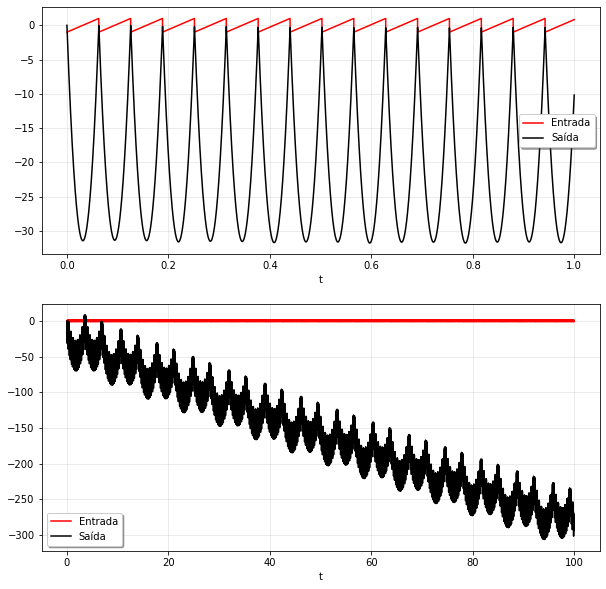

In [52]:
# Valores dos componentes
R = 100
C = 5*(10**(-6))

#Foi escolhido uma frequência w de 100 rad/s
w = 100

#Função de transferência
sys6 = lti([1], [R*C, 0])

fig, graf = plt.subplots (nrows=2, ncols=1, figsize=(10,10), sharex=False)

#Definição da variável tempo e do sinal
t = np.linspace(0, 1, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys6, U=u, T=t)

graf[0].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')


t = np.linspace(0, 100, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys6, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()

A saída é a integral do dente de serra, formando parábolas com coeficiente positivo.

Pelo segundo gráfico, é possível visualizar melhor que, com o tempo, as parábolas vão decrescendo no eixo y.

## (P) até (S) - Resposta aos n harmônicos da série de Fourier de uma dente de serra de frequência $ω$

### Circuito 1

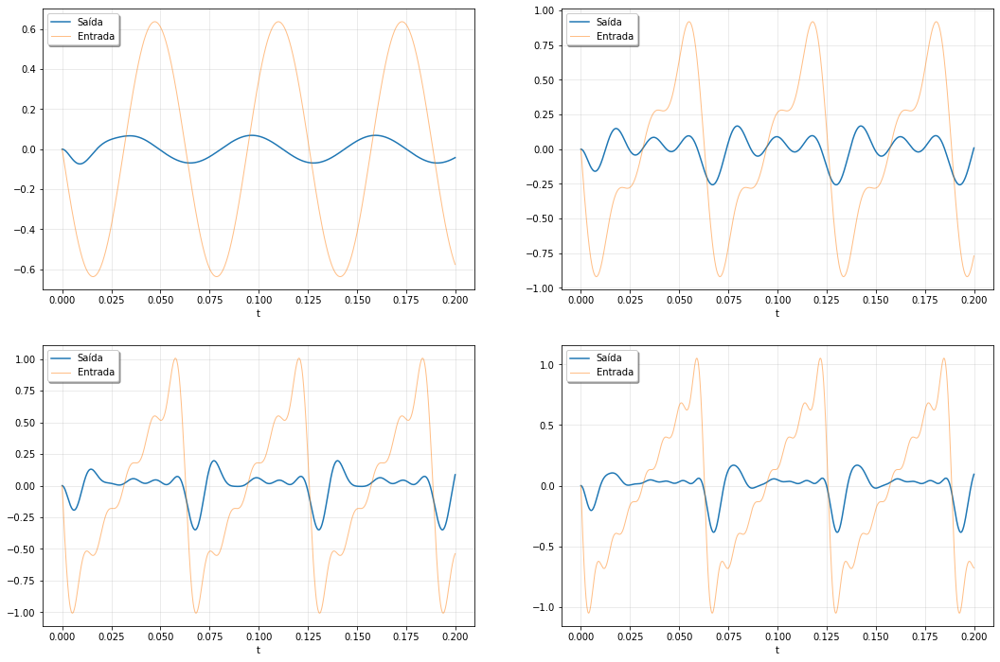

In [53]:
# Valores dos componentes
R1 = 10
R2 = 10
C1 = 0.001
L1 = 0.01

#Foi escolhido uma frequência w de 100 rad/s
w = 100

#Função de transferência
sys1 = lti([1, 0], [R1*C1, ((R2 + R1)/R2), R1/L1])

t = np.linspace (0, 0.2, 1000, endpoint=False)

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input1 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys1, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')


graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys1, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys1, U=input2, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input4 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys1, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()


Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à dente de serra na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a dente de serra, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à dente de serra, mas também com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à dente de serra para este sistema.

### Circuito 2

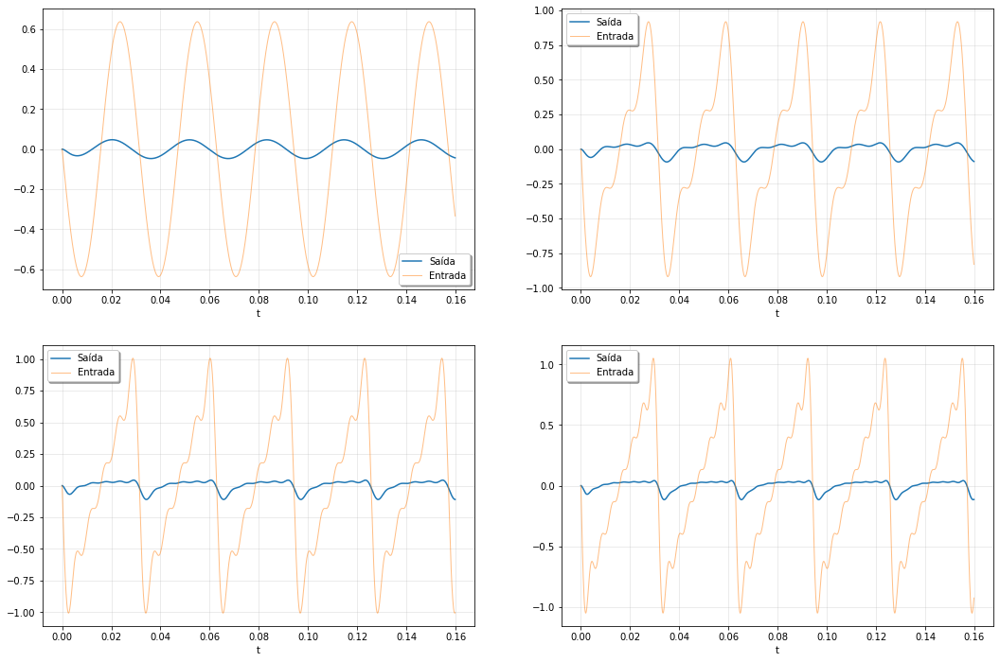

In [54]:
# Valores dos componentes
R1 = 10
R2 = 100
C1 = 50*(10**(-6))
L1 = 0.1

#Foi escolhido uma frequência w de 200 rad/s
w = 200

#Função de transferência
sys2 = lti([1, 0], [(L1/R1), ((R2 + R1)/R1), (1/(R1*C1))])

t = np.linspace (0, 0.16, 1000, endpoint=False)

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input1 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys2, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')


graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys2, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys2, U=input2, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input4 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys2, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à dente de serra, mas também com grandes oscilações.

No terceiro gráfico há um menor número de oscilações tanto na entrada quanto na saída do sistema.

Por último, no quarto gráfico já temos a soma da série de Fourier tendendo ao formato da dente de serra, com oscilações muito menores em relação aos outros três gráficos. Conforme o número de harmônicos aumenta, a resposta à série de Fourier se assemelha à resposta à dente de serra para este sistema cada vez mais.

Como esperado ao aplicar a série de Fourier, quanto maior o número de harmônicos, a soma desses harmônicos tende a se igualar à dente de serra, apesar de nunca conseguir se igualar perfeitamente, devido ao fenômeno de Gibbs.

### Circuito 3

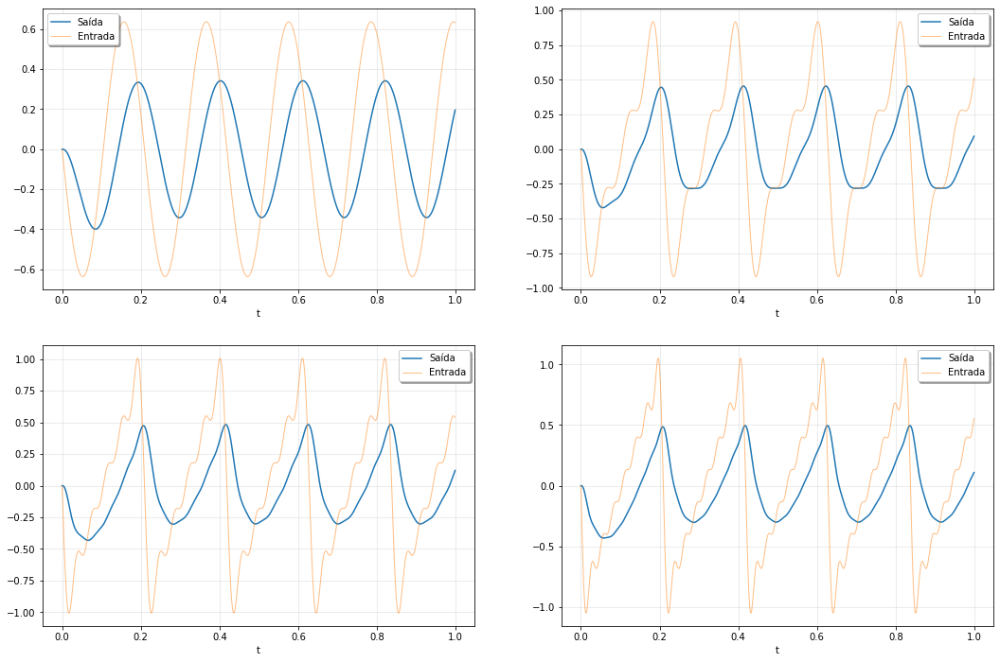

In [55]:
# Valores dos componentes
R1 = 1000
R2 = 10000
C1 = 3*(10**(-6))
C2 = 5*(10**(-6))

#Foi escolhido uma frequência w de 30 rad/s
w = 30

#Função de transferência
sys3 = lti([1], [C1*C2*R1*R2, C2*(R2 + R1), 1])

t = np.linspace (0, 1, 1000, endpoint=False)

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input1 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys3, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
 
tout, yout, xout = signal.lsim(sys3, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')


graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys3, U=input2, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input4 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys3, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à dente de serra na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a dente de serra, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à dente de serra, mas também com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à dente de serra para este sistema.

### Circuito 5

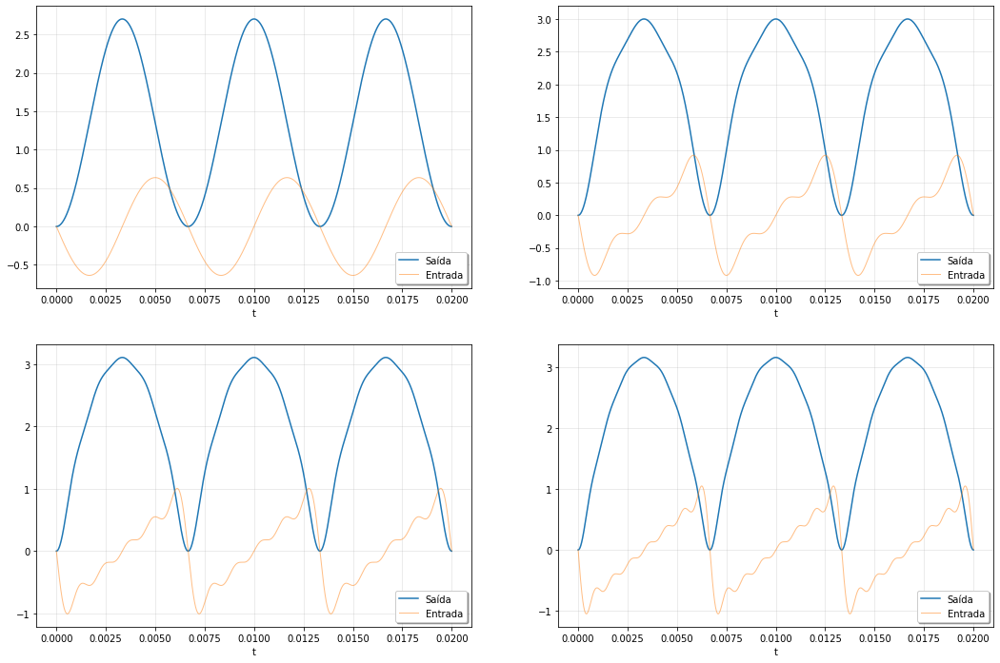

In [56]:
# Valores dos componentes
R1 = 100
C2 = 5*(10**(-6))

#Foi escolhido uma frequência w de 300 rad/s
w = 300

#Função de transferência
sys5 = lti([-1], [C2*R1, 0])

#Definição da variável tempo e do sinal
t = np.linspace(0, 0.02, 10000, endpoint=False)

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*np.pi*t*w)))/num
    soma += serie
  input1 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys5, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*np.pi*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys5, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*np.pi*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys5, U=input2, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*np.pi*t*w)))/num
    soma += serie
  input4 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys5, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()


Mais uma vez, a resposta do sistema será a integral inversa da entrada

No primeiro gráfico, a resposta será a integral inversa da senoide do primeiro harmônico da série de Fourier para a dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à dente de serra, mas com algumas oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à dente de serra para este sistema.

Como esperado ao aplicar a série de Fourier, quanto maior o número de harmônicos, a soma desses harmônicos tende a se igualar à dente de serra, apesar de nunca conseguir se igualar perfeitamente, devido ao fenômeno de Gibbs.

### Circuito 6

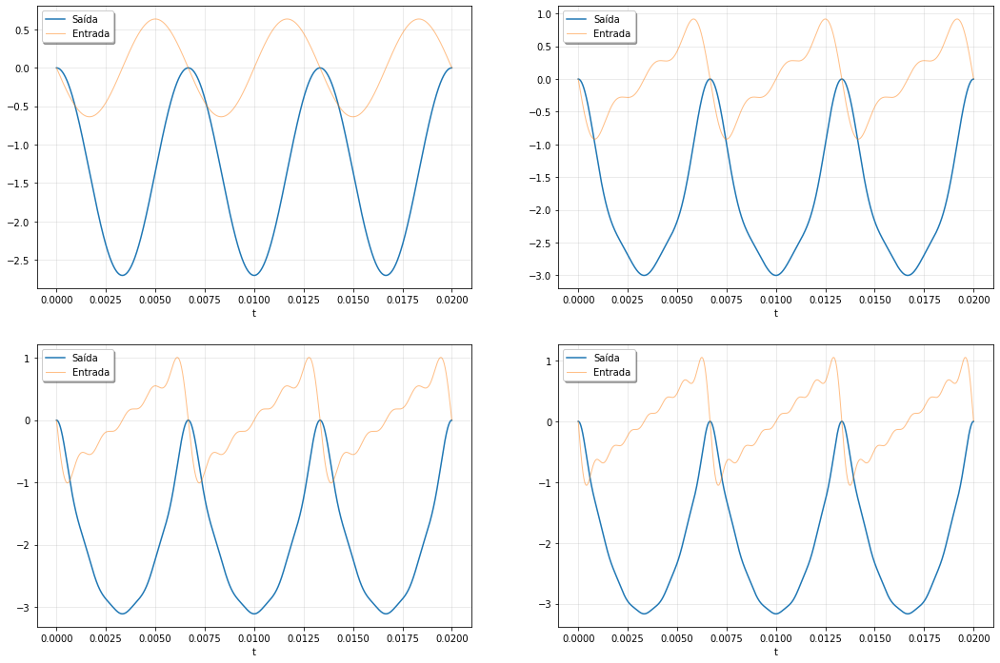

In [57]:
# Valores dos componentes
R = 100
C = 5*(10**(-6))

#Foi escolhido uma frequência w de 300 rad/s
w = 300

#Função de transferência
sys6 = lti([1], [R*C, 0])

#Definição da variável tempo e do sinal
t = np.linspace(0, 0.02, 10000, endpoint=False)

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*np.pi*t*w)))/num
    soma += serie
  input1 = (2/np.pi)*soma
 
tout, yout, xout = signal.lsim(sys6, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*np.pi*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys6, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*np.pi*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys6, U=input2, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*np.pi*t*w)))/num
    soma += serie
  input4 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys6, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()


Mais uma vez, se a resposta do circuito 5 foi a integral inversa, a do circuito 6 será apenas a integral.

No primeiro gráfico, a resposta será a integral da senoide do primeiro harmônico da série de Fourier para dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à dente de serra, mas com algumas oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à dente de serra para este sistema.

Como esperado ao aplicar a série de Fourier, quanto maior o número de harmônicos, a soma desses harmônicos tende a se igualar à dente de serra, apesar de nunca conseguir se igualar perfeitamente, devido ao fenômeno de Gibbs.

# Questão 2

## (A) - Função de Transferência

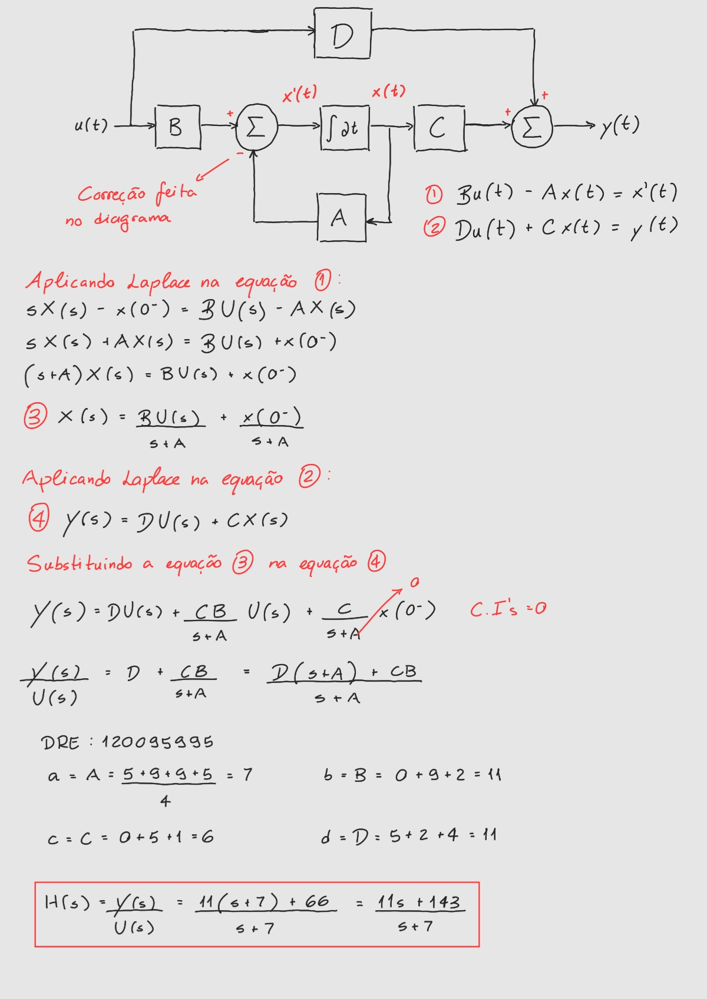

## (B) - Diagrama de Polos e Zeros

Polo = -7 \\
Zero = -13

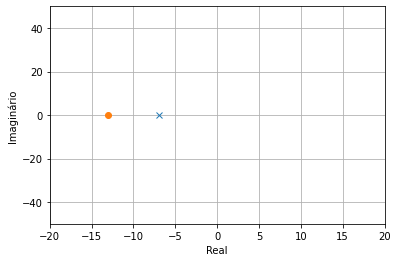

<Figure size 72x288 with 0 Axes>

In [58]:
(zeros, poles, gain) = tf2zpk([11, 143], [1, 7])
angle = np.linspace(-np.pi, np.pi, 500)
cirx = np.sin(angle)
ciry = np.cos(angle)

plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
plt.grid()
plt.xlim((-20, 20))
plt.xlabel('Real')
plt.ylim((-50, 50))
plt.ylabel('Imaginário')
plt.figure()

plt.gcf().set_figwidth(1)

Pelo Diagrama de Polos e Zeros, é possível determinar que o sistema é assintóticamente estável, pois o polo está situado no SPLE.

## (C) - Diagrama de Bode

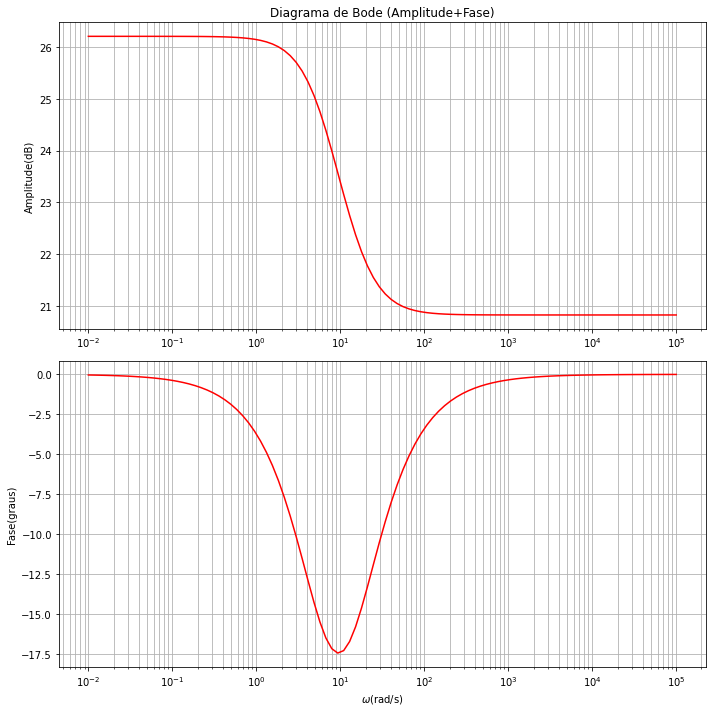

In [59]:
sys = signal.TransferFunction([11, 143], [1, 7])

w = np.logspace(-2,5,num=100, base=10.0)
w, mag, fase = signal.bode(sys,w=w,n=200)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].semilogx(w,mag, label='Magnitude', color='r') # Plot do Diagrama de Magnitude
graf[0].set_ylabel('Amplitude(dB)')
graf[0].grid(True, which="both", ls="-")

graf[1].semilogx(w,fase, label='Fase', color='r') # Plot do Diagrama de Fase
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('$\omega$(rad/s)')
graf[1].grid(True, which="both", ls="-")

plt.tight_layout()
plt.show()

Pelo Diagrama de Bode, percebe-se que o sistema corresponde é uma espécie de filtro passa-baixa. Ele tem uma particularidade em que até as frequências altas recebem um ganho, porém ele é bem menor do que o ganho que as frequências baixas recebem.  

Analisando o diagrama é possível estimar a frequência de corte do filtro como um pouco maior do que 1 rad/s.

A fase inicia em 0º. Quando há a transição do nível de ganho de amplitude no diagrama de Bode, a curva do diagrama de fase forma um vale. Quando o diagrama de amplitude se estabiliza de novo, a fase volta para seu valor inicial.

## (D) e (E)

Conforme a resolução descrita na letra (A) dessa questão:

$x'(t) = Bu(t) - Ax(t) = 11u(t) - 7x(t)$

$y(t) = Du(t) + Cx(t) = 11u(t) + 6x(t)$

## (F) - Resposta ao Degrau Unitário

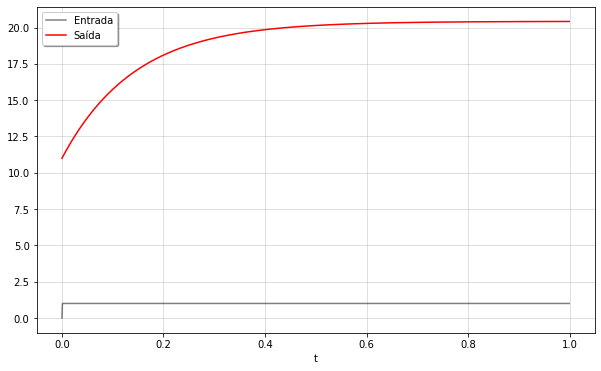

In [60]:
#Definindo a variável de tempo
t=np.linspace(0, 1, 1000,endpoint=False)
input=np.zeros_like(t)
input[t>0.0] = 1

sys = signal.TransferFunction([11, 143], [1, 7])
tout, yout = signal.step(sys, T=t)
          
plt.figure(figsize=(10,6))
plt.plot(t,input,'k',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout, yout, "r", linewidth=1.5, label='Saída')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.5)
plt.xlabel('t')
plt.show()

Como também é um filtro passa-baixa, esse sistema terá uma curva na resposta ao degrau unitário semelhante àquela do circuito 3 da questão 1. A subida do degrau unitário (alta frequência), é atenuada pelo filtro, que junto com o atraso da resposta natural provoca essa curva inicial na saída do sistema. Quando o degrau unitário se estabiliza e fica constante igual à 1 até o infinito (baixa frequência), o filtro deixa passar o sinal livremente e a resposta se estabiliza também.

A diferença desta curva em relação à do circuito 3 está no ganho desse sistema, que corresponde aproximadamente à 20 vezes a magnitude do sinal de entrada.

## (G) - Resposta à Rampa Unitária

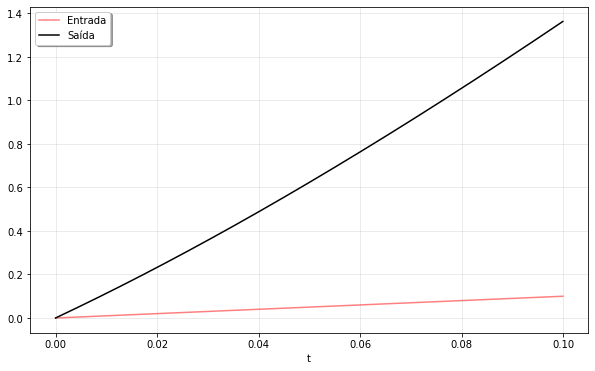

In [61]:
t=np.linspace(0,0.1,1000,endpoint=False)
u=t

sys = signal.TransferFunction([11, 143], [1, 7])
tout, yout, xout = lsim(sys,U=u,T=t)

plt.figure(figsize=(10,6))
plt.plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout,yout,'k',linewidth=1.5,label='Saída')
plt.legend(loc='upper left',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

Analisando o espectro de Fourier da rampa unitária, percebe-se que a maior parte do sinal está concentrada em frequências mais baixas. Portanto, passando esse sinal por um passa-baixa ocasionará uma resposta que tende a se igualar com a entrada.

No caso desse sistema, também há um ganho já comentado em relação ao sinal de entrada, o que causa essa inclinação maior na saída.

## (H) - Resposta a uma onda quadrada de frequência ω

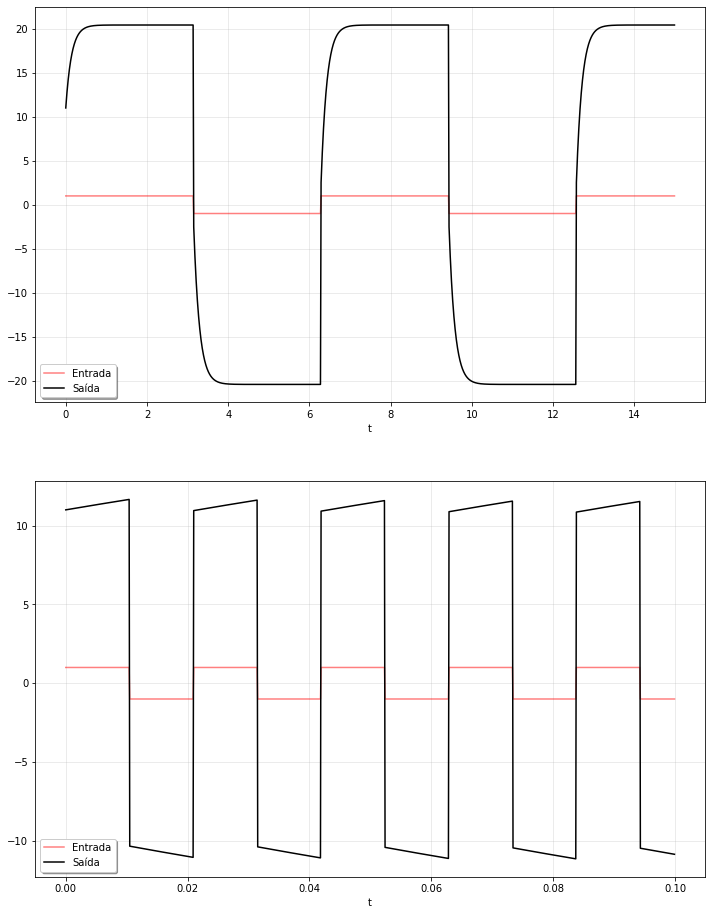

In [62]:
# Frequência = 1 rad/s
w = 1

sys = signal.TransferFunction([11, 143], [1, 7])


#Definição da variável tempo e da onda quadrada
t = np.linspace(0, 15, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys, U=u, T=t)

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (12,16), sharex = False)

graf[0].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')


# Aumentando a frequência, podemos perceber que o sinal será mais atenuado.
w1 = 300

t = np.linspace(0, 0.1, 1000, endpoint=False)
u = signal.square(t*w1)

tout, yout, xout = lsim(sys, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()


Foi escolhida uma frequência de 1 rad/s, baseado na frequência de corte do filtro, para ter uma atenuação mínima, a fim de mostrar o ganho real do sistema, aparentando ser de aproximadamente 20x em relação ao sinal de entrada.

No segundo gráfico, com uma frequência muito maior do que a frequência de corte (300 rad/s), podemos perceber que o sinal é bem mais atenuado.

## (I) até (L) - Resposta aos n harmônicos da série de Fourier de uma onda quadrada de frequência $ω$

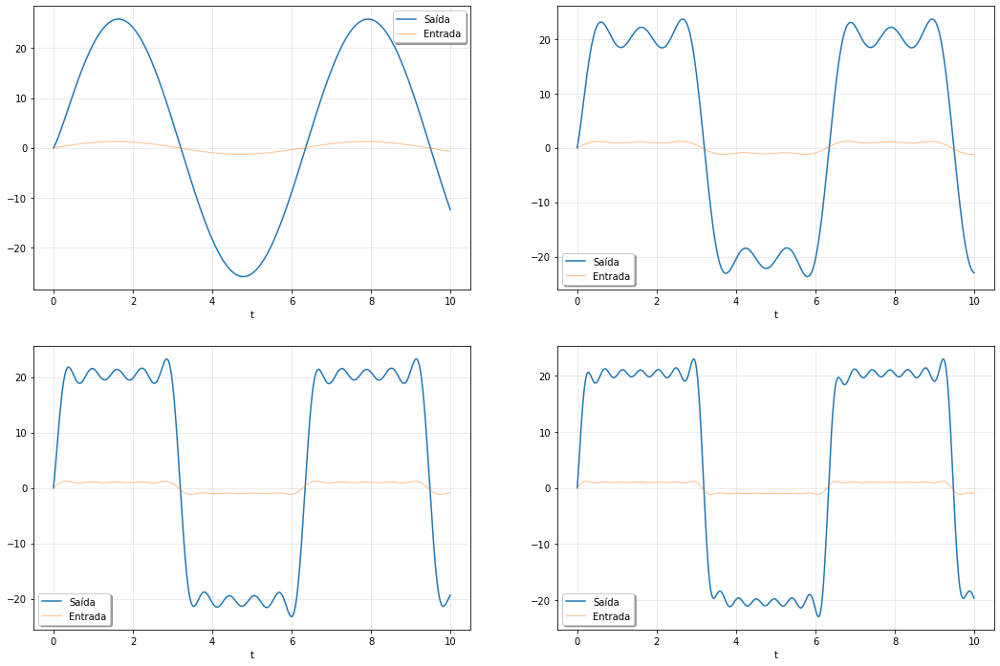

In [63]:
w = 1 # Frequência

t = np.linspace(0, 10, 1000, endpoint=False)

#Função de transferência
sys = signal.lti([11, 143], [1, 7])

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    #Expressão compacta da série de Fourier de onda quadrada
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input1 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input2 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys, U=input3, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys, U=input3, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()


Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à onda quadrada na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a onda quadrada, devido ao fenômeno de Gibbs.

Percebe-se que as saídas nos gráficos tem amplitudes 20 vezes maiores devido ao ganho do sistema, o que já era esperado, como foi analisado no diagrama de Bode.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à onda quadrada.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à onda quadrada, mas também com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da onda quadrada, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à onda quadrada para este sistema cada vez mais, conforme os harmônicos vão aumentando.



## (M) - Resposta a uma Dente de Serra de frequência $ω$

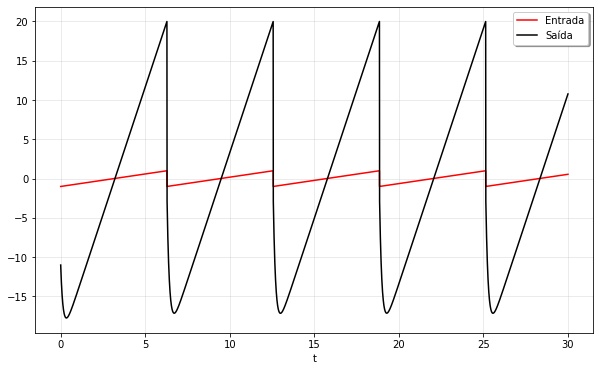

In [64]:
#Função de transferência
sys = signal.lti([11, 143], [1, 7])

#Foi escolhido uma frequência w de 1 rad/s
w = 1

#Definição da variável tempo e do sinal
t = np.linspace(0, 30, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys, U=u, T=t)

plt.figure(figsize=(10,6))
plt.plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
plt.plot(tout, yout, 'k', linewidth=1.5, label='Saída')
plt.legend(loc='best', shadow=True, framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')

plt.show()

Semelhante ao que foi feito na resposta à onda quadrada, aqui foi escolhida uma frequência de 1 rad/s (frequência de corte aproximada), com o intuito de obter uma atuação mínima e destacar o ganho do sistema, de 20 vezes o sinal de entrada.

## (N) até (Q) - Resposta aos n harmônicos da série de Fourier de uma dente de serra de frequência $ω$

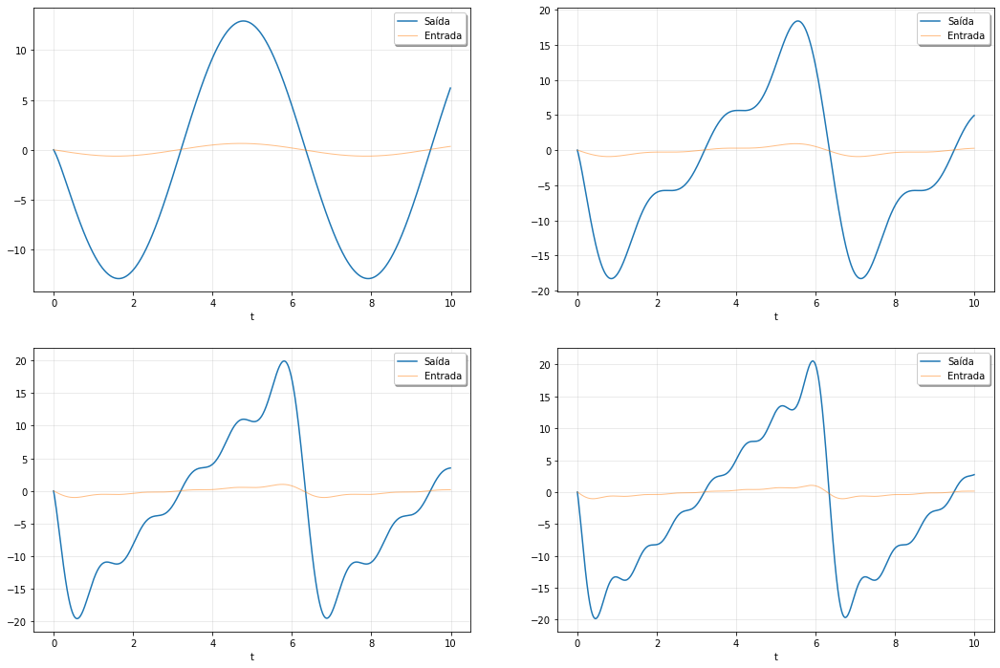

In [65]:
#Foi escolhido uma frequência w de 100
w = 1

#Função de transferência
sys = lti([11, 143], [1, 7])

t = np.linspace (0, 10, 1000, endpoint=False)

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input1 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input2, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = ((-1**(num))*(np.sin(num*t*w)))/num
    soma += serie
  input4 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à dente de serra na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a dente de serra, devido ao fenômeno de Gibbs.

Percebe-se que as saídas nos gráficos tem amplitudes 20 vezes maiores devido ao ganho do sistema, o que já era esperado, como foi analisado no diagrama de Bode.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à dente de serra, mas também com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à dente de serra para este sistema cada vez mais, conforme os harmônicos vão aumentando.

## (S) - Montagem do Diagrama de Blocos de forma prática

O diagrama de Bode desse circuito corresponde a um passa-baixa com ganho. Portanto, para implementar este circuito, seria necessário utilizar amplificadores operacionais.

## (T) - Aplicação

Como é um filtro passa-baixa, ele pode ser utilizado como um conversor analógico-digital (conversor A/D ou ADC).

# Questão 3

## Diagrama de Blocos 1 (Figura 8)


### (A) e (B) - EDO e Função de Transferência

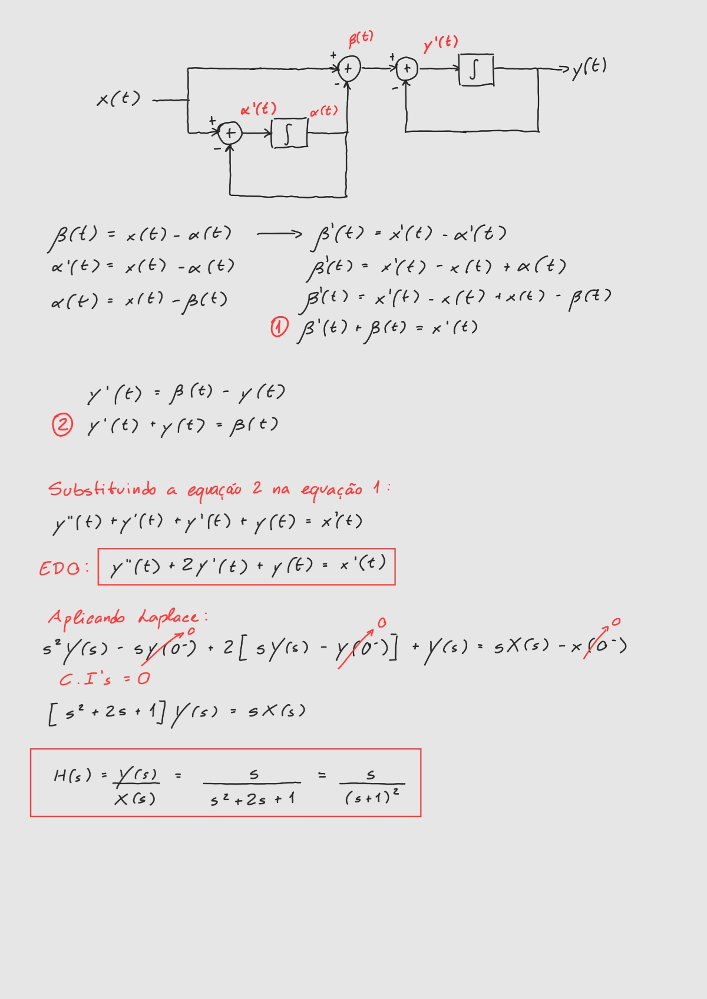

### (C) - Diagrama de Polos e Zeros

Zero = 0
Polo = -1 (polo duplo de multiplicidade 2)

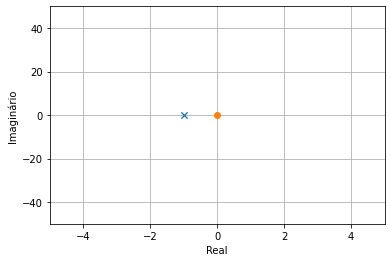

<Figure size 72x288 with 0 Axes>

In [66]:
(zeros, poles, gain) = tf2zpk([1, 0], [1, 2, 1])
angle = np.linspace(-np.pi, np.pi, 500)
cirx = np.sin(angle)
ciry = np.cos(angle)

plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
plt.grid()
plt.xlim((-5, 5))
plt.xlabel('Real')
plt.ylim((-50, 50))
plt.ylabel('Imaginário')
plt.figure()

plt.gcf().set_figwidth(1)

Podemos ver pelo Diagrama de Polos e Zeros que o sistema é assintóticamente estável, pois o polo duplo está situado no SPLE.

### (D) - Diagrama de Bode




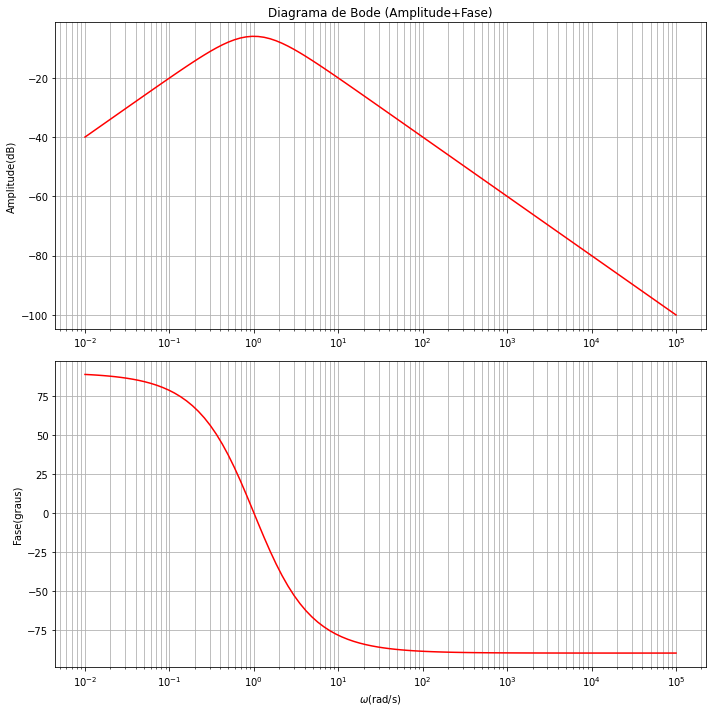

In [67]:
sys1 = signal.TransferFunction([1, 0], [1, 2, 1])

w = np.logspace(-2,5,num=100, base=10.0)
w, mag, fase = signal.bode(sys1,w=w,n=200)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].semilogx(w,mag, label='Magnitude', color='r') # Plot do Diagrama de Magnitude
graf[0].set_ylabel('Amplitude(dB)')
graf[0].grid(True, which="both", ls="-")

graf[1].semilogx(w,fase, label='Fase', color='r') # Plot do Diagrama de Fase
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('$\omega$(rad/s)')
graf[1].grid(True, which="both", ls="-")

plt.tight_layout()
plt.show()

Pelo Diagrama de Bode, fica evidente que o sistema em questão é um filtro passa-faixa, com uma banda passante limitada entre 0,1 rad/s e 10 rad/s. Frequências dentro dessa faixa passam livremente, enquanto que as frequências fora dessa faixa são cada vez mais atenuadas quando se distanciam da banda passante.

A fase varia entre -90º e 90º, o que corresponde a diferença de fase quando o filtro atua como passa-baixa ou passa-alta.

### (E) - Resposta ao Degrau Unitário

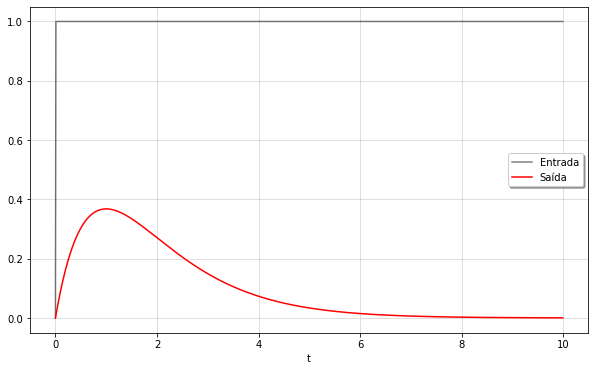

In [68]:
#Definindo a variável de tempo
t=np.linspace(0, 10, 1000,endpoint=False)
input=np.zeros_like(t)
input[t>0.0] = 1

sys1 = signal.TransferFunction([1, 0], [1, 2, 1])
tout, yout = signal.step(sys1, T=t)
          
plt.figure(figsize=(10,6))
plt.plot(t,input,'k',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout, yout, "r", linewidth=1.5, label='Saída')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.5)
plt.xlabel('t')
plt.show()

Nas fases constantes do degrau unitário, ele é um sinal de frequência muito baixa, e na fase de subida ele é um sinal de frequência muito alta. Nesse circuito passa-faixa, pode-se notar que o pico do sinal não alcança a amplitude de entrada do degrau unitário, pois as frequências muito baixas e muito altas são atenuadas muito rapidamente.

### (F) - Resposta à Rampa Unitária

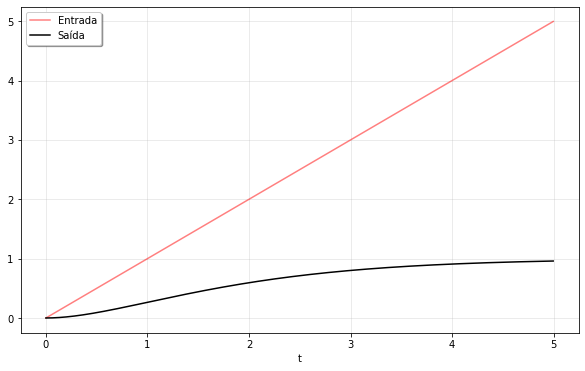

In [69]:
t=np.linspace(0,5,1000,endpoint=False)
u=t

sys1 = signal.TransferFunction([1, 0], [1, 2, 1])
tout, yout, xout = lsim(sys1,U=u,T=t)

plt.figure(figsize = (10,6))
plt.plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout,yout,'k',linewidth=1.5,label='Saída')
plt.legend(loc='upper left',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

A rampa unitária é um sinal que tem a sua maior parte concentrada nas frequências mais baixas. Portanto, o filtro passa-faixa atenua a maior parte do sinal de entrada, ocasionando apenas uma subida inicial. A longo prazo, a resposta tende a se estabilizar.

Podemos comparar esse passa-faixa com os do circuito 1 e 2 da questão 1 da seguinte forma: Se analisarmos o diagrama de Bode desse sistema, percebemos que a sua banda passante inclui frequências menores do que as bandas dos circuitos 1 e 2. Portanto, comparativamente há uma subida maior da curva na resposta à rampa unitária nesse caso, pois como já foi comentado aqui, a maior parte do sinal rampa unitária está concentrada em frequências mais baixas.

### (G) - Resposta a uma onda quadrada de frequência ω

Text(0.5, 0, 't')

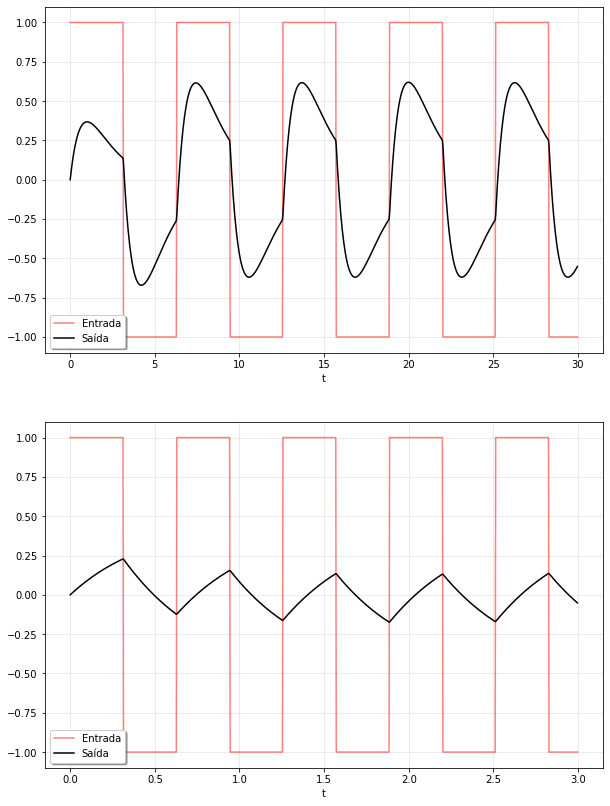

In [70]:
# Frequência = 1 rad/s
w = 1

sys1 = signal.TransferFunction([1, 0], [1, 2, 1])

#Definição da variável tempo e da onda quadrada
t = np.linspace(0, 30, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys1, U=u, T=t)

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (10,14), sharex = False)

graf[0].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')

# Utilizando uma frequência de 10 rad/s, fora da banda passante, para observar uma maior atenuação
w = 10

t = np.linspace(0, 3, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys1, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

Para a resposta à onda quadrada, foi escolhida uma frequência que está dentro da banda passante do filtro, para que seja possível observar que há apenas uma atenuação mínima na resposta do sinal, atenuação essa devida ao fato de que o sistema não é ideal.

No segundo gráfico, há uma atenuação maior da resposta, pois foi utilizada uma frequência fora da banda passante do filtro (10 rad/s).

### (H) até (K) - Resposta aos n harmônicos da série de Fourier de uma onda quadrada de frequência $ω$

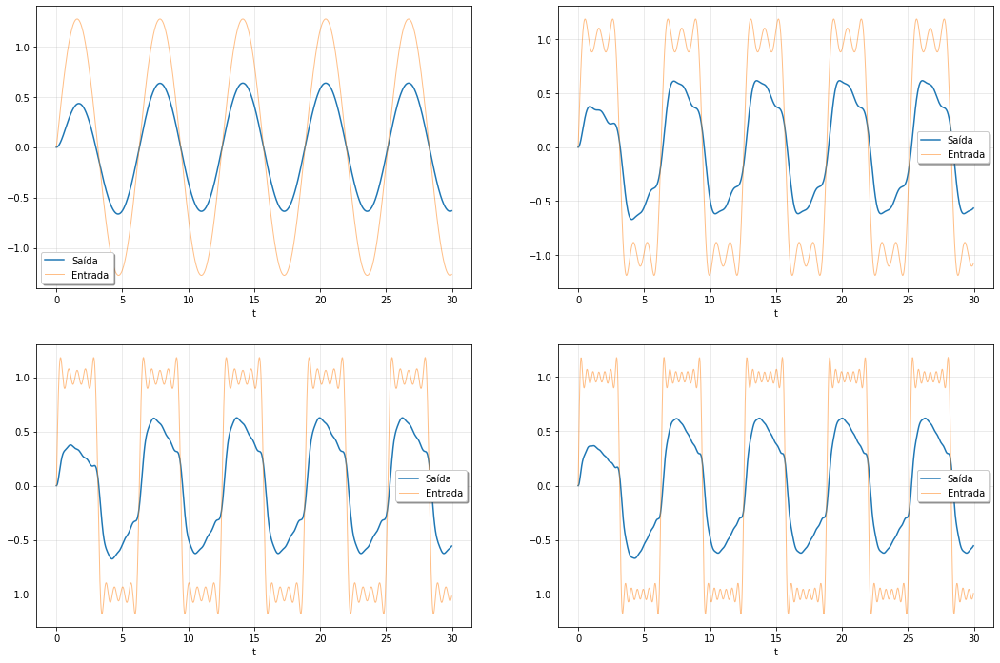

In [71]:
w = 1 # Frequência

t = np.linspace(0, 30, 1000, endpoint=False)

#Função de transferência
sys1 = signal.TransferFunction([1, 0], [1, 2, 1])

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    #Expressão compacta da série de Fourier de onda quadrada
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input1 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys1, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input2 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys1, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys1, U=input3, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys1, U=input3, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

Percebe-se que as curvas nos gráficos são semelhantes àquelas do circuito passa-faixa do afinador de violão.

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à onda quadrada na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a onda quadrada, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à onda quadrada.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à onda quadrada, mas também com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da onda quadrada, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à onda quadrada para este sistema.


### (L) - Resposta a uma Dente de Serra de frequência $\omega$

Text(0.5, 0, 't')

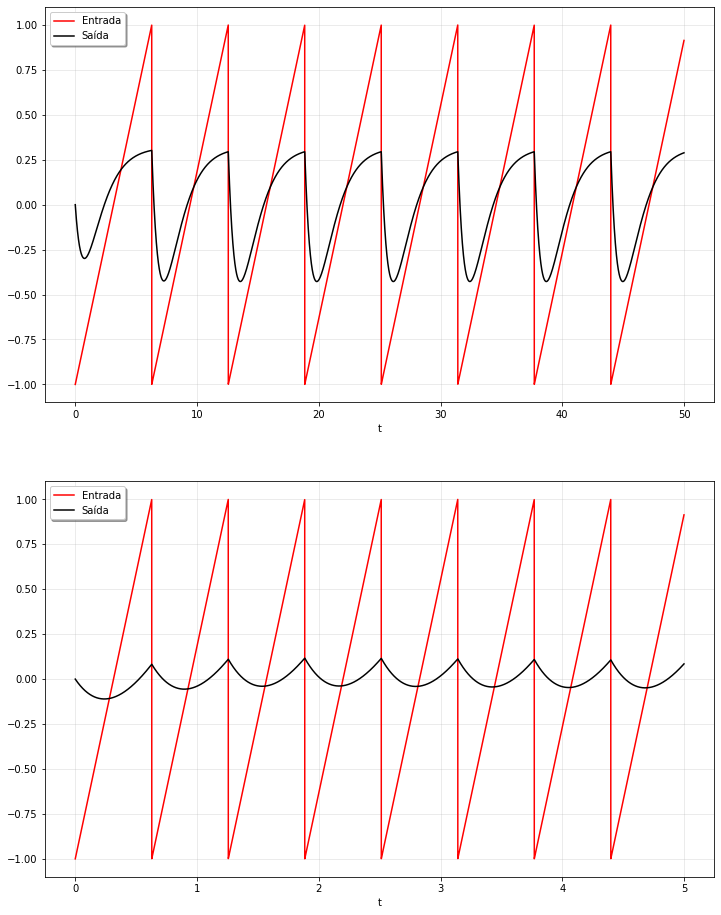

In [72]:
#Foi escolhido uma frequência w de 1 rad/s
w = 1

#Função de transferência
sys1 = signal.TransferFunction([1, 0], [1, 2, 1])

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (12,16), sharex = False)

#Definição da variável tempo e do sinal
t = np.linspace(0, 50, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys1, U=u, T=t)

graf[0].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')

#Foi escolhido uma frequência w de 10 rad/s
w = 10

#Definição da variável tempo e do sinal
t = np.linspace(0, 5, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys1, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

Primeiro gráfico: De novo, escolher uma frequência angular de 1 rad/s, pertencente à banda passante, nos permite visualizar uma atenuação mínima do sinal. Também é possível reparar a distorção do sinal de resposta no início de cada período da onda.

Segundo gráfico: Com uma frequência angular mais alta, de 10 rad/s (fora da banda passante), percebe-se uma maior atenuação do sinal na resposta à dente de serra.

### (M) até (P) - Resposta aos n harmônicos da série de Fourier de uma dente de serra de frequência $ω$

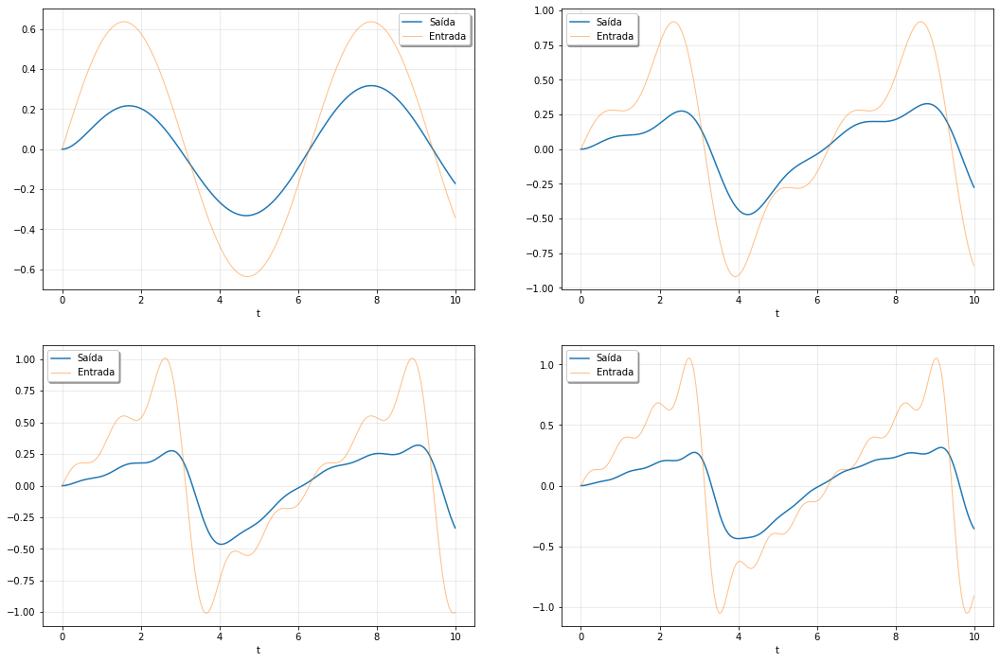

In [73]:
#Foi escolhido uma frequência w de 100
w = 1

#Função de transferência
sys1 = signal.TransferFunction([1, 0], [1, 2, 1])

t = np.linspace (0, 10, 1000, endpoint=False)

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (((-1)**(num+1))*(np.sin((num)*t*w)))/((num))
    soma += serie
  input1 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys1, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (((-1)**(num+1))*(np.sin((num)*t*w)))/((num))
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys1, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (((-1)**(num+1))*(np.sin((num)*t*w)))/((num))
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys1, U=input2, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (((-1)**(num+1))*(np.sin((num)*t*w)))/((num))
    soma += serie
  input4 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys1, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à dente de serra na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a dente de serra, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à dente de serra, mas também com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores. Por consequência, a resposta se assemelha à resposta à dente de serra para este sistema.

### (R) - Diagrama de Blocos de forma prática

Analisando o diagrama de Bode desse sistema, percebe-se que é um passa-faixa com perfil de curva de Bode semelhante ao circuito 2 da questão 1. Portanto, seria possível montar esse diagrama de blocos na prática através de um circuito RLC, bastando apenas modificar os valores dos componentes para chegar no intervalo de banda necessário.

### (S) - Aplicação

Como trata-se de um filtro passa-faixa, ele pode ser utilizado em transmissões de rádio, selecionando o intervalo de banda certo para as frequências que serão transmitidas e atenuando as demais frequências.

## Diagrama de Blocos 2 (Figura 9)




### (A) e (B) - EDO e Função de Transferência

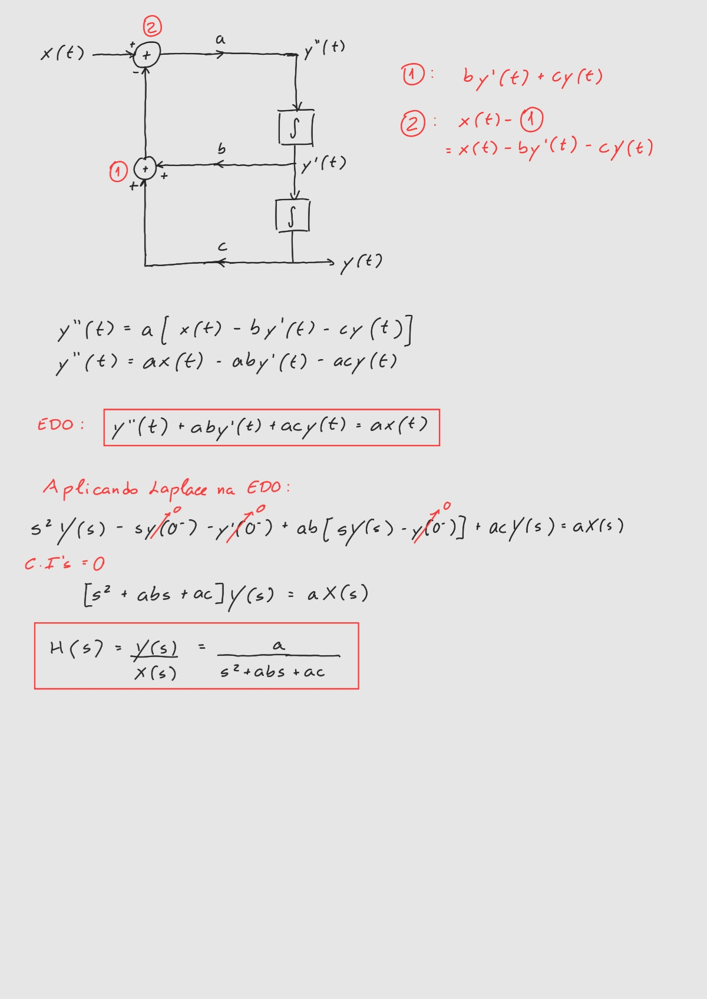

### (C) - Diagrama de Polos e Zeros

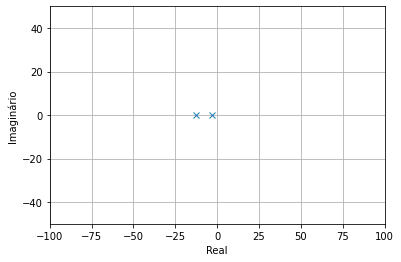

<Figure size 72x288 with 0 Axes>

In [74]:
random.seed(100)
a = random.randint(2, 10)
b = random.randint(1, 6)
c= random.randint(7, 12)

(zeros, poles, gain) = tf2zpk([a], [1, a*b, a*c])
angle = np.linspace(-np.pi, np.pi, 500)
cirx = np.sin(angle)
ciry = np.cos(angle)

plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
plt.grid()
plt.xlim((-100, 100))
plt.xlabel('Real')
plt.ylim((-50, 50))
plt.ylabel('Imaginário')
plt.figure()

plt.gcf().set_figwidth(1)

Por esse diagrama fica evidente que o sistema é assintóticamente estável, pois todos os seus polos estão situados no SPLE.

### (D) - Diagrama de Bode


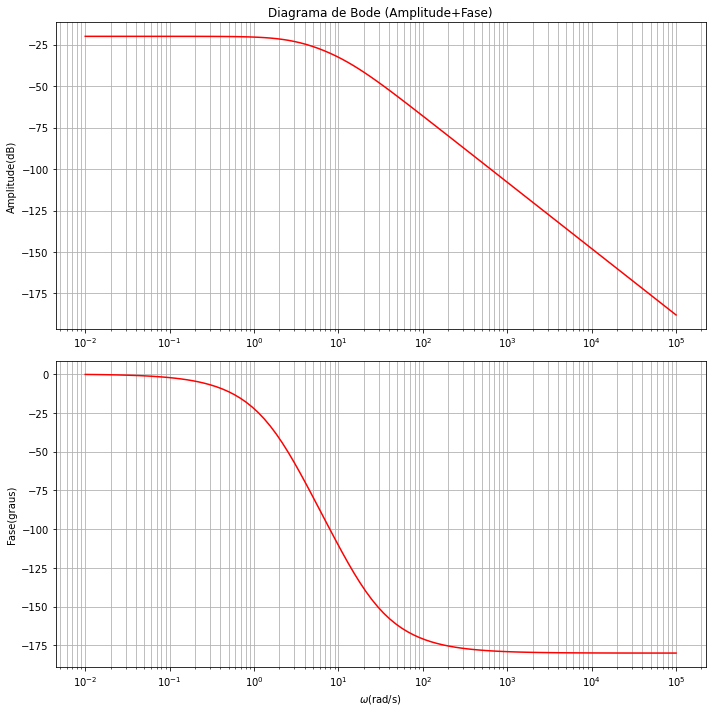

In [75]:
random.seed(100)
a = random.randint(2, 10)
b = random.randint(1, 6)
c= random.randint(7, 12)

sys2 = signal.TransferFunction([a], [1, a*b, a*c])

w = np.logspace(-2,5,num=100, base=10.0)
w, mag, fase = signal.bode(sys2,w=w,n=200)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].semilogx(w,mag, label='Magnitude', color='r') # Plot do Diagrama de Magnitude
graf[0].set_ylabel('Amplitude(dB)')
graf[0].grid(True, which="both", ls="-")

graf[1].semilogx(w,fase, label='Fase', color='r') # Plot do Diagrama de Fase
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('$\omega$(rad/s)')
graf[1].grid(True, which="both", ls="-")

plt.tight_layout()
plt.show()

Esse diagrama de Bode é típico de um filtro passa-baixa, pois atenua as frequências maiores do que a frequência de corte (um pouco maior do que 1 rad/s), e deixa passar as frequências abaixo dessa frequência de corte. Porém, percebe-se que o diagrama de amplitudes está localizado totalmente na parte negativa do eixo das amplitudes. Portanto, até mesmo as baixas frequências sofrerão uma atenuação, mesmo que seja menor do que a atenuação das frequências mais altas.

A fase varia entre 0 e -180º, evidenciando a existência de um polo de segunda ordem. Essa transição ocorre na frequência de corte.

### (E) - Resposta ao Degrau Unitário

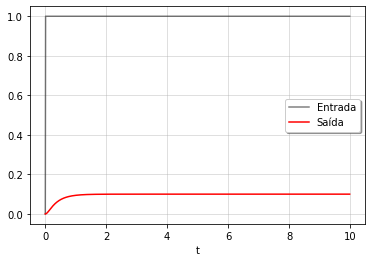

In [76]:
random.seed(100)
a = random.randint(2, 10)
b = random.randint(1, 6)
c= random.randint(7, 12)

#Definindo a variável de tempo
t=np.linspace(0, 10, 1000,endpoint=False)
input=np.zeros_like(t)
input[t>0.0] = 1

sys2 = signal.TransferFunction([a], [1, a*b, a*c])
tout, yout = signal.step(sys2, T=t)
          
plt.plot(t,input,'k',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout, yout, "r", linewidth=1.5, label='Saída')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.5)
plt.xlabel('t')
plt.show()

Como a subida do degrau unitário possui altíssima frequência, o filtro passa-baixa atenuará o sinal, que junto com o atraso da resposta natural do sistema, provoca uma curva suave durante o crescimento do sinal de saída. Quando o degrau se estabiliza e fica constante, com frequências baixas, o filtro deixa passar totalmente o sinal e a resposta começa a estabilizar também. Porém, há uma perda de amplitude em relação ao sinal de saída, evidenciada pelo fato do diagrama de Bode da amplitude desse sistema estar todo na parte negativa do eixo das amplitudes em dB, provocando uma atenuação.


### (F) - Resposta à Rampa Unitária

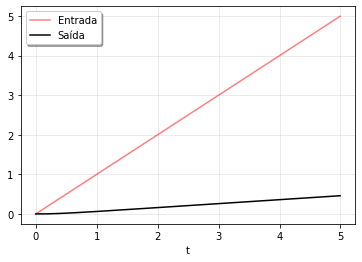

In [77]:
random.seed(100)
a = random.randint(2, 10)
b = random.randint(1, 6)
c= random.randint(7, 12)

t=np.linspace(0,5,1000,endpoint=False)
u=t

sys2 = signal.TransferFunction([a], [1, a*b, a*c])
tout, yout, xout = lsim(sys2,U=u,T=t)

plt.plot(t,u,'r',alpha=0.5,linewidth=1.5,label='Entrada')
plt.plot(tout,yout,'k',linewidth=1.5,label='Saída')
plt.legend(loc='upper left',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

Como a maior parte do sinal de entrada está concentrada nas frequências mais baixas, um filtro passa-baixa irá deixar passar a maior parte do sinal, providenciando como resposta do sistema uma outra rampa. Porém, esta rampa terá uma inclinação visivelmente menor, devido à atenuação do sistema, já discutida no diagrama de Bode. Percebe-se que bem no início do sinal, a onda é levemente atenuada, por causa da verticalização da entrada e do atraso da resposta, formando uma curva inicial, mas que depois de um tempo tende a se estabilizar e formar uma rampa.

### (G) - Resposta a uma onda quadrada de frequência ω

Text(0.5, 0, 't')

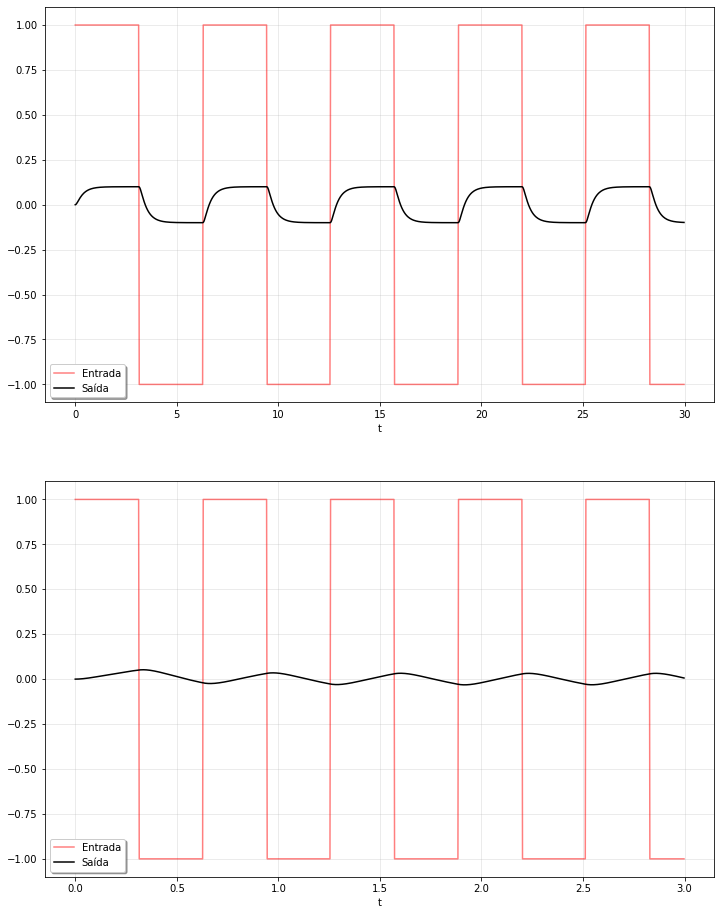

In [78]:
random.seed(100)
a = random.randint(2, 10)
b = random.randint(1, 6)
c= random.randint(7, 12)

# Frequência = 1 rad/s
w = 1

sys2 = signal.TransferFunction([a], [1, a*b, a*c])

#Definição da variável tempo e da onda quadrada
t = np.linspace(0, 30, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys2, U=u, T=t)

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (12,16), sharex = False)

graf[0].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')

# Utilizando uma frequência maior (10 rad/s), conseguimos observar uma maior atenuação
w = 10

t = np.linspace(0, 3, 1000, endpoint=False)
u = signal.square(t*w)

tout, yout, xout = lsim(sys2, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=0.5, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

No primeiro gráfico, foi utilizada uma frequência de 1 rad/s, um pouco menor do que a frequência de corte, para que seja observada pouca atenuação do filtro. Como já discutido no diagrama de Bode, até mesmo as frequências menores do que a frequência de corte sofrerão uma atenuação, fato evidenciado nesse gráfico. Portanto, a forma da resposta é semelhante à onda quadrada, porém com amplitudes menores e uma pequena deformação do sinal.

No segundo gráfico, com uma frequência maior, já é possível observar uma maior atenuação e deformação do sinal. Uma escolha de uma frequência maior do que essa ocasionará a atenuação quase que completa do sinal, sendo possível observar quase que uma linha reta em 0, tornando a análise do gráfico mais complicada.

### (H) até (K) - Resposta aos n harmônicos da série de Fourier de uma onda quadrada de frequência $ω$

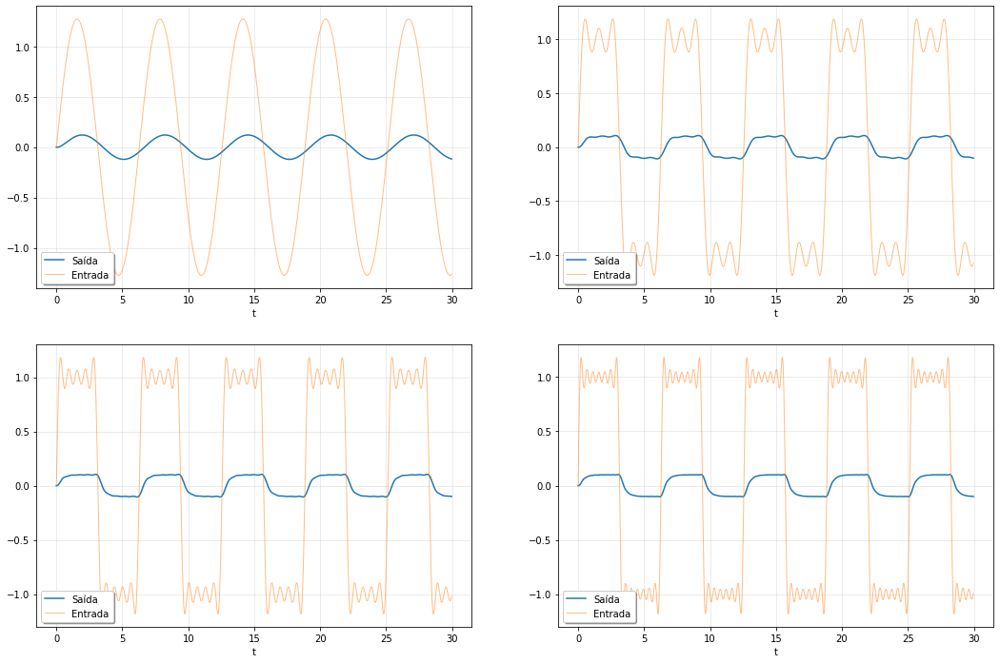

In [79]:
random.seed(100)
a = random.randint(2, 10)
b = random.randint(1, 6)
c= random.randint(7, 12)

w = 1 # Frequência

t = np.linspace(0, 30, 1000, endpoint=False)

#Função de transferência
sys2 = signal.TransferFunction([a], [1, a*b, a*c])

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    #Expressão compacta da série de Fourier de onda quadrada
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input1 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys2, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input2 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys2, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys2, U=input3, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
    soma += serie
  input3 = soma * 4/(np.pi)
  
tout, yout, xout = signal.lsim(sys2, U=input3, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')#

graf[1][1].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à onda quadrada na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a onda quadrada, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à onda quadrada.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes. A resposta começa a tomar a forma da resposta à onda quadrada, mas ainda com pequenas, mas perceptíveis oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da onda quadrada, com oscilações bem menores. Portanto, a resposta se assemelha à resposta à onda quadrada para este sistema.

### (L) - Resposta a uma Dente de Serra de frequência $\omega$

Text(0.5, 0, 't')

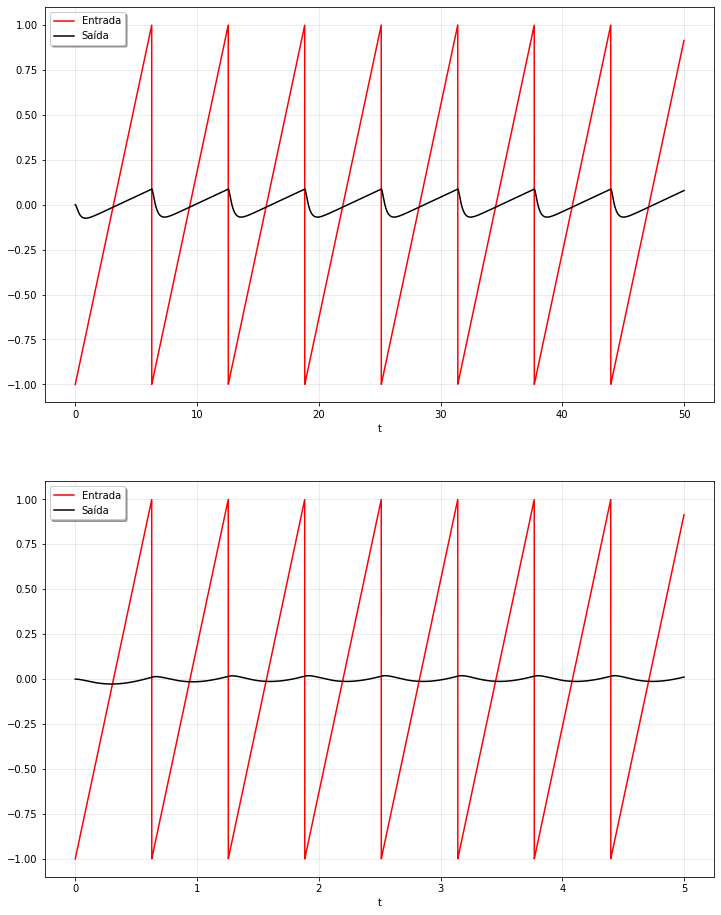

In [80]:
random.seed(100)
a = random.randint(2, 10)
b = random.randint(1, 6)
c= random.randint(7, 12)

#Foi escolhido uma frequência w de 1 rad/s
w = 1

#Função de transferência
sys2 = signal.TransferFunction([a], [1, a*b, a*c])

fig, graf = plt.subplots (nrows = 2, ncols = 1, figsize = (12,16), sharex = False)

#Definição da variável tempo e do sinal
t = np.linspace(0, 50, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys2, U=u, T=t)

graf[0].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[0].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[0].legend(loc='best', shadow=True, framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')

#Foi escolhido uma frequência w de 10 rad/s
w = 10

#Definição da variável tempo e do sinal
t = np.linspace(0, 5, 10000, endpoint=False)
u = signal.sawtooth(w*t)

tout, yout, xout = lsim(sys2, U=u, T=t)

graf[1].plot(t, u, 'r', alpha=1, linewidth=1.5, label='Entrada')
graf[1].plot(tout, yout, 'k', linewidth=1.5, label='Saída')
graf[1].legend(loc='best', shadow=True, framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

Para o primeiro gráfico, foi utilizada uma frequência de 1 rad/s, um pouvo abaixo da frequência de corte. Como já comentado, nesse filtro passa-baixa em particular, mesmo utilizando uma frequência abaixo da frequência de corte, ainda haverá uma atenuação. Também é possível reparar a distorção do sinal de resposta no início de cada período da onda.

No segundo gráfico, com uma frequência maior, já é possível observar uma maior atenuação e deformação do sinal. Uma escolha de uma frequência maior do que essa ocasionará a atenuação quase que completa do sinal, sendo possível observar quase que uma linha reta em 0, tornando a análise do gráfico mais complicada.

### (M) até (P) - Resposta aos n harmônicos da série de Fourier de uma dente de serra de frequência $ω$

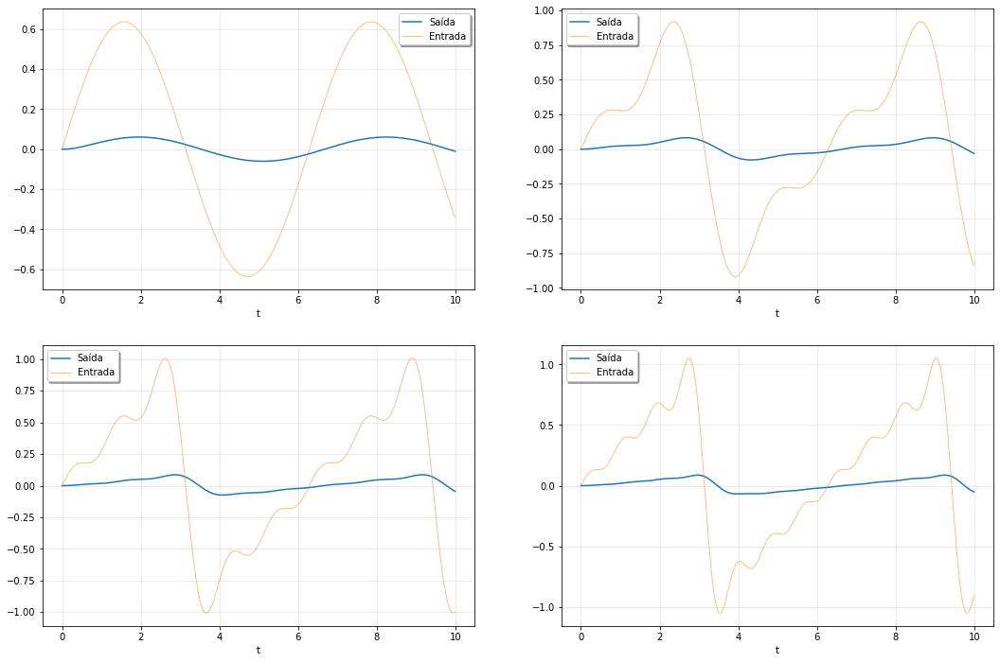

In [81]:
random.seed(100)
a = random.randint(2, 10)
b = random.randint(1, 6)
c= random.randint(7, 12)

#Foi escolhido uma frequência w de 100
w = 1

#Função de transferência
sys2 = signal.TransferFunction([a], [1, a*b, a*c])

t = np.linspace (0, 10, 1000, endpoint=False)

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for harmonico in [1]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (((-1)**(num+1))*(np.sin((num)*t*w)))/((num))
    soma += serie
  input1 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys2, U=input1, T=t)
graf[0][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

for harmonico in [1, 2, 3]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (((-1)**(num+1))*(np.sin((num)*t*w)))/((num))
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys2, U=input2, T=t)
graf[0][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (((-1)**(num+1))*(np.sin((num)*t*w)))/((num))
    soma += serie
  input2 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys2, U=input2, T=t)
graf[1][0].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][0].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

for harmonico in [1, 2, 3, 4, 5, 6, 7]:
  soma = 0
  for num in range(1, harmonico+1):
    serie = (((-1)**(num+1))*(np.sin((num)*t*w)))/((num))
    soma += serie
  input4 = (2/np.pi)*soma
  
tout, yout, xout = signal.lsim(sys2, U=input4, T=t)
graf[1][1].plot(tout, yout, linewidth=1.5, label='Saída')

graf[1][1].plot(t, input4, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')

plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à dente de serra na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a dente de serra, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide. Porém, é perceptível que a resposta já começa a tomar a forma da resposta à dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas com grandes oscilações.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores.

Além disso, percebe-se que as respostas dos três últimos gráficos possuem formatos semelhantes, e correspondem à resposta à dente de serra para este sistema.

De novo, é importante ressaltar que, apesar de o filtro em questão ser um passa-baixa, sinais de frequências menores do que a frequência de corte ainda sofrerão atenuações, ainda que menores do que as atenuações de frequências mais altas, pelos motivos já discutidos em itens anteriores.

### (R) - Diagrama de Blocos de forma prática

Analisando o diagrama de Bode desse sistema, percebe-se que é um filtro passa-baixa com perfil de curva de Bode semelhante ao circuito 3 da questão 1, que também é um passa-baixa. Portanto, é possível montar esse diagrama de blocos na prática com um circuito semelhante ao circuito 3, apenas modificando os valores dos componenentes para ajustar a frequência de corte para o valor necessário.

### (S) - Aplicação

Como trata-se de um filtro passa-baixa, ele pode ser utilizado para a remoção de ruídos em sons de alta frequência.

# Questão 4

## Função de Transferência 1

### (A) - Equação Diferencial Ordinária

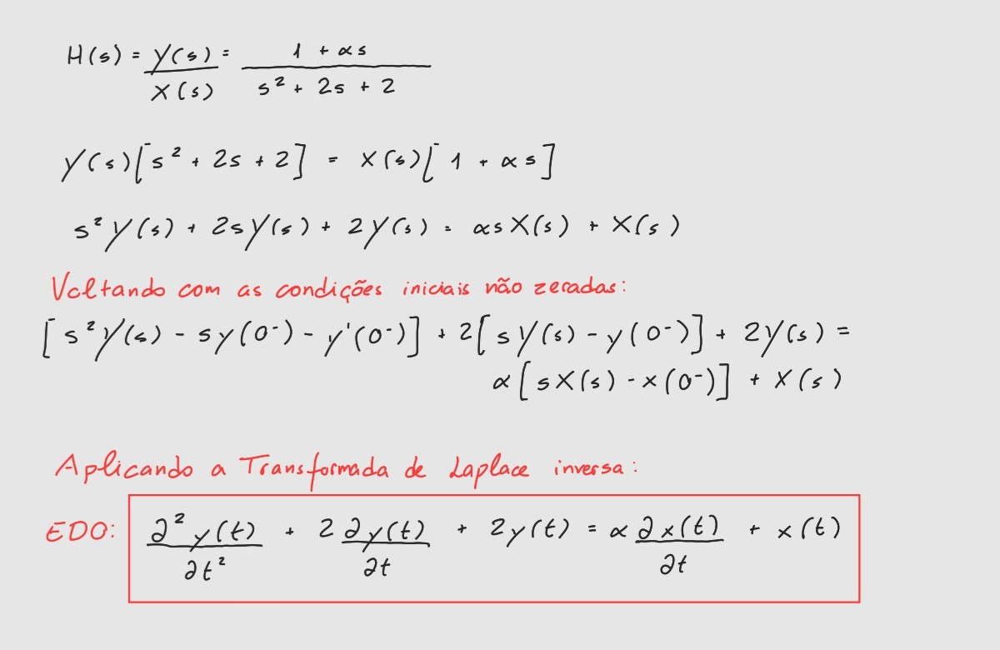

### (B) - Diagrama de Polos e Zeros

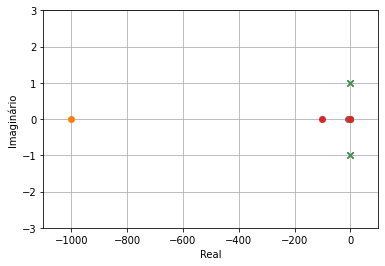

<Figure size 72x288 with 0 Axes>

In [82]:
coef = [ 0.001, 0.01, 0.1, 1, 10,100, 1000]

for alfa in coef:
  (zeros,poles,gain) = tf2zpk([alfa,1], [1,2,2])
  angle = np.linspace(-np.pi,np.pi,500)
  cirx = np.sin(angle)
  ciry = np.cos(angle)
  plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')

plt.grid()
plt.xlim((-1100, 100))
plt.xlabel('Real')
plt.ylim((-3, 3))
plt.ylabel('Imaginário')
plt.figure()
plt.gcf().set_figwidth(1)

Pelo diagrama, percebe-se que o sistema é marginalmente estável, pois possui polos sobre o eixo imaginário, mas não possui nenhum polo no SPLD.

### (C) - Diagrama de Bode

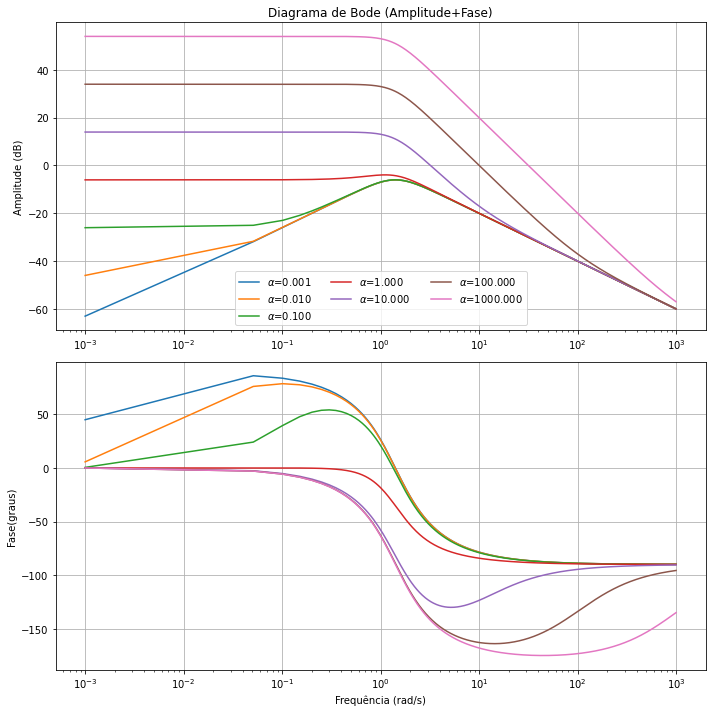

In [83]:
coef = [ 0.001, 0.01, 0.1, 1, 10,100, 1000]
w = np.linspace(0.001, 1000,20000)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

for alfa in coef:
  sys = signal.TransferFunction([1,alfa], [1,2,2])
  w, mag, fase = signal.bode(sys,w=w)

  graf[0].semilogx(w, mag, label=r'$\alpha$=%1.3f'%(alfa))
  graf[1].semilogx(w, fase, label=r'$\alpha$=%1.3f'%(alfa))

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].set_ylabel('Amplitude (dB)')
graf[0].grid()
graf[0].legend(loc='best',ncol=3)
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('Frequência (rad/s)')
graf[1].grid()
plt.tight_layout()
plt.show()

O diagrama de Bode evidencia que, para os valores de $α$ maiores, o sistema é um filtro passa-baixa, pois as frequências maiores que a frequência de corte, que aparenta estar em aproximadamente 1 rad/s, são atenuadas.

Conforme o alfa diminui, menor fica a efetividade do sistema, pois começa a atenuar as frequências mais baixas também, diminuindo cada vez mais o coeficiente de amortecimento. Assim, para  valores de $α$ menores, o sistema passa a atuar como um passa faixa.

Percebe-se que, para os valores de $α$ menores, há uma transição de fase entre 90º e -90º, o que é esperado para um passa-faixa. Para os valores mais altos de $α$, a fase varia entre 0º e 180º, confirmando a existência de um polo de segunda ordem.

### (D) - Resposta ao Degrau Unitário

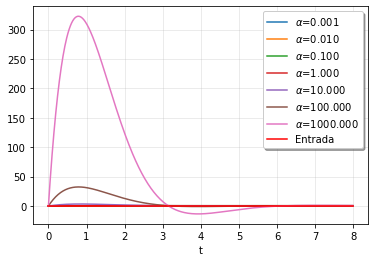

In [84]:
#Definição da variável tempo, dos coeficientes de alfa e do degrau unitário
t=np.linspace(0,8,500,endpoint=False)
coef = [0.001,0.01,0.1,1,10,100,1000]
u=np.zeros_like(t)

for alfa in coef:
  #Definição da função de transferência
  sys=lti([alfa,1],[1,2,2])
          
  #random.seed(alfa*121)
  #random_number=random.randint(1,16777215)
  #hex_number=str(hex(random_number))
  #hex_number='#'+hex_number[2:]

  tout,yout=signal.step(sys,T=t)
  plt.plot(tout,yout,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))

plt.plot(t,u,'r',alpha=1,linewidth=1.5,label='Entrada')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

Na resposta do sistema ao degrau unitário, há um ganho proporcional ao coeficiente alfa na subida da amplitude da resposta. Isso se dá pelo fato do filtro ser um passa-baixa, pois as frequências altíssimas na subida do degrau unitário são atenuadas, gerando essa curva na saída. Como o degrau unitário fica constante depois da subida (baixa frequência), a resposta se estabiliza horizontalmente pois o filtro para de atenuar a amplitude do sinal.

### (E) - Resposta à Rampa Unitária

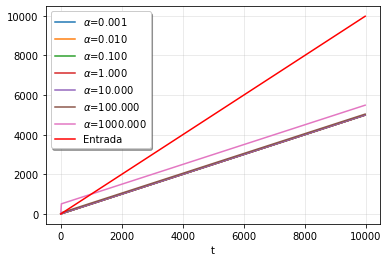

In [85]:
#Definição da variável tempo, dos coeficientes de alfa e do degrau unitário
t=np.linspace(0,10000,500,endpoint=False)
coef = [0.001,0.01,0.1,1,10,100,1000]
u=t

for alfa in coef:
  #Definição da função de transferência
  sys=lti([alfa,1],[1,2,2])

  tout, yout, xout = lsim(sys,U=u,T=t)
  plt.plot(tout,yout,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))

plt.plot(t,u,'r',alpha=1,linewidth=1.5,label='Entrada')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

A maior parte do sinal da rampa unitária está concentrada nas frequências mais baixas. Como o filtro é um passa-baixa para os valores de $α$ maiores, grande parte do sinal de entrada passa livremente, formando outra rampa na resposta. Porém, como foi dito na análise do diagrama de Bode desse sistema, conforme o valor do coeficiente alfa diminui, a efetividade do sistema também diminui, passando a atenuar também as baixas frequências. Isso é traduzido na resposta à rampa unitária com uma inclinação (coeficiente angular) menor da resposta conforme o valor de alfa diminui.

### (F) - Resposta a uma onda quadrada de frequência ω

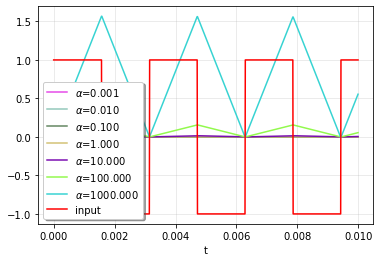

In [86]:
#Definição das variáveis de frequência, tempo e os coeficientes de alfa
w=2000
t=np.linspace(0,0.01,1000,endpoint=False)
coef = [0.001,0.01,0.1,1,10,100,1000]

for alfa in coef:
  sys=lti([alfa,1],[1,2,2])
  
  random.seed(alfa*111)
  random_number=random.randint(1,16777215)
  hex_number=str(hex(random_number))
  hex_number='#'+hex_number[2:]
  
  u = signal.square (w*t)

  tout,yout,xout=lsim(sys,U=u,T=t)
  plt.plot(tout,yout,hex_number,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))

plt.plot(t,u,'r',alpha=1,linewidth=1.5,label='input')
plt.legend(loc='lower left',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

A partir da estimativa da frequência de corte do sistema, na leitura do diagrama de Bode, foi escolhida uma frequência de w = 2000 rad/s, a fim de gerar  atenuação visivel no sinal de saída, e ainda assim ser possível vizualizar o sinal de entrada.

Com isso, podemos ver que a resposta do sistema a onda quadrada mostra uma atenuação que é cada vez mais forte conforme se diminui o alfa.

### (G) até (J) - Resposta aos n harmônicos da série de Fourier de uma onda quadrada de frequência $ω$

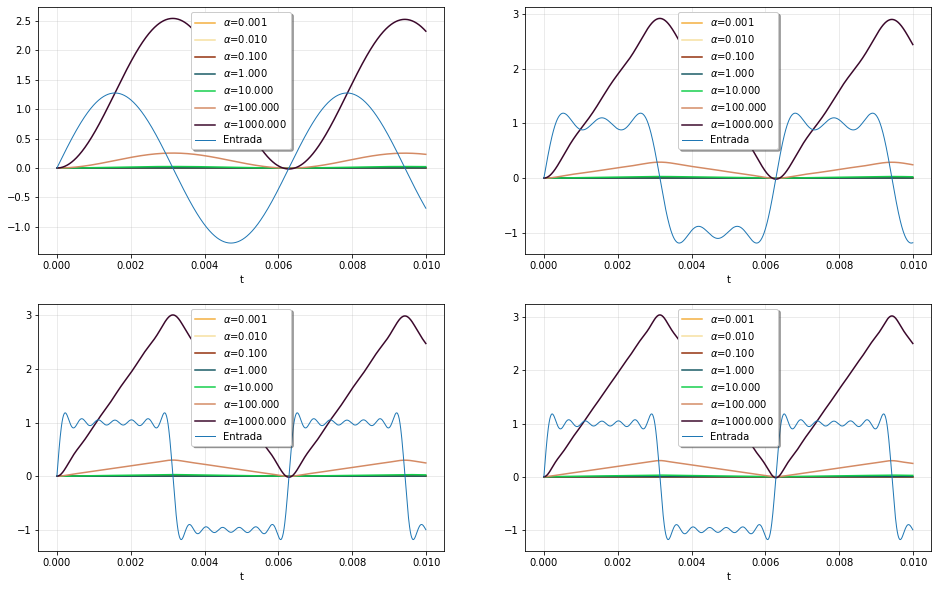

In [87]:
coef = [0.001,0.01,0.1,1,10,100,1000]
t=np.linspace(0,0.01,1000,endpoint=False)
w = 1000

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(16,10), sharex=False)

for alfa in coef:
  sys=lti([alfa,1],[1,2,2])

  random.seed(alfa*121)
  random_number=random.randint(1,16777215)
  hex_number=str(hex(random_number))
  hex_number='#'+hex_number[2:]

  for harmonico in [1]:
    soma = 0
    for num in range(1, harmonico+1):
      #Expressão compacta da série de Fourier de onda quadrada
      serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
      soma += serie
      #Definição do sinal
      input1 = soma * 4/(np.pi)
    
    #graf[0][0].plot(tout,yout,hex_number,linewidth=1.5)
  tout, yout, xout = signal.lsim(sys, U=input1, T=t)
  graf[0][0].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))


  for harmonico in [1, 2, 3]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
      soma += serie
    input2 = soma * 4/(np.pi)
    
    #graf[0][1].plot(tout,yout,hex_number,linewidth=1.5)
  tout, yout, xout = signal.lsim(sys, U=input2, T=t)
  graf[0][1].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))


  for harmonico in [1, 2, 3, 4, 5]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
      soma += serie
    input3 = soma * 4/(np.pi)
    
    #graf[1][0].plot(tout,yout,hex_number,linewidth=1.5)
  tout, yout, xout = signal.lsim(sys, U=input3, T=t)
  graf[1][0].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))


  for harmonico in [1, 2, 3, 4, 5, 6, 7]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
      soma += serie
    input3 = soma * 4/(np.pi)
    
    #graf[1][1].plot(tout,yout,hex_number,linewidth=1.5)
  tout, yout, xout = signal.lsim(sys, U=input3, T=t)
  graf[1][1].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))


graf[0][0].plot(t, input1, alpha=1, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

graf[0][1].plot(t, input2, alpha=1, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

graf[1][0].plot(t, input3, alpha=1, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

graf[1][1].plot(t, input3, alpha=1, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')


plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à onda quadrada na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a onda quadrada, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, com entrada e saída muito diferente da resposta à onda quadrada.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, mas ainda possui oscilações muito grandes.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da onda quadrada, com oscilações bem menores. Portanto, as respostas se assemelham à respostas à onda quadrada para os diferentes valores de $\alpha$ desse sistema.

### (K) - Resposta a uma Dente de Serra de frequência $\omega$

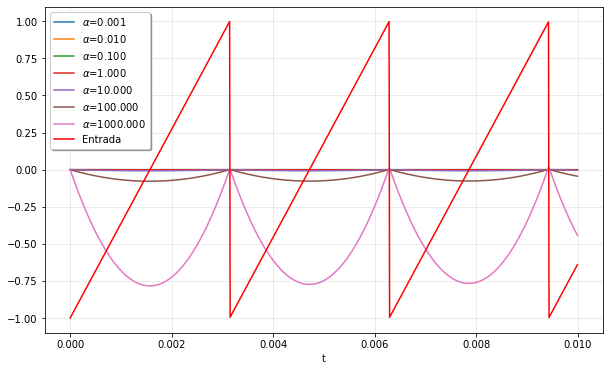

In [88]:
#Definição das variáveis de frequência, tempo e os coeficientes de alfa
w=2000
t=np.linspace(0,0.01,1000,endpoint=False)
coef = [0.001,0.01,0.1,1,10,100,1000]

plt.figure(figsize=(10,6))

for alfa in coef:
  sys=lti([alfa,1],[1,2,2])
  
  #random.seed(alfa*111)
  #random_number=random.randint(1,16777215)
  #hex_number=str(hex(random_number))
  #hex_number='#'+hex_number[2:]

  u = signal.sawtooth(w*t)  

  tout,yout,xout=lsim(sys,U=u,T=t)
  plt.plot(tout,yout,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))

plt.plot(t,u,'r',alpha=1,linewidth=1.5,label='Entrada')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

Como o filtro atua como um passa-baixa para os valores de $α$ maiores, os saltos da dente de serra serão atenuados, formando curvas suaves na resposta. Como evidenciado pelo diagrama de Bode e pelo gráfico acima, para valores de $α > 1$, há um ganho no sistema, proporcional ao valor de $\alpha$. Para valores de $α < 1$, a resposta será atenuada de maneira inversamente proporcional ao valor de $α$.

### (L) até (O) - Resposta aos n harmônicos da série de Fourier de uma dente de serra de frequência $ω$

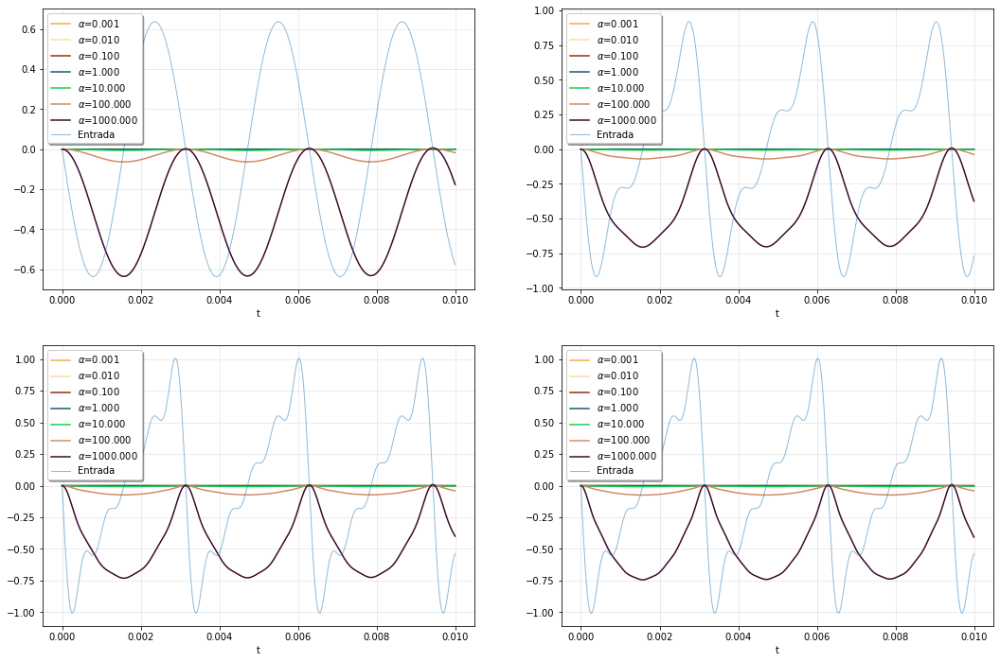

In [89]:
coef = [0.001,0.01,0.1,1,10,100,1000]
t=np.linspace(0,0.01,1000,endpoint=False)
w = 2000

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for alfa in coef:
  sys=signal.TransferFunction([alfa,1],[1,2,2])

  random.seed(alfa*121)
  random_number=random.randint(1,16777215)
  hex_number=str(hex(random_number))
  hex_number='#'+hex_number[2:]

  for harmonico in [1]:
    soma = 0
    for num in range(1, harmonico+1):
      #Expressão compacta da série de Fourier da dente de serra
      serie = ((-1**(num+1))*(np.sin((num)*t*w)))/((num))
      soma += serie
      #Definição do sinal
      input1 = (2/np.pi)*soma
    
    #graf[0][0].plot(tout,yout,hex_number,linewidth=1.5)

  tout, yout, xout = signal.lsim(sys, U=input1, T=t)
  graf[0][0].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))


  for harmonico in [1, 2, 3]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = ((-1**(num+1))*(np.sin((num)*t*w)))/((num))
      soma += serie
    input2 = (2/np.pi)*soma
    
    #graf[0][1].plot(tout,yout,hex_number,linewidth=1.5)
  
  tout, yout, xout = signal.lsim(sys, U=input2, T=t)
  graf[0][1].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))


  for harmonico in [1, 2, 3, 4, 5]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = ((-1**(num+1))*(np.sin((num)*t*w)))/((num))
      soma += serie
    input3 = (2/np.pi)*soma
    
    #graf[1][0].plot(tout,yout,hex_number,linewidth=1.5)

  tout, yout, xout = signal.lsim(sys, U=input3, T=t)
  graf[1][0].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))


  for harmonico in [1, 2, 3, 4, 5, 6, 7]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = ((-1**(num+1))*(np.sin((num)*t*w)))/((num))
      soma += serie
    input4 = (2/np.pi)*soma
    
    #graf[1][1].plot(tout,yout,hex_number,linewidth=1.5)

  tout, yout, xout = signal.lsim(sys, U=input4, T=t)
  graf[1][1].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\alpha$=%1.3f'%(alfa))


graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

graf[1][1].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')


plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à dente de serra na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a dente de serra, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide, ainda longe do formato da dente de serra.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, mas com grandes oscilações, com a resposta mais próxima da resposta à dente de serra do que a do primeiro harmônico.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores. Além disso, percebe-se que as respostas para os diferentes valores de $α$ possuem formatos semelhantes à resposta à dente de serra para este sistema.

## Função de Transferência 2

### (A) - Equação Diferencial Ordinária

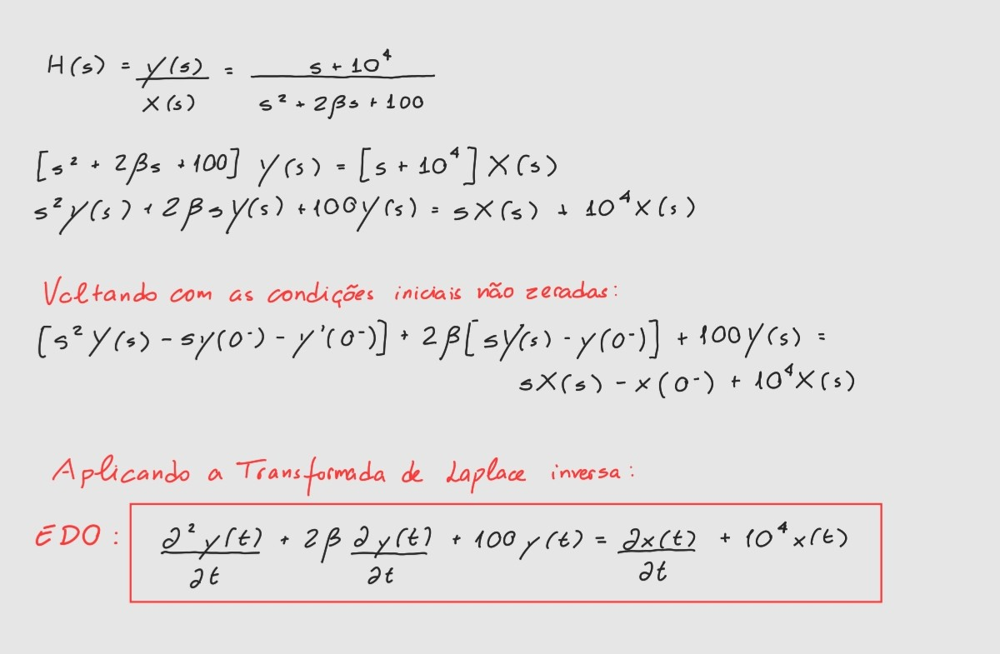

### (B) - Diagrama de Polos e Zeros

[]

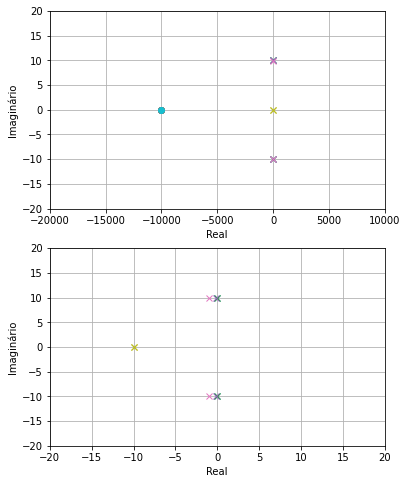

In [90]:
coef = [0.001, 0.01, 0.1, 1, 10]

fig, graf = plt.subplots (nrows = 2, ncols=1, figsize = (6,8), sharex=False)

for beta in coef:
  (zeros,poles,gain) = tf2zpk([1,10000], [1,2*beta,100])
  angle = np.linspace(-np.pi,np.pi,500)
  cirx = np.sin(angle)
  ciry = np.cos(angle)
  #plt.plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
  graf[0].plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')
  graf[1].plot(poles.real, poles.imag, 'x', zeros.real, zeros.imag, 'o')

graf[0].grid()
graf[0].set_xlim((-20000, 10000))
graf[0].set_xlabel('Real')
graf[0].set_ylim((-20, 20))
graf[0].set_ylabel('Imaginário')


graf[1].grid()
graf[1].set_xlim((-20, 20))
graf[1].set_xlabel('Real')
graf[1].set_ylim((-20, 20))
graf[1].set_ylabel('Imaginário')

plt.plot()

#plt.grid()
#plt.xlim((-20000, 10000))
#plt.xlabel('Real')
#plt.ylim((-20, 20))
#plt.ylabel('Imaginário')
#plt.figure()
#plt.gcf().set_figwidth(1)

Por esse diagrama, conclui-se que o sistema é marginalmente estável, pois tem polos de multiplicidade 1 no eixo imaginário.

Obs: Para $\beta = 10$, há um polo de multiplicidade 2, mas é real e igual a -10, portanto está situado no SPLE.

### (C) - Diagrama de Bode

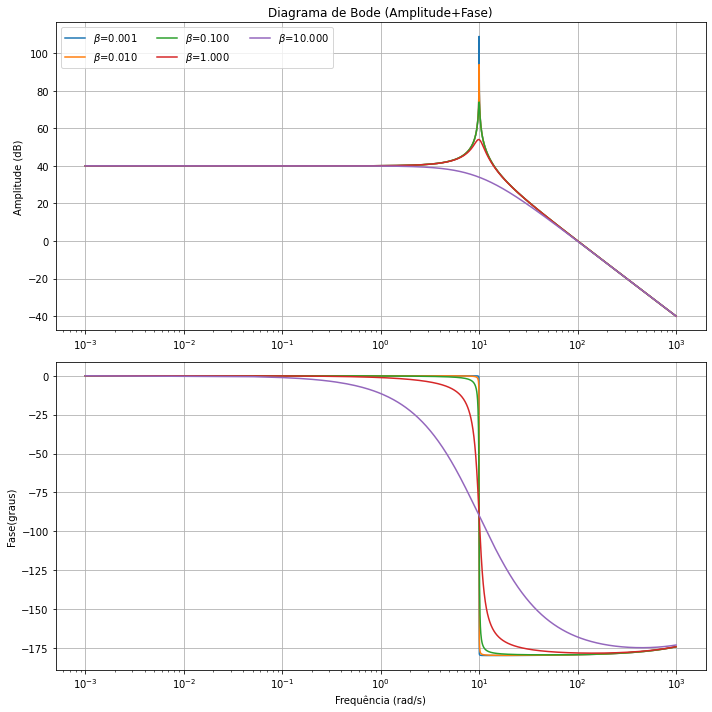

In [91]:
coef = [0.001, 0.01, 0.1, 1, 10]
w = np.linspace(0.001, 1000,20000)

fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

for beta in coef:
  sys = signal.TransferFunction([1,10000], [1,2*beta,100])
  w, mag, fase = signal.bode(sys,w=w)

  graf[0].semilogx(w, mag, label=r'$\beta$=%1.3f'%(beta))
  graf[1].semilogx(w, fase, label=r'$\beta$=%1.3f'%(beta))

graf[0].set_title('Diagrama de Bode (Amplitude+Fase)')
graf[0].set_ylabel('Amplitude (dB)')
graf[0].grid()
graf[0].legend(loc='best',ncol=3)
graf[1].set_ylabel('Fase(graus)')
graf[1].set_xlabel('Frequência (rad/s)')
graf[1].grid()
plt.tight_layout()
plt.show()

Esse diagrama corresponde à um filtro passa-baixa, pois as frequências maiores do que a frequência de corte (10 rad/s de acordo com o gráfico) são atenuadas.

Pelo diagrama é possível perceber uma forte ressonância, que fica cada vez maior conforme diminui o valor de $β$. Também é possível perceber um ganho de 40dB para as frequências mais baixas.

Há uma diferença de fase de 0º a 180º, confirmando a existência de um polo de segunda ordem na função de transferência. Conforme o valor de $α$ diminui, essa transição de fase se torna cada vez mais brusca.

### (D) - Resposta ao Degrau Unitário

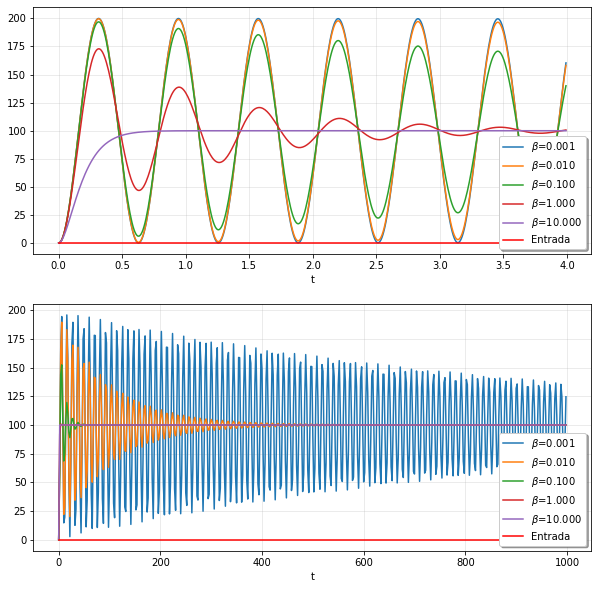

In [92]:
fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

#Definição da variável tempo, dos coeficientes de beta e do degrau unitário
t=np.linspace(0,4,500,endpoint=False)
coef = [0.001, 0.01, 0.1, 1, 10]
u=np.zeros_like(t)

for beta in coef:
  #Definição da função de transferência
  sys=lti([1,10000], [1,2*beta,100])
          
  #random.seed(beta*121)
  #random_number=random.randint(1,16777215)
  #hex_number=str(hex(random_number))
  #hex_number='#'+hex_number[2:]

  tout,yout=signal.step(sys,T=t)
  graf[0].plot(tout,yout,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))

graf[0].plot(t,u,'r',alpha=1,linewidth=1.5,label='Entrada')
graf[0].legend(loc='lower right',shadow=True,framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')

# Analisando com um linspace maior
t=np.linspace(0,1000,500,endpoint=False)
u=np.zeros_like(t)

for beta in coef:
  #Definição da função de transferência
  sys=lti([1,10000], [1,2*beta,100])
          
  #random.seed(beta*121)
  #random_number=random.randint(1,16777215)
  #hex_number=str(hex(random_number))
  #hex_number='#'+hex_number[2:]

  tout,yout=signal.step(sys,T=t)
  graf[1].plot(tout,yout,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))

graf[1].plot(t,u,'r',alpha=1,linewidth=1.5,label='Entrada')
graf[1].legend(loc='lower right',shadow=True,framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()

Na fase de subida do degrau unitário, ele é um sinal de frequência muito alta. Como o circuito é um passa-baixa, essas frequências mais altas serão atenuadas muito rapidamente.

Como há um polo de segunda ordem na função de transferência desse circuito, há um coeficiente de amortecimento, que provoca um **amortecimento subcrítico**, formando essa curva senóide de amplitude decrescente, percebida na curva vermelha do primeiro gráfico ($β = 1$).

No segundo gráfico, podemos perceber que para todos os valores de $β$, haverá um amortecimento. Porém, quanto menor o valor de beta, mais tempo demorará para que esse amortecimento seja total, devido à amplitude inicial das ondas relativas aos diferentes coeficientes.

É válido ressaltar que existe um ganho nesse sistema, como foi discutido no diagrama de Bode.



### (E) - Resposta à Rampa Unitária

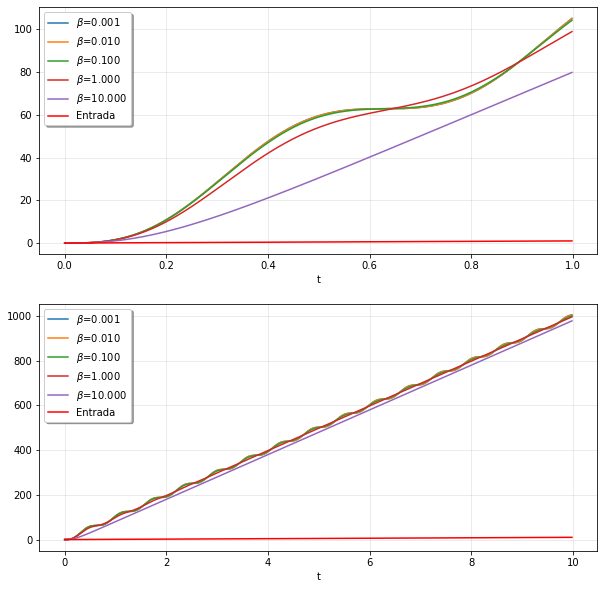

In [93]:
fig, graf = plt.subplots(nrows=2, ncols=1, figsize=(10,10), sharex=False)

#Definição da variável tempo, dos coeficientes de beta e do degrau unitário
t=np.linspace(0,1,500,endpoint=False)
coef = [0.001, 0.01, 0.1, 1, 10]
u=t

for beta in coef:
  #Definição da função de transferência
  sys=lti([1,10000], [1,2*beta,100])

  tout, yout, xout = lsim(sys,U=u,T=t)
  graf[0].plot(tout,yout,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))

graf[0].plot(t,u,'r',alpha=1,linewidth=1.5,label='Entrada')
graf[0].legend(loc='best',shadow=True,framealpha=1)
graf[0].grid(alpha=0.3)
graf[0].set_xlabel('t')

# Analise do grafico em um linspace maior
t=np.linspace(0,10,500,endpoint=False)
u=t

for beta in coef:
  #Definição da função de transferência
  sys=lti([1,10000], [1,2*beta,100])

  tout, yout, xout = lsim(sys,U=u,T=t)
  graf[1].plot(tout,yout,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))

graf[1].plot(t,u,'r',alpha=1,linewidth=1.5,label='Entrada')
graf[1].legend(loc='best',shadow=True,framealpha=1)
graf[1].grid(alpha=0.3)
graf[1].set_xlabel('t')

plt.show()

O espectro de Fourier da rampa unitária nos mostra que a maior parte da intensidade do sinal está concentrada em frequências mais baixas. Portanto, o filtro passa-baixa irá deixar passar a maior parte do sinal. Porém, como há um ganho no sistema, a inclinação da resposta será maior do que a rampa unitária.

No segundo gráfico, podemos perceber que as respostas tendem a formar uma rampa com uma inclinação maior, devido ao ganho. As oscilações observadas são causadas pela ressonância, já destacada no diagrama de Bode.

### (F) - Resposta a uma onda quadrada de frequência ω

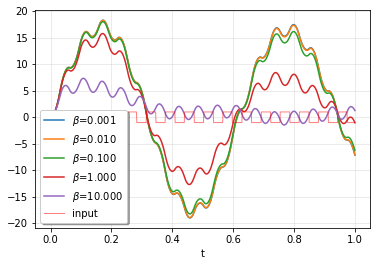

In [94]:
#Definição das variáveis de frequência, tempo e os coeficientes de beta
w=100
t=np.linspace(0,1,1000,endpoint=False)
coef = [0.001, 0.01, 0.1, 1, 10]

for beta in coef:
  sys=lti([1,10000], [1,2*beta,100])
  
  #random.seed(beta*111)
  #random_number=random.randint(1,16777215)
  #hex_number=str(hex(random_number))
  #hex_number='#'+hex_number[2:]

  u=signal.square((2*np.pi)*t*w/(2*np.pi))
  
  tout,yout,xout=lsim(sys,U=u,T=t)
  plt.plot(tout,yout,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))

plt.plot(t,u,'r',alpha=0.5,linewidth=1,label='input')
plt.legend(loc='lower left',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

Foi escolhido uma frequência de 100 rad/s, maior do que a frequência de corte, para que possa ser percebida a atenuação do sinal.

Percebe-se que o sinal sofre ressonância, aumentando a amplitude da resposta. Quanto maior o beta, menor é o fenômeno da ressonância.

### (G) até (J) - Resposta aos n harmônicos da série de Fourier de uma onda quadrada de frequência $ω$

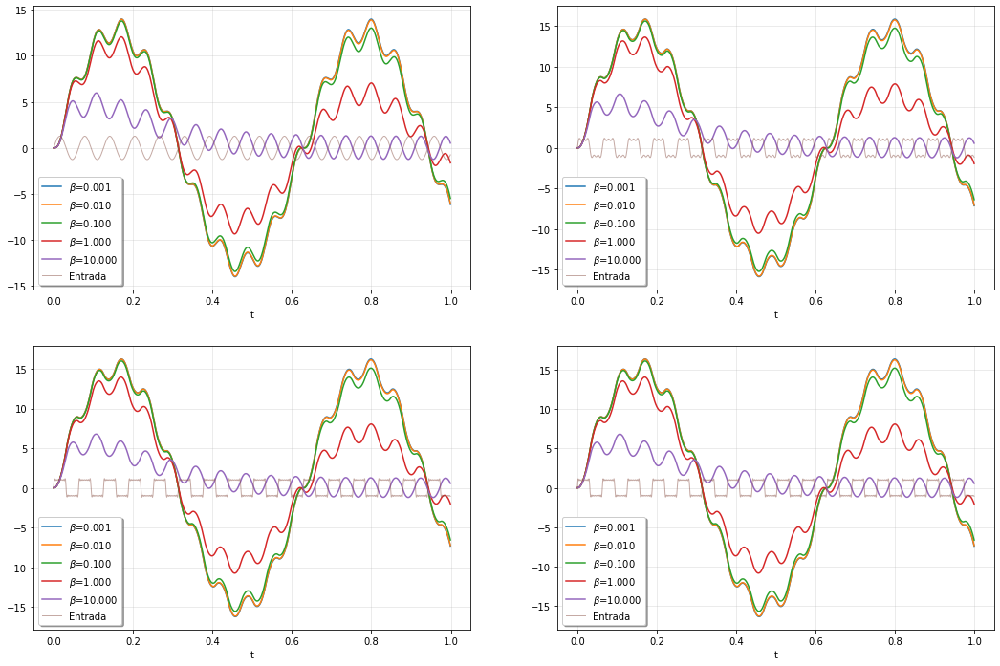

In [95]:
coef = [0.001, 0.01, 0.1, 1, 10]
t=np.linspace(0,1,1000,endpoint=False)
w = 100
num=0

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for beta in coef:
  sys=lti([1,10000], [1,2*beta,100])

  random.seed(beta*121)
  random_number=random.randint(1,16777215)
  hex_number=str(hex(random_number))
  hex_number='#'+hex_number[2:]

  for harmonico in [1]:
    soma = 0
    for num in range(1, harmonico+1):
      #Expressão compacta da série de Fourier de onda quadrada
      serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
      soma += serie
      input1 = soma * 4/(np.pi)

    
    #graf[0][0].plot(tout,yout,hex_number,linewidth=1.5)
  
  tout, yout, xout = signal.lsim(sys, U=input1, T=t)
  graf[0][0].plot(tout,yout,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))


  for harmonico in [1, 2, 3]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
      soma += serie
    input2 = soma * 4/(np.pi)
    
    #graf[0][1].plot(tout,yout,hex_number,linewidth=1.5)

  tout, yout, xout = signal.lsim(sys, U=input2, T=t)
  graf[0][1].plot(tout,yout,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))


  for harmonico in [1, 2, 3, 4, 5]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
      soma += serie
    input3 = soma * 4/(np.pi)
    
    #graf[1][0].plot(tout,yout,hex_number,linewidth=1.5)

  tout, yout, xout = signal.lsim(sys, U=input3, T=t)
  graf[1][0].plot(tout,yout,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))


  for harmonico in [1, 2, 3, 4, 5, 6, 7]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = (np.sin(((2*num)-1)*t*w))/((2*num)-1)
      soma += serie
    input3 = soma * 4/(np.pi)
    
    #graf[1][1].plot(tout,yout,hex_number,linewidth=1.5)

  tout, yout, xout = signal.lsim(sys, U=input3, T=t)
  graf[1][1].plot(tout,yout,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))


graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

graf[1][1].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')


plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à onda quadrada na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a onda quadrada, devido ao fenômeno de Gibbs.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide. Porém, é perceptível que as respostas já começam a tomar a forma da resposta à onda quadrada para os diferentes valores de $β$.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma onda quadrada, com oscilações um pouco menores do que a do primeiro harmônico.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da onda quadrada, com oscilações bem menores. Além disso, percebe-se que as respostas entre todos os gráficos possuem formatos semelhantes, e correspondem à resposta à onda quadrada para este sistema.

### (K) - Resposta a uma Dente de Serra de frequência $\omega$

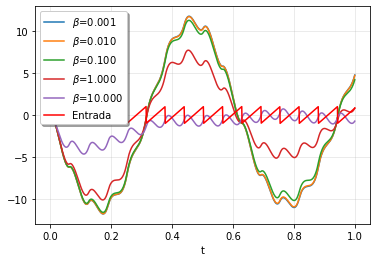

In [96]:
#Definição das variáveis de frequência, tempo e os coeficientes de beta
coef = [0.001, 0.01, 0.1, 1, 10]


w=100
t=np.linspace(0,1,1000,endpoint=False)
u = signal.sawtooth(w*t)  

for beta in coef:
  sys=signal.TransferFunction([1,10000], [1,2*beta,100])
  
  #random.seed(beta*111)
  #random_number=random.randint(1,16777215)
  #hex_number=str(hex(random_number))
  #hex_number='#'+hex_number[2:]

  tout,yout,xout=lsim(sys,U=u,T=t)
  plt.plot(tout,yout,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))

plt.plot(t,u,'r',alpha=1,linewidth=1.5,label='Entrada')
plt.legend(loc='best',shadow=True,framealpha=1)
plt.grid(alpha=0.3)
plt.xlabel('t')
plt.show()

Analisando o gráfico, observa-se que a resposta à dente de serra desse sistema é o inverso da resposta à onda quadrada. Percebe-se que o sinal sofre ressonância, aumentando a amplitude da resposta. Quanto maior o beta, menor é o fenômeno da ressonância.

Foi escolhido uma frequência de 100 rad/s, maior do que a frequência de corte, para que possa ser percebida a atenuação do sinal.



### (L) até (O) - Resposta aos n harmônicos da série de Fourier de uma dente de serra de frequência $ω$

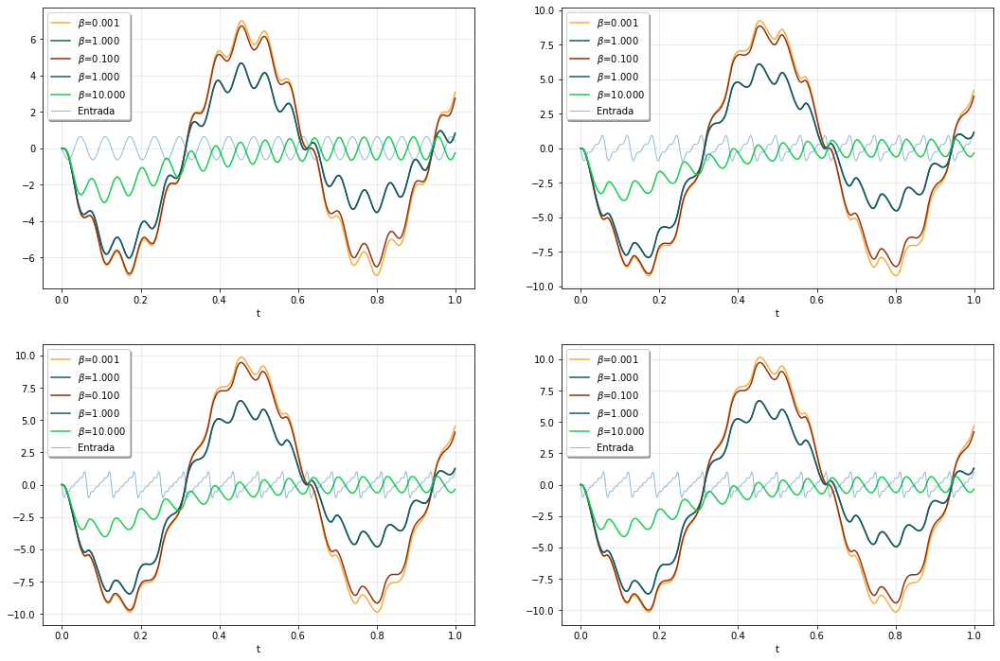

In [97]:
coef = [0.001, 1, 0.1, 1, 10]
t=np.linspace(0, 1,1000,endpoint=False)
w = 100

fig, graf = plt.subplots(nrows=2, ncols=2, figsize=(18,12), sharex=False)

for beta in coef:
  sys=signal.TransferFunction([1,10000], [1,2*beta,100])

  random.seed(beta*121)
  random_number=random.randint(1,16777215)
  hex_number=str(hex(random_number))
  hex_number='#'+hex_number[2:]

  for harmonico in [1]:
    soma = 0
    for num in range(1, harmonico+1):
      #Expressão compacta da série de Fourier da dente de serra
      serie = ((-1**(num+1))*(np.sin((num)*t*w)))/num
      soma += serie
      input1 = (2/np.pi)*soma
    
  tout, yout, xout = signal.lsim(sys, U=input1, T=t)
    #graf[0][0].plot(tout,yout,hex_number,linewidth=1.5)

  
  graf[0][0].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))


  for harmonico in [1, 2, 3]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = ((-1**(num+1))*(np.sin((num)*t*w)))/num
      soma += serie
    input2 = (2/np.pi)*soma
    
  tout, yout, xout = signal.lsim(sys, U=input2, T=t)
    #graf[0][1].plot(tout,yout,hex_number,linewidth=1.5)

  graf[0][1].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))


  for harmonico in [1, 2, 3, 4, 5]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = ((-1**(num+1))*(np.sin((num)*t*w)))/num
      soma += serie
    input3 = (2/np.pi)*soma
    
  tout, yout, xout = signal.lsim(sys, U=input3, T=t)
    #graf[1][0].plot(tout,yout,hex_number,linewidth=1.5)

  graf[1][0].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))


  for harmonico in [1, 2, 3, 4, 5, 6, 7]:
    soma = 0
    for num in range(1, harmonico+1):
      serie = ((-1**(num+1))*(np.sin((num)*t*w)))/num
      soma += serie
    input4 = (2/np.pi)*soma
    
  tout, yout, xout = signal.lsim(sys, U=input4, T=t)
    #graf[1][1].plot(tout,yout,hex_number,linewidth=1.5)

  graf[1][1].plot(tout,yout,hex_number,linewidth=1.5,label=r'$\beta$=%1.3f'%(beta))


graf[0][0].plot(t, input1, alpha=0.5, linewidth=1, label='Entrada')
graf[0][0].legend(loc='best', shadow=True, framealpha=1)
graf[0][0].grid(alpha=0.3)
graf[0][0].set_xlabel('t')

graf[0][1].plot(t, input2, alpha=0.5, linewidth=1, label='Entrada')
graf[0][1].legend(loc='best', shadow=True, framealpha=1)
graf[0][1].grid(alpha=0.3)
graf[0][1].set_xlabel('t')

graf[1][0].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][0].legend(loc='best', shadow=True, framealpha=1)
graf[1][0].grid(alpha=0.3)
graf[1][0].set_xlabel('t')

graf[1][1].plot(t, input3, alpha=0.5, linewidth=1, label='Entrada')
graf[1][1].legend(loc='best', shadow=True, framealpha=1)
graf[1][1].grid(alpha=0.3)
graf[1][1].set_xlabel('t')


plt.show()

Analisando os gráficos, podemos perceber que conforme o número de harmônicos aumenta, a soma da série de Fourier fica mais semelhante à dente de serra na entrada. Porém, mesmo tendendo o número de harmônicos ao infinito, a série nunca igualará perfeitamente a dente de serra, devido ao fenômeno de Gibbs.

A resposta à esses harmônicos é o inverso da resposta aos harmônicos da onda quadrada para esse sistema.

No primeiro gráfico, com apenas 1 harmônico, a entrada é apenas uma senóide. Porém, é perceptível que as respostas já começam a tomar a forma da resposta à dente de serra para os diferentes $β$.

No segundo gráfico, a soma da série de Fourier já começa a tomar a forma de uma dente de serra, com oscilações um pouco menores do que a do primeiro harmônico.

No terceiro e quarto gráfico, já temos a soma da série tendendo ao formato da dente de serra, com oscilações bem menores. Além disso, percebe-se que as respostas entre todos os gráficos possuem formatos semelhantes, e correspondem à resposta à dente de serra para este sistema.